In [4]:
# %pip install torch pandas numpy matplotlib seaborn scipy scikit-learn

In [5]:
import torch
import os

# Configure GPU setting for optimal performance
if torch.cuda.is_available():
  print(f"CUDA available: {torch.cuda.is_available()}")
  print(f"GPU count: {torch.cuda.device_count()}")
  print(f"GPU name: {torch.cuda.get_device_name(0)}")

  # Set CUDE device
  os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Use first GPU

  # Enable CUDE OPtimization
  torch.backends.cudnn.benchmark = True

  # Print GPU info
  gpu_info = !nvidia-smi
  gpu_info = '\n'.join(gpu_info)
  if gpu_info.find('failed') >= 0:
    print('Not connected to a GPU')
  else:
      print(gpu_info)
else:
  # Configure CPU
  num_cpu_cores = os.cpu_count()
  print(f"Number of CPU cores available: {num_cpu_cores}")
  print(f"Number of CPU cores using: {num_cpu_cores-1}")

  # Use slightly fewer than max cores to leave resources for the OS
  torch.set_num_threads(num_cpu_cores - 1)

  # For even more control, set OpenMP threads
  os.environ["OMP_NUM_THREADS"] = str(num_cpu_cores - 1)
  os.environ["MKL_NUM_THREADS"] = str(num_cpu_cores - 1)

Number of CPU cores available: 8
Number of CPU cores using: 7


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [7]:
# Load the required csv files
genetics_csv_file_path = "../data/GENETIC_29Oct2024.csv"                        # For APVOLUME
upenbiomk_csv_file_path = "../data/UPENNBIOMK_ROCHE_ELECSYS_29Oct2024.csv"      # For ABETA42, TAU and PTAU
fugi_abeta_path = "../data/FUJIREBIOABETA_05Nov2024.csv"                        # For ABETA42, ABETA42/40
ugotptau181_csv_file_path = "../data/UGOTPTAU181_06_18_20_29Oct2024.csv"        # For PLASMAPTAU181
blenn_cfl_nfl_path = "../data/BLENNOWCSFNFL_05Nov2024.csv"                      # For CSF Nfl
ucsffsx6_csv_file_path = "../data/UCSFFSX6_07_06_23_29Oct2024.csv"              # For Cortical thickness in certain temporal region
ucsffsl51_csv_file_path = "../data/UCSFFSL51_03_01_22_29Oct2024.csv"            # For Cortical thickness in ceratin temporal region
ptdemog_csv_file_path = "../data/PTDEMOG_29Oct2024.csv"                         # For Patient gender and DOB
medhist_csv_file_path = "../data/MEDHIST_29Oct2024.csv"                         # For medical history of patient


# Selected columns
genetics_selected_columns = [
    "RID",
    "VISDATE",
    "APVOLUME"
]
upenbiomk_selected_columns = [
    "RID",
    "EXAMDATE",
    "ABETA42",
    "TAU",
    "PTAU"
]
fugi_abeta_columns = [
    "RID",
    "EXAMDATE",
    "ABETA42_40",
    "ABETA42",
    # "ABETA40"
]
ugotptau181_selected_columns = [
    "RID",
    "EXAMDATE",
    "PLASMAPTAU181"
]
blenn_cfl_nfl_columns = [
    "RID",
    "EXAMDATE",
    "CSFNFL"
]
ucsffsx6_selected_columns = [
    "RID",
    "EXAMDATE",
    "ST58TA",  # Cortical Thickness Average of Left Superior Temporal
    "ST117TA", # Cortical Thickness Average of Right Superior Temporal
    "ST40TA",  # Cortical Thickness Average of Left Middle Temporal
    "ST99TA",  # Cortical Thickness Average of Right Middle Temporal
    "ST32TA",  # Cortical Thickness Average of Left Inferior Temporal
    "ST91TA",  # Cortical Thickness Average of Right Inferior Temporal
    "ST60TA",  # Cortical Thickness Average of Left Temporal Pole
    "ST119TA", # Cortical Thickness Average of Right Temporal Pole
    "ST62TA",  # Cortical Thickness Average of Left Transverse Temporal
    "ST121TA"  # Cortical Thickness Average of Right Transverse Temporal
]
ucsffsl51_selected_columns = [
    "RID",
    "EXAMDATE",
    "ST58TA",  # Cortical Thickness Average of Left Superior Temporal
    "ST117TA", # Cortical Thickness Average of Right Superior Temporal
    "ST40TA",  # Cortical Thickness Average of Left Middle Temporal
    "ST99TA",  # Cortical Thickness Average of Right Middle Temporal
    "ST32TA",  # Cortical Thickness Average of Left Inferior Temporal
    "ST91TA",  # Cortical Thickness Average of Right Inferior Temporal
    "ST60TA",  # Cortical Thickness Average of Left Temporal Pole
    "ST119TA", # Cortical Thickness Average of Right Temporal Pole
    "ST62TA",  # Cortical Thickness Average of Left Transverse Temporal
    "ST121TA"  # Cortical Thickness Average of Right Transverse Temporal
]
ptdemog_selected_columns = [
    "RID",
    "VISDATE",
    "PTGENDER",
    "PTDOB"
]
medhist_selected_columns = [
    "RID",
    "VISDATE",
    "MH14ALCH",  # Alcohol Abuse
    "MH15DRUG",  # Drug Abuse
    "MH16SMOK",  # Smoking
    "MH2NEURL",  # Neurologic (other than AD)
    "MHPSYCH"   # Psychiatric Conditions
]

names = {
    "ST58TA":   "Cortical Thickness Average of Left Superior Temporal",
    "ST117TA":  "Cortical Thickness Average of Right Superior Temporal",
    "ST40TA":   "Cortical Thickness Average of Left Middle Temporal",
    "ST99TA":   "Cortical Thickness Average of Right Middle Temporal",
    "ST32TA":   "Cortical Thickness Average of Left Inferior Temporal",
    "ST91TA":   "Cortical Thickness Average of Right Inferior Temporal",
    "ST60TA":   "Cortical Thickness Average of Left Temporal Pole",
    "ST119TA":  "Cortical Thickness Average of Right Temporal Pole",
    "ST62TA":   "Cortical Thickness Average of Left Transverse Temporal",
    "ST121TA" :  "Cortical Thickness Average of Right Transverse Temporal"
}

pd.set_option('display.max_columns', None)

genetics_df = pd.read_csv(genetics_csv_file_path, usecols=genetics_selected_columns)
upenbiomk_df = pd.read_csv(upenbiomk_csv_file_path, usecols=upenbiomk_selected_columns)
fugi_abeta_df = pd.read_csv(fugi_abeta_path, usecols= fugi_abeta_columns)
ugotptau181_df = pd.read_csv(ugotptau181_csv_file_path, usecols=ugotptau181_selected_columns)
blenn_cfl_nfl_df = pd.read_csv(blenn_cfl_nfl_path, usecols= blenn_cfl_nfl_columns)
ucsffsx6_df = pd.read_csv(ucsffsx6_csv_file_path, usecols=ucsffsx6_selected_columns)
ucsffsl51_df = pd.read_csv(ucsffsl51_csv_file_path, usecols=ucsffsl51_selected_columns)
ptdemog_df = pd.read_csv(ptdemog_csv_file_path, usecols=ptdemog_selected_columns)
medhist_df = pd.read_csv(medhist_csv_file_path, usecols=medhist_selected_columns)

dfs = [genetics_df, upenbiomk_df, fugi_abeta_df, blenn_cfl_nfl_df, ugotptau181_df, ucsffsl51_df, ucsffsx6_df, ptdemog_df, medhist_df]
# dfs = [genetics_df, upenbiomk_df, ugotptau181_df, ucsffsl51_df, ptdemog_df, medhist_df]

print(f"genetics unique RIDs: {genetics_df['RID'].nunique()} len: {len(genetics_df)}")
print(f"upenbiomk unique RIDs: {upenbiomk_df['RID'].nunique()} len: {len(upenbiomk_df)}")
print(f"fugi_abeta unique RIDs: {fugi_abeta_df['RID'].nunique()} len: {len(fugi_abeta_df)}")
print(f"ugotptau181 unique RIDs: {ugotptau181_df['RID'].nunique()} len: {len(ugotptau181_df)}")
print(f"blenn_cfl_nfl unique RIDs: {blenn_cfl_nfl_df['RID'].nunique()} len: {len(blenn_cfl_nfl_df)}")
print(f"ucsffsx6 unique RIDs: {ucsffsx6_df['RID'].nunique()} len: {len(ucsffsx6_df)}")
print(f"ucsffsl51 unique RIDs: {ucsffsl51_df['RID'].nunique()} len: {len(ucsffsl51_df)}")
print(f"ptdemog unique RIDs: {ptdemog_df['RID'].nunique()} len: {len(ptdemog_df)}")
print(f"medhist unique RIDs: {medhist_df['RID'].nunique()} len: {len(medhist_df)}")

genetics unique RIDs: 2719 len: 8302
upenbiomk unique RIDs: 1660 len: 3174
fugi_abeta unique RIDs: 423 len: 442
ugotptau181 unique RIDs: 1191 len: 3758
blenn_cfl_nfl unique RIDs: 399 len: 415
ucsffsx6 unique RIDs: 1079 len: 2091
ucsffsl51 unique RIDs: 689 len: 3311
ptdemog unique RIDs: 4379 len: 5441
medhist unique RIDs: 2491 len: 3083


In [8]:
names = {
    "ST58TA":   "Cortical Thickness Average of Left Superior Temporal",
    "ST117TA":  "Cortical Thickness Average of Right Superior Temporal",
    "ST40TA":   "Cortical Thickness Average of Left Middle Temporal",
    "ST99TA":   "Cortical Thickness Average of Right Middle Temporal",
    "ST32TA":   "Cortical Thickness Average of Left Inferior Temporal",
    "ST91TA":   "Cortical Thickness Average of Right Inferior Temporal",
    "ST60TA":   "Cortical Thickness Average of Left Temporal Pole",
    "ST119TA":  "Cortical Thickness Average of Right Temporal Pole",
    "ST62TA":   "Cortical Thickness Average of Left Transverse Temporal",
    "ST121TA" :  "Cortical Thickness Average of Right Transverse Temporal"
}

In [9]:
# Convert the column name from VISADATE TO EXAMDATE, as they mean the same
for df in dfs:
    if "VISDATE" in df.columns:
        df.rename(columns={"VISDATE":"EXAMDATE"}, inplace=True)
        print(df.columns)

Index(['RID', 'EXAMDATE', 'APVOLUME'], dtype='object')
Index(['RID', 'EXAMDATE', 'PTGENDER', 'PTDOB'], dtype='object')
Index(['RID', 'EXAMDATE', 'MHPSYCH', 'MH2NEURL', 'MH14ALCH', 'MH15DRUG',
       'MH16SMOK'],
      dtype='object')


In [10]:
# There are data where for a patient, there are two values of APVOLUME on the same EXAMDATE. And one of them is -4
# -4 is the Missing data code used by ADNI
for df in dfs:
    for columns in df.columns:
        if columns not in ["RID", "EXAMDATE"]:
            duplicates = (
                df.groupby(["RID", "EXAMDATE"])
                .filter(lambda x: len(x)> 1 and x[columns].nunique()>1)
            )
            if len(duplicates[duplicates[columns] == -4]) > 0:
                print(f"There are {len(duplicates[duplicates[columns] == -4])} patients that have -4 {columns} value on the same exam date")

There are 22 patients that have -4 APVOLUME value on the same exam date


In [11]:
# Dropping -4 values when they are present on the same day as the actual APVOLUME of the patient
duplicates = (
    genetics_df.groupby(["RID", "EXAMDATE"])
    .filter(lambda x: len(x)> 1 and x["APVOLUME"].nunique()>1)
)
genetics_df = genetics_df.drop(duplicates[duplicates["APVOLUME"] == -4].index)
print(f"genetics RID: {genetics_df['RID'].nunique()} len: {len(genetics_df)}")

genetics RID: 2719 len: 8280


In [12]:
# There are 2 different values for ABETA42 for RID 42 on 2011-04-14
# There are many more examples like these
print("upenbiomk_df")
print(upenbiomk_df[upenbiomk_df["RID"] == 42])
print("\nfugi_abeta_df")
print(fugi_abeta_df[fugi_abeta_df["RID"] == 42])

upenbiomk_df
    RID    EXAMDATE  ABETA42    TAU   PTAU
38   42  2005-11-10   1258.0  250.1  18.23
39   42  2006-11-09    766.5  205.4  18.40
40   42  2008-08-18   1224.0  208.7  18.44
41   42  2010-03-18   1011.0  211.5  18.10
42   42  2011-04-14   1483.0  238.8  19.56
43   42  2013-01-24   1139.0  218.4  17.69

fugi_abeta_df
   RID    EXAMDATE  ABETA42  ABETA42_40
0   42  2011-04-14     1022       0.098


In [13]:
def merge_features_with_suffixes(df, feature, suffix_1, suffix_2) -> None:
    """
    Merge two columns in a Dataframe that represent the same feature with different suffixes.

    For rows where at least one of the columns has a non-NaN value, calculate the mean
    of the two columns and assign it to a new column named after the feature. The original
    columns are dropped after the merge.

    Args:
        df (pd.DataFrame): The DataFrame containing the columns to merge.
        feature (str): The name of the feature column to merge and create.
        suffix_1 (str): The suffix of the first column to merge.
        suffix_2 (str): The suffix of the second column to merge.
    """

    # Identify rows where atleast one column has a non-NaN value
    valid_rows = ~df[[feature + suffix_1, feature + suffix_2]].isna().all(axis=1)

    # Calculate the mean for valid rows and assign it to the new feature column
    df.loc[valid_rows, feature] = np.nanmean(
        df.loc[valid_rows, [feature + suffix_1, feature + suffix_2]].to_numpy(), axis=1
    )

    # Drop the original columns with suffixes
    df.drop(columns=[feature + suffix_1, feature + suffix_2], inplace=True)

In [14]:
# Merge UPENN(Uni of Pennsylvania) and Fuji(Fujirebio) dataset
merged_upen_fuji = pd.merge(upenbiomk_df, fugi_abeta_df, on=["RID", "EXAMDATE"], suffixes=["_UPENN", "_FUJI"], how="outer")

In [15]:
merge_features_with_suffixes(merged_upen_fuji, "ABETA42", "_UPENN", "_FUJI")

In [16]:
merged_upen_fuji[merged_upen_fuji["RID"] == 42]

,RID,EXAMDATE,TAU,PTAU,ABETA42_40,ABETA42
38,42,2005-11-10,250.1,18.23,NaN,1258.0
39,42,2006-11-09,205.4,18.40,NaN,766.5
40,42,2008-08-18,208.7,18.44,NaN,1224.0
41,42,2010-03-18,211.5,18.10,NaN,1011.0
42,42,2011-04-14,238.8,19.56,0.098,1252.5
43,42,2013-01-24,218.4,17.69,NaN,1139.0


In [17]:
merged_uscffsx6_uscffsl51 = pd.merge(ucsffsx6_df, ucsffsl51_df, on=["RID", "EXAMDATE"], suffixes=["_UCSFFSX6", "_UCSFFSL51"], how="outer")

In [18]:
# Get the Independent variables (cortical thickness features)
feature_pairs = [
    col.split("_UCSFFSX6")[0]
    for col in merged_uscffsx6_uscffsl51.columns
    if col.endswith("_UCSFFSX6")
]

In [19]:
for feature in feature_pairs:
    merge_features_with_suffixes(merged_uscffsx6_uscffsl51, feature, "_UCSFFSX6", "_UCSFFSL51")

In [20]:
merged_uscffsx6_uscffsl51[merged_uscffsx6_uscffsl51["RID"] == 21]

,RID,EXAMDATE,ST117TA,ST119TA,ST121TA,ST32TA,ST40TA,ST58TA,ST60TA,ST62TA,ST91TA,ST99TA
0,21,2010-10-08,2.638,3.252,1.970,2.729,2.739,2.662,3.585,2.156,2.877,2.903
1,21,2011-10-13,2.544,3.373,1.689,2.589,2.645,2.563,3.488,1.979,2.745,2.843
2,21,2012-10-04,2.664,3.659,2.020,2.730,2.781,2.676,3.558,2.127,2.866,2.915
3,21,2013-10-17,2.657,3.310,1.981,2.704,2.727,2.616,3.368,2.038,2.905,2.935
4,21,2015-11-03,2.578,3.494,1.899,2.522,2.583,2.526,3.498,2.082,2.776,2.856
5,21,2018-01-25,NaN,NaN,1.940,NaN,NaN,NaN,NaN,2.172,NaN,NaN


In [21]:
# Remove the UPENN(Uni of Pennsylvania) and Fuji(Fujirebio) dataset from the list of datasets
dfs_to_remove = [upenbiomk_df, fugi_abeta_df, ucsffsx6_df, ucsffsl51_df]
dfs = [df for df in dfs if not any(df.equals(remove_df) for remove_df in dfs_to_remove)]

In [22]:
# Add the merged dataset of UPENN(Uni of Pennsylvania) and Fuji(Fujirebio) to the list of datasets
# Add the merged dataset of UCSFFSX6 and UCSFFSL51 to the list of datasets
df_to_add = [merged_upen_fuji, merged_uscffsx6_uscffsl51]
dfs.extend(df_to_add)

In [23]:
removed_rows = []                                                                                               # Remove it, its only there to check
filtered_rows_to_check = []

def filter_patients_within_six_months(group):
    # print(group)
    # Ensure EXAMDATE is in datetime format
    group["EXAMDATE"] = pd.to_datetime(group["EXAMDATE"] , errors='coerce')

    # Sort by EXAMDATE
    group.sort_values(by="EXAMDATE", ascending=True, inplace=True)

    # List containing the rows that are atleast 6 months apart for each patient
    filtered_rows = []

    for _, row in group.iterrows():
        # Check if 'filtered_rows' is empty or if the difference in EXAMDATE is atleast 6 months
        if not filtered_rows or row["EXAMDATE"] >= filtered_rows[-1]["EXAMDATE"] + pd.DateOffset(months=6):
            filtered_rows.append(row)
            filtered_rows_to_check.append(row)
        else:                                                                                                   # Remove it, its only there to check
            removed_rows.append(row)

    return pd.DataFrame(filtered_rows)

for df in dfs:
    df = df.groupby("RID", group_keys=False).apply(filter_patients_within_six_months, include_groups=True).reset_index(drop=True)

# import warnings
# with warnings.catch_warnings():
#     warnings.simplefilter("ignore", DeprecationWarning)
#     for df in dfs:
#         df = (
#             df
#             .groupby("RID", group_keys=False)
#             .apply(filter_patients_within_six_months)
#             .reset_index(drop=True)
#             )

# for df in dfs:
#     df = df.groupby("RID", group_keys=False).apply(filter_patients_within_six_months, include_groups=False).reset_index(drop=True)


C:\Users\shanb\AppData\Local\Temp\ipykernel_9236\2634952668.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby("RID", group_keys=False).apply(filter_patients_within_six_months, include_groups=True).reset_index(drop=True)
C:\Users\shanb\AppData\Local\Temp\ipykernel_9236\2634952668.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby("RID", group_keys=False).apply(filter_pati

In [24]:
# Print patient with "RID"=125 that was removed because
# the patient had an EXAMDATE within 6 months
print([s for s in removed_rows if s.get("RID") ==125])

[RID                         125
EXAMDATE    2011-05-26 00:00:00
APVOLUME                   -4.0
Name: 2702, dtype: object, RID                              125
EXAMDATE         2011-05-26 00:00:00
PLASMAPTAU181                 18.265
Name: 113, dtype: object]


In [25]:
# Print patient with "RID"=125 that was removed because
# the patient had an EXAMDATE within 6 months
print([s for s in removed_rows if s.get("RID") ==125])

[RID                         125
EXAMDATE    2011-05-26 00:00:00
APVOLUME                   -4.0
Name: 2702, dtype: object, RID                              125
EXAMDATE         2011-05-26 00:00:00
PLASMAPTAU181                 18.265
Name: 113, dtype: object]


In [26]:
# See for the exact date of 2011-05-26
in_filtered = [s for s in filtered_rows_to_check if s.get("RID") == 125]
in_filtered

[RID                         125
 EXAMDATE    2006-01-05 00:00:00
 APVOLUME                    6.0
 Name: 95, dtype: object,
 RID                         125
 EXAMDATE    2011-05-26 00:00:00
 APVOLUME                    8.0
 Name: 1580, dtype: object,
 RID                         125
 EXAMDATE    2012-06-27 00:00:00
 APVOLUME                   -4.0
 Name: 2606, dtype: object,
 RID                         125
 EXAMDATE    2013-06-05 00:00:00
 APVOLUME                   -4.0
 Name: 3846, dtype: object,
 RID                         125
 EXAMDATE    2015-01-22 00:00:00
 APVOLUME                   -4.0
 Name: 5268, dtype: object,
 RID                              125
 EXAMDATE         2010-03-02 00:00:00
 PLASMAPTAU181                 76.067
 Name: 111, dtype: object,
 RID                              125
 EXAMDATE         2011-05-26 00:00:00
 PLASMAPTAU181                  25.84
 Name: 112, dtype: object,
 RID                              125
 EXAMDATE         2012-06-27 00:00:00
 PLASMAPT

In [27]:
merged_uscffsx6_uscffsl51 = merged_uscffsx6_uscffsl51.groupby("RID", group_keys=False).apply(filter_patients_within_six_months, include_groups=True).reset_index(drop=True)
merged_uscffsx6_uscffsl51.shape

C:\Users\shanb\AppData\Local\Temp\ipykernel_9236\1219262095.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  merged_uscffsx6_uscffsl51 = merged_uscffsx6_uscffsl51.groupby("RID", group_keys=False).apply(filter_patients_within_six_months, include_groups=True).reset_index(drop=True)


(4444, 12)

In [28]:
merged_uscffsx6_uscffsl51.drop(columns=["EXAMDATE"], inplace=True)
merged_uscffsx6_uscffsl51.drop(columns=["RID"], inplace=True)

In [29]:
print(f"Nan values: {merged_uscffsx6_uscffsl51.isna().sum()}")
print(f"Shape: {merged_uscffsx6_uscffsl51.shape}")

Nan values: ST117TA    140
ST119TA    140
ST121TA     21
ST32TA     140
ST40TA     140
ST58TA     140
ST60TA     140
ST62TA      21
ST91TA     140
ST99TA     140
dtype: int64
Shape: (4444, 10)


In [30]:
# Heat map of all the dependent variables, but merged_uscffsx6_uscffsl51 has a lot of null values,
# So you do not get a good correlation matrix. Meybe remove the null values and then plot the heat map

# import seaborn as sns
# correaltion_matrix = merged_uscffsx6_uscffsl51.corr(method='spearman')
# plt.figure(figsize=(12, 10))
# sns.heatmap(correaltion_matrix, annot=True, fmt=".2f", cmap='coolwarm',
#             cbar=True, square=True, linewidths=.5)
# plt.title('Spearman Correlation Heatmap')
# plt.show()

In [31]:
from functools import reduce

merged_df = reduce(lambda left, right: pd.merge(left, right, on=["RID", "EXAMDATE"], how='outer'), dfs)
len(merged_df)

18374

In [32]:
merged_df.head(20)

,RID,EXAMDATE,APVOLUME,CSFNFL,PLASMAPTAU181,PTGENDER,PTDOB,MHPSYCH,MH2NEURL,MH14ALCH,MH15DRUG,MH16SMOK,TAU,PTAU,ABETA42_40,ABETA42,ST117TA,ST119TA,ST121TA,ST32TA,ST40TA,ST58TA,ST60TA,ST62TA,ST91TA,ST99TA
0,1,2005-08-18,NaN,NaN,NaN,2.0,12/1944,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2005-08-17,10.0,NaN,NaN,1.0,04/1931,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2010-09-22,10.0,NaN,11.939,1.0,04/1931,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2,2011-09-19,10.0,NaN,12.936,1.0,04/1931,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,2012-09-26,-4.0,NaN,13.563,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2,2013-09-09,-4.0,NaN,15.506,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2,2014-10-13,-4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2,2015-09-22,-4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2,2016-09-27,-4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2,2017-10-18,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
merged_df.describe()

,RID,APVOLUME,CSFNFL,PLASMAPTAU181,PTGENDER,MHPSYCH,MH2NEURL,MH14ALCH,MH15DRUG,MH16SMOK,TAU,PTAU,ABETA42_40,ABETA42,ST117TA,ST119TA,ST121TA,ST32TA,ST40TA,ST58TA,ST60TA,ST62TA,ST91TA,ST99TA
count,18374.000000,6793.000000,415.000000,3819.000000,5345.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3183.000000,3171.000000,446.000000,3212.000000,5274.000000,5274.000000,5401.000000,5274.000000,5274.000000,5274.000000,5274.000000,5401.000000,5274.000000,5274.000000
mean,4991.931806,1.343530,1465.816867,18.961121,1.426006,0.348801,0.314394,0.043876,0.009470,0.398043,286.860669,27.284298,0.065126,1037.306336,2.603308,3.539679,2.205641,2.747031,2.747196,2.584277,3.499641,2.182573,2.782660,2.791021
std,32929.128764,6.294902,1020.097069,14.719812,0.751369,0.476666,0.464347,0.204852,0.096866,0.489572,128.434802,14.273994,0.044928,607.681723,0.206476,0.495152,0.272779,0.230834,0.215853,0.220439,0.439525,0.259656,0.223658,0.201916
min,1.000000,-4.000000,405.000000,0.362000,-4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,80.080000,8.000000,0.022000,203.000000,1.456000,1.238000,1.252000,1.613000,1.579000,1.575000,1.341000,1.246000,1.575000,1.626000
25%,2010.000000,-4.000000,967.500000,11.105000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,195.700000,17.170000,0.041250,580.150000,2.479000,3.323250,2.028000,2.618000,2.642000,2.456000,3.290000,2.020000,2.664250,2.688000
50%,4395.000000,-4.000000,1250.000000,16.343000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,257.000000,23.540000,0.055000,847.450000,2.616000,3.631000,2.217000,2.771500,2.774000,2.599000,3.566500,2.194000,2.807000,2.805000
75%,5198.000000,9.000000,1644.000000,23.516500,2.000000,1.000000,1.000000,0.000000,0.000000,1.000000,344.700000,33.485000,0.089750,1389.875000,2.743750,3.868000,2.392000,2.900000,2.892000,2.738000,3.790750,2.358000,2.933000,2.922000
max,999999.000000,10.000000,12647.000000,451.398000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1018.000000,108.500000,0.827000,4779.000000,3.287000,4.717000,3.159000,3.449000,3.294000,3.256000,4.684000,3.137000,3.420000,3.409000


In [34]:
merged_df["RID"].nunique()

4382

In [35]:
dependent_variables = ["ABETA42","ABETA42_40", "APVOLUME","TAU", "PTAU", "PLASMAPTAU181", "CSFNFL", "PTGENDER", "PTDOB", "MH14ALCH", "MH15DRUG", "MH16SMOK", "MH2NEURL", "MHPSYCH"]

# Define target variable names
target_names = [
    "ST58TA",  # Cortical Thickness Average of Left Superior Temporal
    "ST117TA", # Cortical Thickness Average of Right Superior Temporal
    "ST40TA",  # Cortical Thickness Average of Left Middle Temporal
    "ST99TA",  # Cortical Thickness Average of Right Middle Temporal
    "ST32TA",  # Cortical Thickness Average of Left Inferior Temporal
    "ST91TA",  # Cortical Thickness Average of Right Inferior Temporal
    "ST60TA",  # Cortical Thickness Average of Left Temporal Pole
    "ST119TA", # Cortical Thickness Average of Right Temporal Pole
    "ST62TA",  # Cortical Thickness Average of Left Transverse Temporal
    "ST121TA"  # Cortical Thickness Average of Right Transverse Temporal
]

non_na_count = {}

for variable in dependent_variables:
    non_na_target_counts = merged_df[~merged_df[variable].isna()][target_names].notna().sum()
    non_na_count[variable] = non_na_target_counts

result_df = pd.DataFrame(non_na_count)
print(f"The number of non-NaN values in the dependent variables and target variables are as follows:\n")
print(result_df)

The number of non-NaN values in the dependent variables and target variables are as follows:

         ABETA42  ABETA42_40  APVOLUME  TAU  PTAU  PLASMAPTAU181  CSFNFL  \
ST58TA        89           0      1292   89    89            733       0   
ST117TA       89           0      1292   89    89            733       0   
ST40TA        89           0      1292   89    89            733       0   
ST99TA        89           0      1292   89    89            733       0   
ST32TA        89           0      1292   89    89            733       0   
ST91TA        89           0      1292   89    89            733       0   
ST60TA        89           0      1292   89    89            733       0   
ST119TA       89           0      1292   89    89            733       0   
ST62TA        94           0      1293   94    94            733       0   
ST121TA       94           0      1293   94    94            733       0   

         PTGENDER  PTDOB  MH14ALCH  MH15DRUG  MH16SMOK  MH2NEURL  MHP

In [36]:
dependent_variable_minus_four_count = {}

for variable in dependent_variables:
    dependent_variable_minus_four_count[variable] = (
        merged_df[merged_df[variable].notna() &
        merged_df[target_names].notna().all(axis=1)][variable] == -4
    ).sum()

print(f"The number of -4 values in the dependent variables where all the target variables and dependent variables are non-NaN are as follows:\n")
print(pd.DataFrame(dependent_variable_minus_four_count, index=[0]))
print(f"\n We got to also remove the data points where the dependent variables have -4 values as they are code for missing data")

The number of -4 values in the dependent variables where all the target variables and dependent variables are non-NaN are as follows:

   ABETA42  ABETA42_40  APVOLUME  TAU  PTAU  PLASMAPTAU181  CSFNFL  PTGENDER  \
0        0           0      1256    0     0              0       0         0   

   PTDOB  MH14ALCH  MH15DRUG  MH16SMOK  MH2NEURL  MHPSYCH  
0      0         0         0         0         0        0  

 We got to also remove the data points where the dependent variables have -4 values as they are code for missing data


In [37]:
def filter_dataframe(variable) -> pd.DataFrame:
    """
    Filter the dataframe to keep only rows that meet the following conditions:
    Condition 1: The value in the variable column must NOT be NaN
    Condition 2: The value in the variable column must NOT be -4
    Condition 3: All values in the target_names columns for a row must NOT be NaN

    This ensures that we do not have NaN values and -4 values in the dependent variable column,

    Parameters:
        variable (str): The name of the dependent variable column

    Returns:
        pd.DataFrame: The filtered DataFrame containing only rows where both the variable and target_names columns are not NaN
    """

    # return merged_df[
    #     (~merged_df[variable].isna()) &                       # Dependent variable column must NOT be NaN
    #     (merged_df[variable] != -4) &                         # Dependent variable column must NOT be -4
    #     (merged_df[target_names].notna().all(axis=1))         # All target columns must NOT be NaN
    # ]
    new_df =  merged_df[
        (~merged_df[variable].isna()) &                       # Dependent variable column must NOT be NaN
        (merged_df[variable] != -4) &                         # Dependent variable column must NOT be -4
        (merged_df[target_names].notna().all(axis=1))         # All target columns must NOT be NaN
    ]

    df = pd.DataFrame({
        variable: new_df[variable],
    })
    for i in range(len(target_names)):
        df[target_names[i]] = new_df[target_names[i]]
    return df

# Alternative for Condition 3: ~merged_df[target_names].isna().any(axis=1)
# The former is more direct and readable

In [38]:
print(f"Alcohol abuse values: {merged_df['MH14ALCH'].dropna().unique()}")
print(f"Drug abuse values: {merged_df['MH15DRUG'].dropna().unique()}")
print(f"Smoking values: {merged_df['MH16SMOK'].dropna().unique()}")
print(f"Neurologic values: {merged_df['MH2NEURL'].dropna().unique()}")
print(f"Psychiatric conditions values: {merged_df['MHPSYCH'].dropna().unique()}")
print(f"Patient's gender values: {merged_df['PTGENDER'].dropna().unique()}")
print(f"APVOLUME values: {merged_df['APVOLUME'].dropna().unique()}")

Alcohol abuse values: [0. 1.]
Drug abuse values: [0. 1.]
Smoking values: [0. 1.]
Neurologic values: [0. 1.]
Psychiatric conditions values: [0. 1.]
Patient's gender values: [ 2.  1. -4.]
APVOLUME values: [10.   -4.    8.    9.    5.    7.    4.    6.    3.    2.    3.5   9.5
  7.5   1.5   2.5   8.5   1.    2.6   2.8   2.7   2.75  9.1   2.4   2.45]


In [39]:
remove_dependent_variables = ["ABETA42_40", "CSFNFL"]

has_only_zeros_and_ones = ["MH14ALCH", "MH15DRUG", "MH16SMOK", "MH2NEURL", "MHPSYCH"]

dependent_variables = [variable for variable in dependent_variables if variable not in remove_dependent_variables]
dependent_variables = [variable for variable in dependent_variables if variable not in has_only_zeros_and_ones]
dependent_variables.remove("PTDOB")             #  Remove PTDOB for now, Jonathan removed it, will have to find the reason in his dissertation
dependent_variables.remove("PTGENDER")          #  Remove PTGENDER for now, It has only 2 unique values, not useful for regression
print(dependent_variables)

['ABETA42', 'APVOLUME', 'TAU', 'PTAU', 'PLASMAPTAU181']


In [40]:
# import os

# # Create directories to save the synthetic and test data
# if not os.path.exists("../synthetic_data"):
#     try:
#         os.makedirs("../synthetic_data")
#         print(f"'synthetic_data' directory created successfully")
#     except OSError as e:
#         print(f"Error creating directory 'synthetic_data' : {e}")
# else:
#     print(f"'synthetic_data' directory already exists")

# if not os.path.exists("../test_data"):
#     try:
#         os.makedirs("../test_data")
#         print(f"'test_data' directory created successfully")
#     except OSError as e:
#         print(f"Error creating directory 'test_data' : {e}")
# else:
#     print(f"'test_data' directory already exists")

Dependent variable: ABETA42


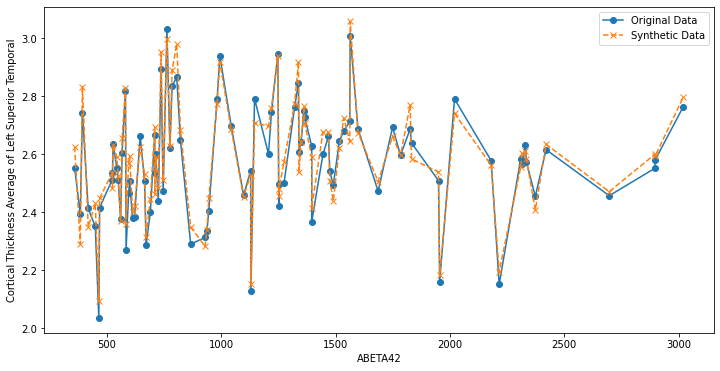

Dependent variable: APVOLUME


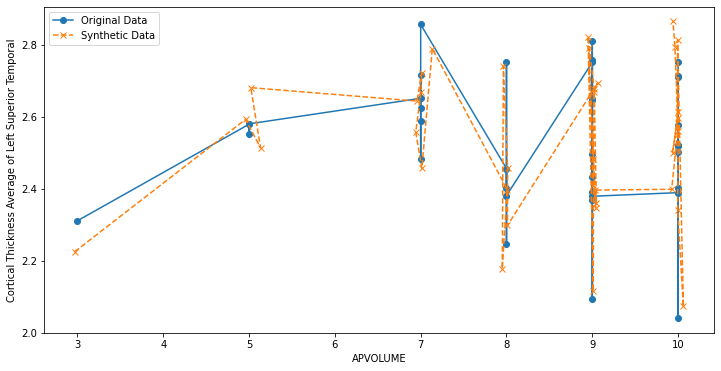

Dependent variable: TAU


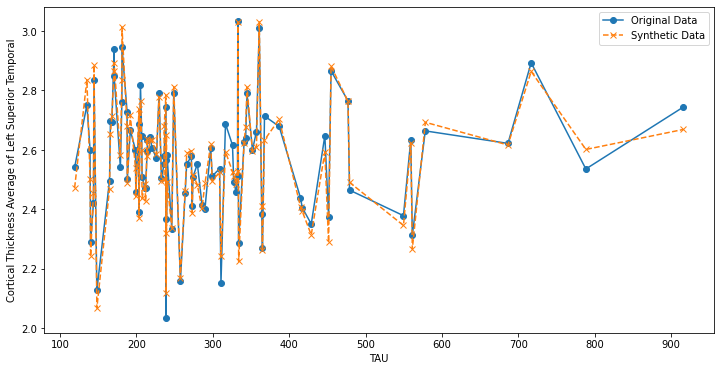

Dependent variable: PTAU


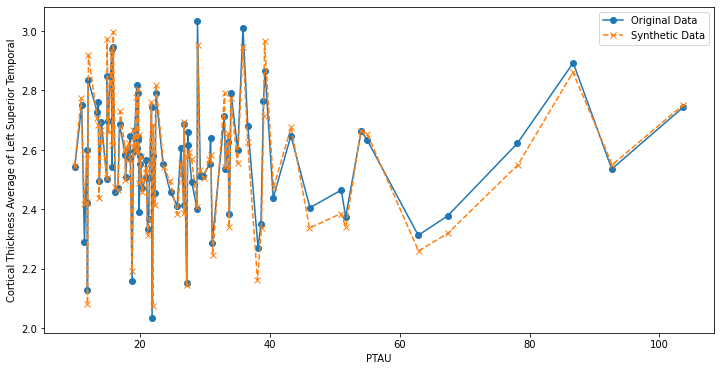

Dependent variable: PLASMAPTAU181


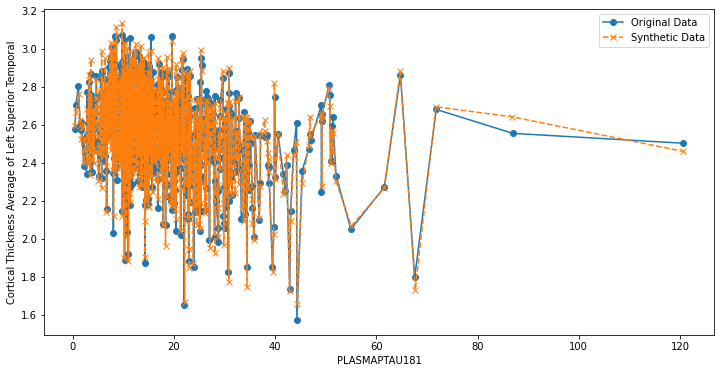

In [41]:
for dependent_var in dependent_variables:
    print(f"Dependent variable: {dependent_var}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_var)

    filtered_df = filtered_df.sort_values(by=dependent_var)
    # Extract the independent variable (X) and target variable (y) values
    X = filtered_df[dependent_var].values
    y = filtered_df[target_names].values

    synthetic_data_X = X + np.random.normal(0, 0.05, X.shape)
    synthetic_data_y = y + np.random.normal(0, 0.05, y.shape)

    plt.figure(figsize=(12, 6))
    plt.plot(X, y[:, 0], label="Original Data", linestyle='-', marker='o')
    plt.plot(synthetic_data_X, synthetic_data_y[:, 0], label="Synthetic Data", linestyle='--', marker='x')
    plt.legend()
    plt.xlabel(dependent_var)
    plt.ylabel("Cortical Thickness Average of Left Superior Temporal")
    plt.show()

Dependent variable: ABETA42


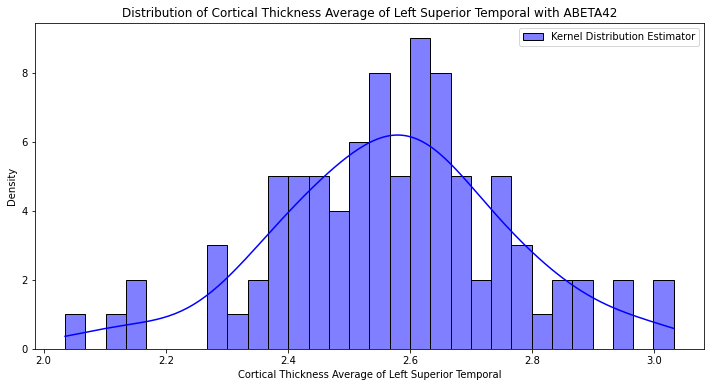

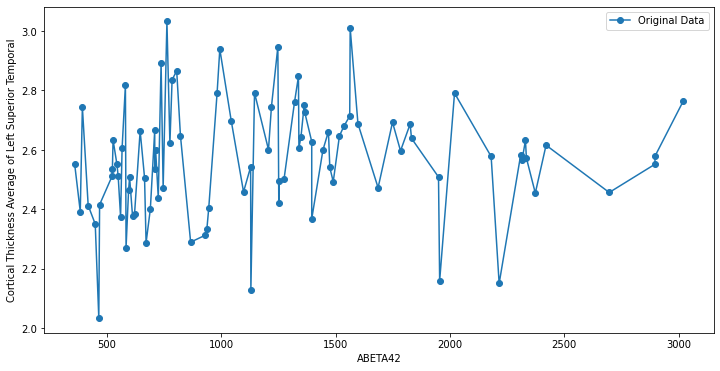


Testing Cortical Thickness Average of Left Superior Temporal:
Shapiro-Wilk Test: W=0.992, p=8.933e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.040, p=9.974e-01 (Normal)
Anderson-Darling Test: A=0.197, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


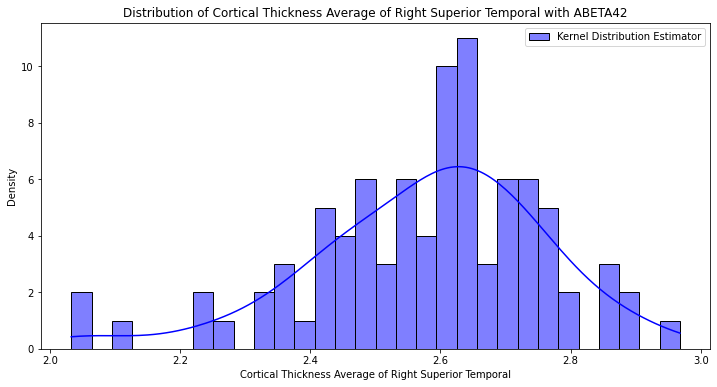

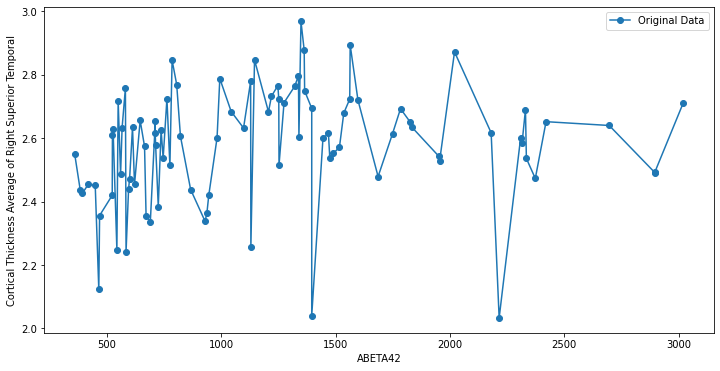


Testing Cortical Thickness Average of Right Superior Temporal:
Shapiro-Wilk Test: W=0.967, p=2.340e-02 (Not Normal)
Kolmogorov-Smirnov Test: D=0.095, p=3.710e-01 (Normal)
Anderson-Darling Test: A=0.727, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


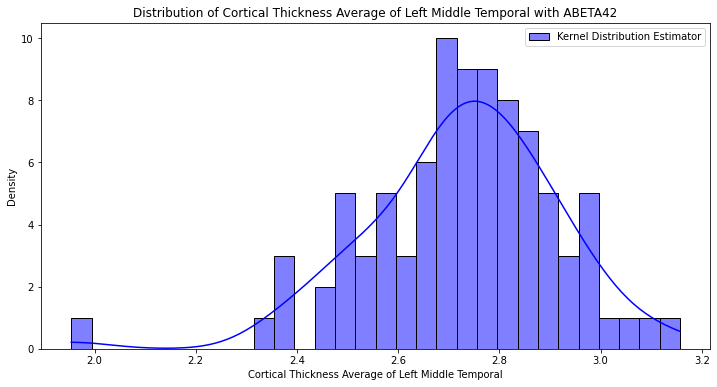

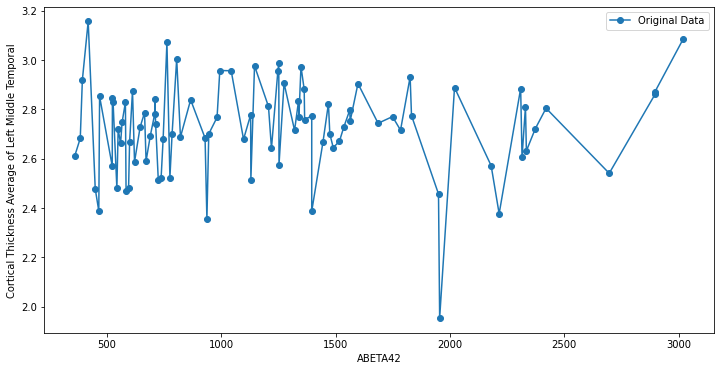


Testing Cortical Thickness Average of Left Middle Temporal:
Shapiro-Wilk Test: W=0.965, p=1.696e-02 (Not Normal)
Kolmogorov-Smirnov Test: D=0.085, p=5.071e-01 (Normal)
Anderson-Darling Test: A=0.488, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


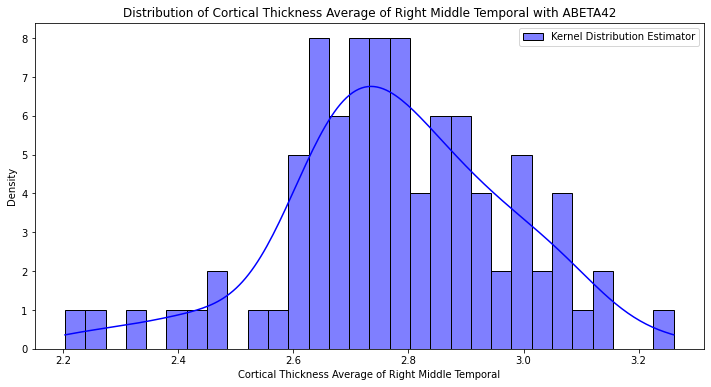

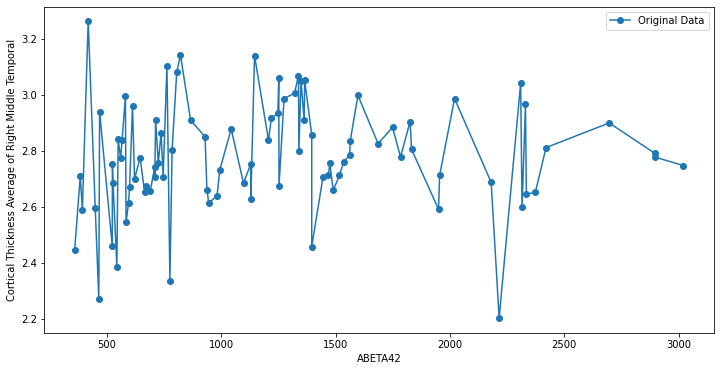


Testing Cortical Thickness Average of Right Middle Temporal:
Shapiro-Wilk Test: W=0.983, p=2.816e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.077, p=6.423e-01 (Normal)
Anderson-Darling Test: A=0.483, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


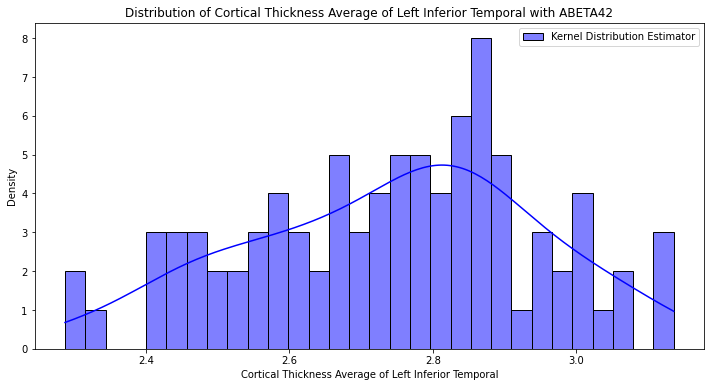

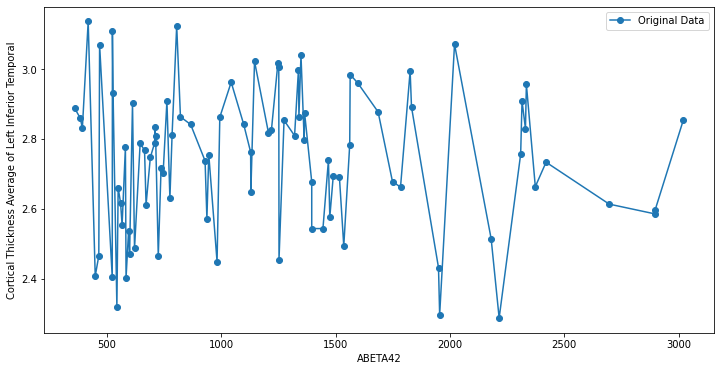


Testing Cortical Thickness Average of Left Inferior Temporal:
Shapiro-Wilk Test: W=0.982, p=2.454e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.067, p=7.917e-01 (Normal)
Anderson-Darling Test: A=0.444, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


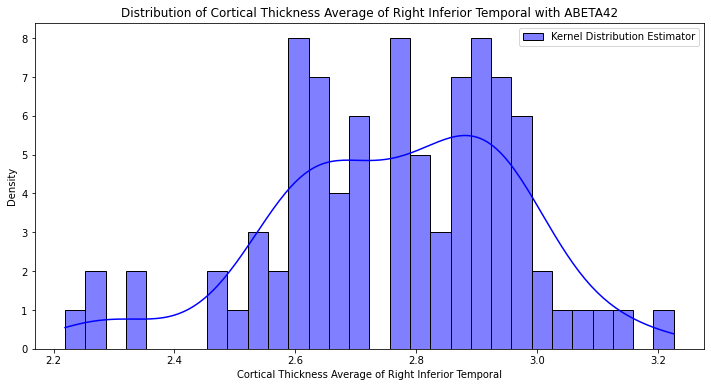

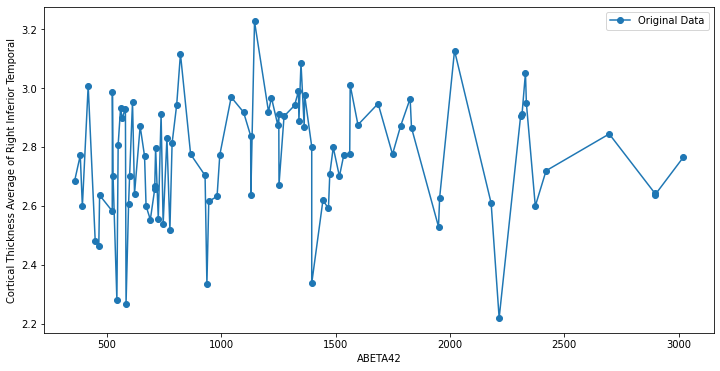


Testing Cortical Thickness Average of Right Inferior Temporal:
Shapiro-Wilk Test: W=0.975, p=8.303e-02 (Normal)
Kolmogorov-Smirnov Test: D=0.086, p=5.010e-01 (Normal)
Anderson-Darling Test: A=0.699, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


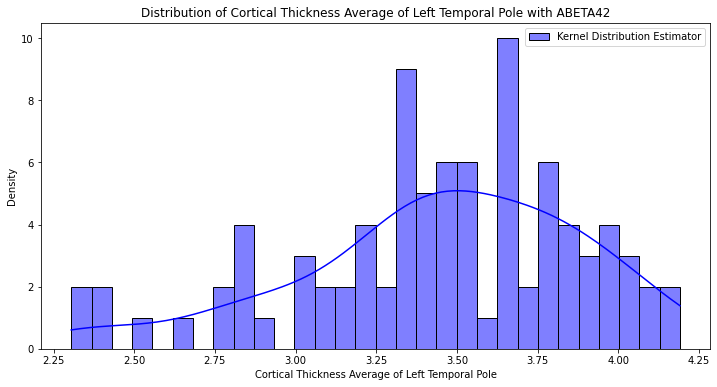

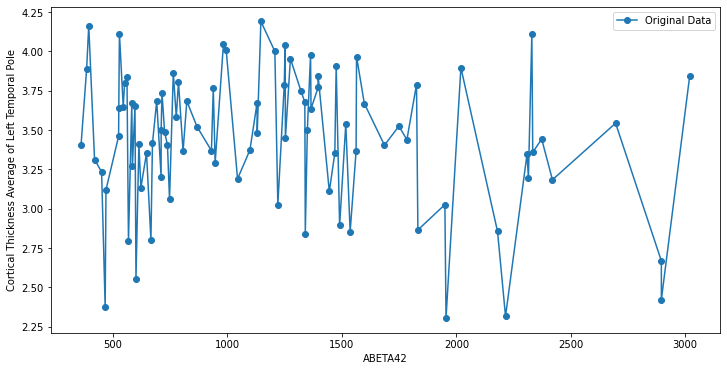


Testing Cortical Thickness Average of Left Temporal Pole:
Shapiro-Wilk Test: W=0.959, p=6.345e-03 (Not Normal)
Kolmogorov-Smirnov Test: D=0.106, p=2.548e-01 (Normal)
Anderson-Darling Test: A=0.907, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


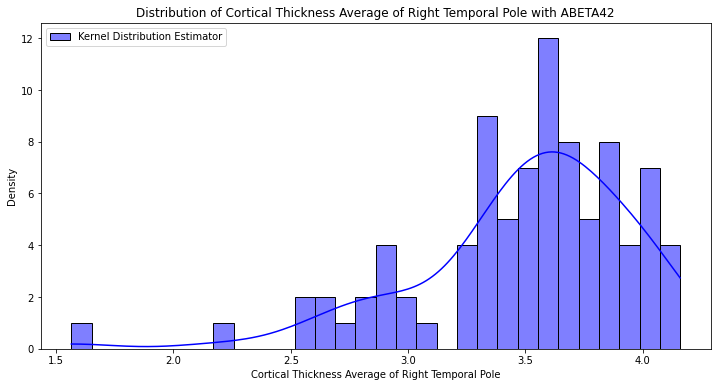

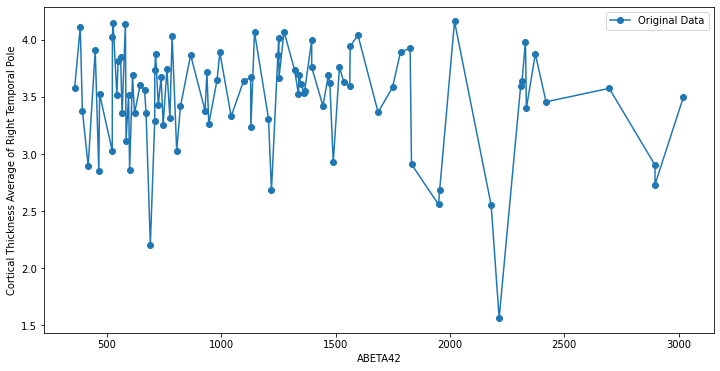


Testing Cortical Thickness Average of Right Temporal Pole:
Shapiro-Wilk Test: W=0.910, p=1.276e-05 (Not Normal)
Kolmogorov-Smirnov Test: D=0.121, p=1.341e-01 (Normal)
Anderson-Darling Test: A=1.856, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


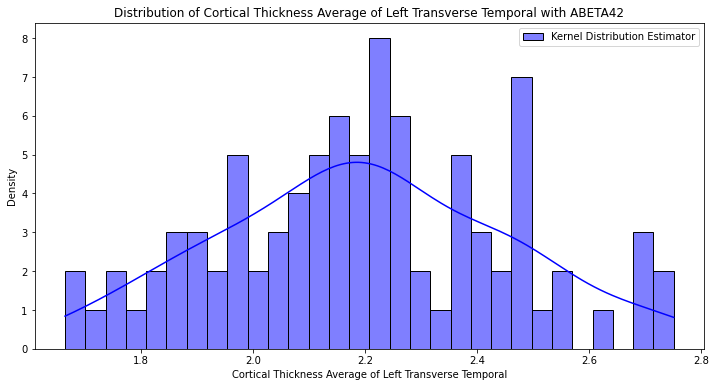

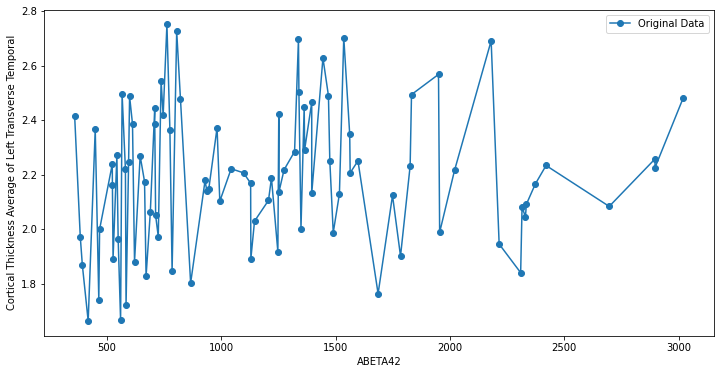


Testing Cortical Thickness Average of Left Transverse Temporal:
Shapiro-Wilk Test: W=0.987, p=4.980e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.060, p=8.846e-01 (Normal)
Anderson-Darling Test: A=0.259, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


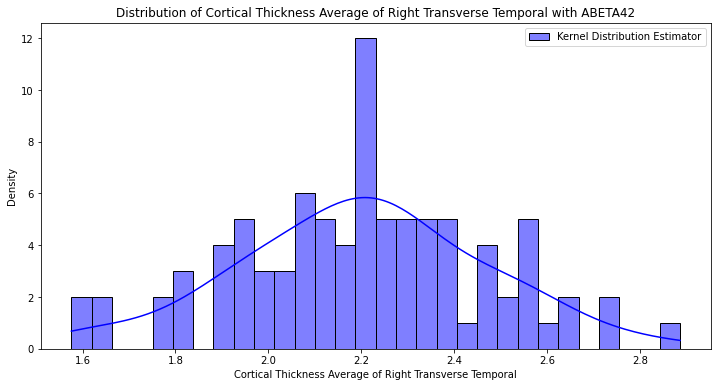

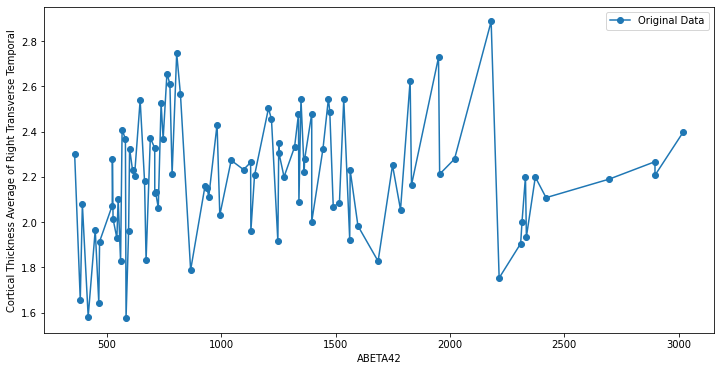


Testing Cortical Thickness Average of Right Transverse Temporal:
Shapiro-Wilk Test: W=0.993, p=9.365e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.049, p=9.777e-01 (Normal)
Anderson-Darling Test: A=0.187, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------
Dependent variable: APVOLUME


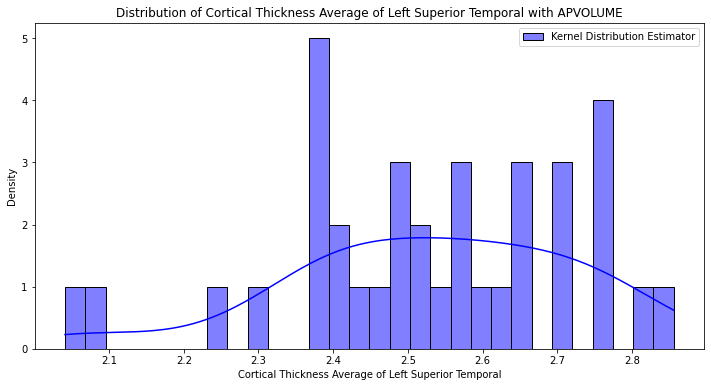

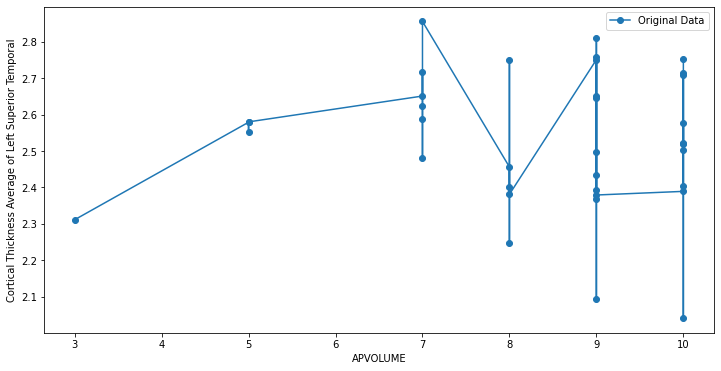


Testing Cortical Thickness Average of Left Superior Temporal:
Shapiro-Wilk Test: W=0.964, p=2.775e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.086, p=9.309e-01 (Normal)
Anderson-Darling Test: A=0.348, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


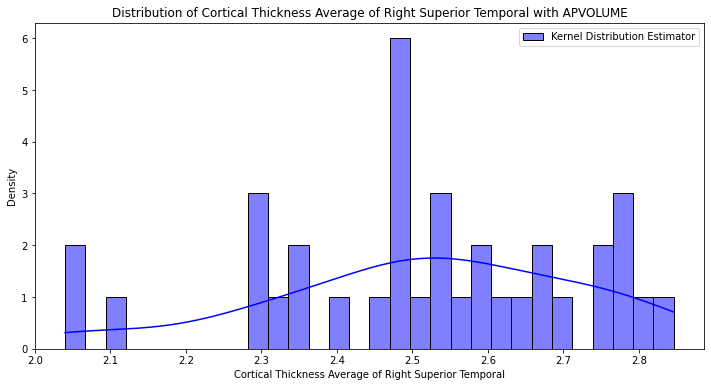

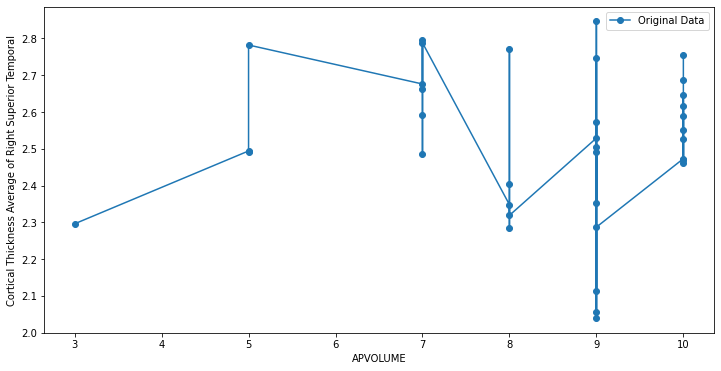


Testing Cortical Thickness Average of Right Superior Temporal:
Shapiro-Wilk Test: W=0.956, p=1.623e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.123, p=6.053e-01 (Normal)
Anderson-Darling Test: A=0.418, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


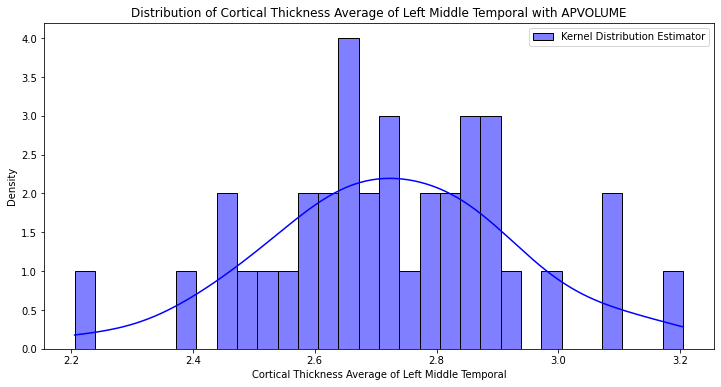

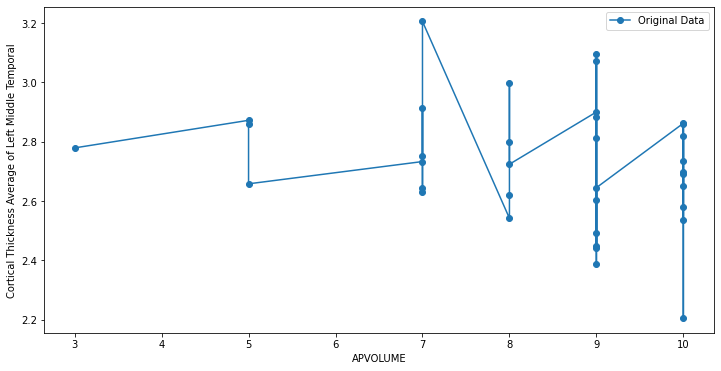


Testing Cortical Thickness Average of Left Middle Temporal:
Shapiro-Wilk Test: W=0.992, p=9.928e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.070, p=9.892e-01 (Normal)
Anderson-Darling Test: A=0.161, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


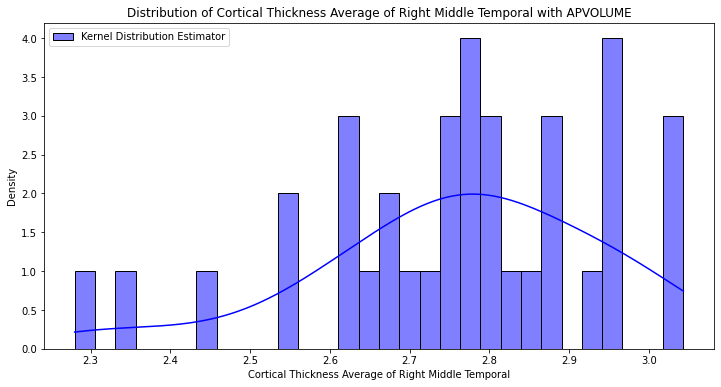

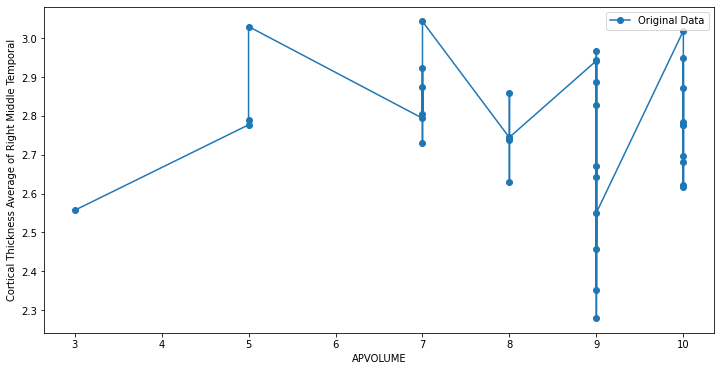


Testing Cortical Thickness Average of Right Middle Temporal:
Shapiro-Wilk Test: W=0.959, p=1.964e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.098, p=8.469e-01 (Normal)
Anderson-Darling Test: A=0.376, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


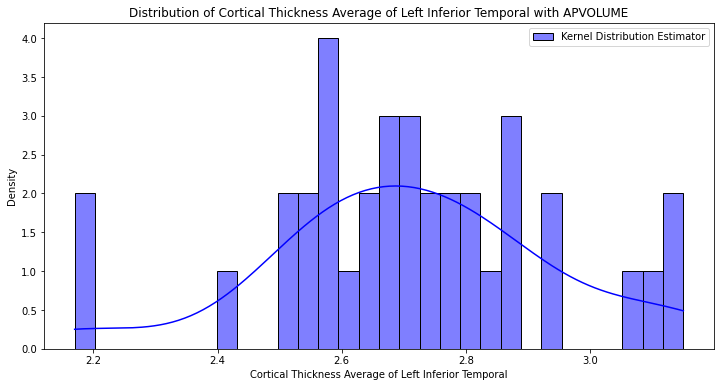

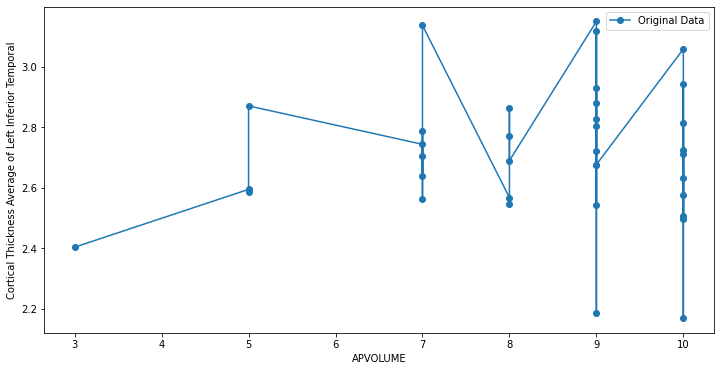


Testing Cortical Thickness Average of Left Inferior Temporal:
Shapiro-Wilk Test: W=0.967, p=3.601e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.089, p=9.141e-01 (Normal)
Anderson-Darling Test: A=0.353, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


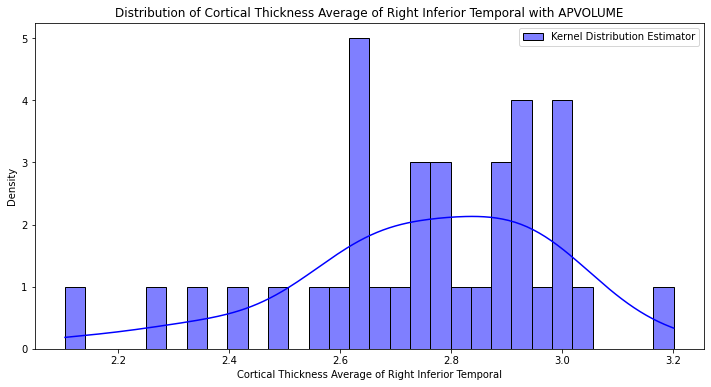

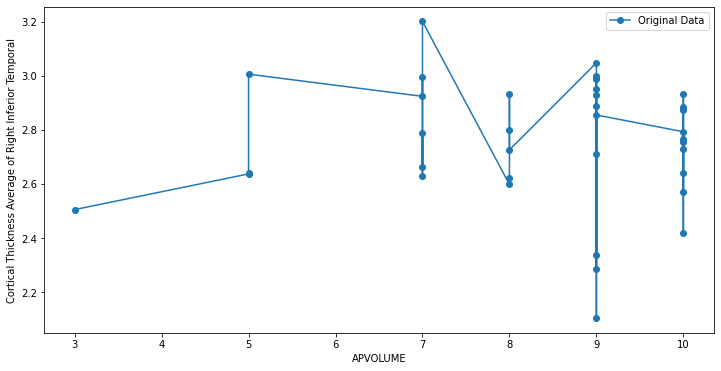


Testing Cortical Thickness Average of Right Inferior Temporal:
Shapiro-Wilk Test: W=0.958, p=1.906e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.091, p=9.014e-01 (Normal)
Anderson-Darling Test: A=0.498, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


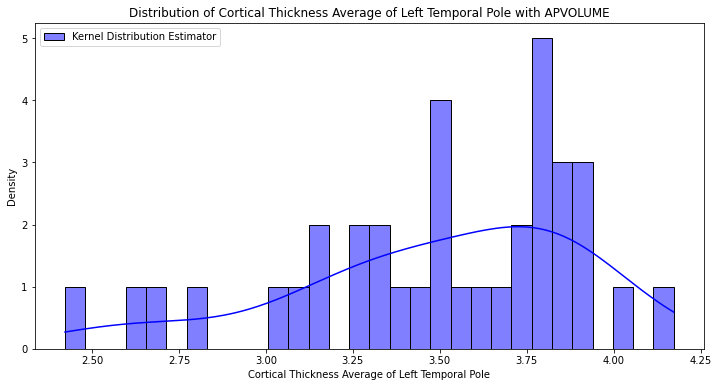

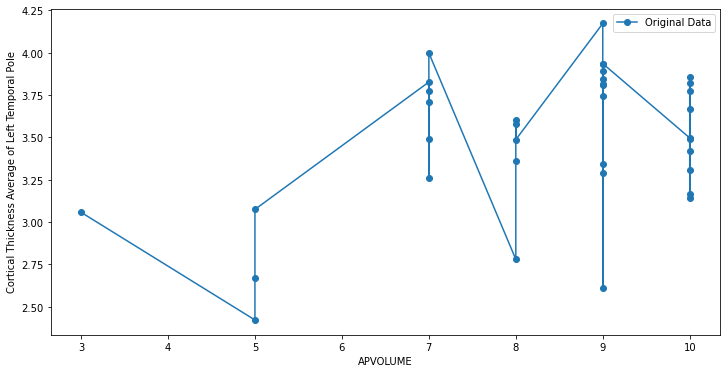


Testing Cortical Thickness Average of Left Temporal Pole:
Shapiro-Wilk Test: W=0.935, p=3.603e-02 (Not Normal)
Kolmogorov-Smirnov Test: D=0.116, p=6.747e-01 (Normal)
Anderson-Darling Test: A=0.787, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


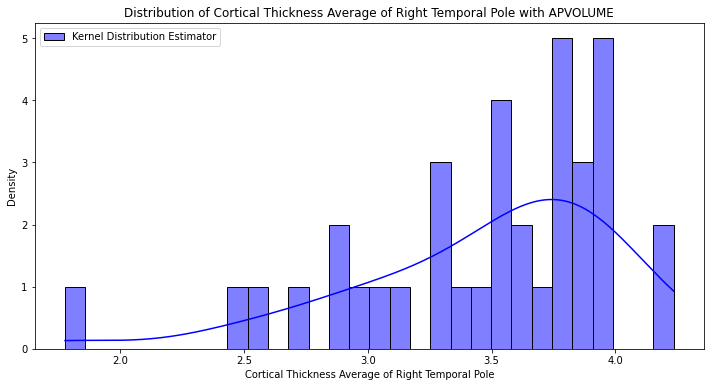

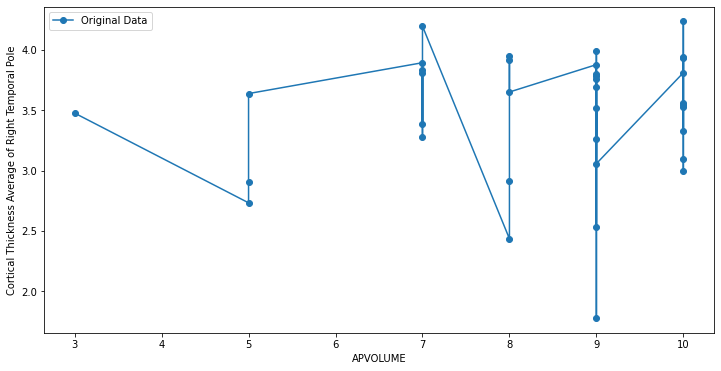


Testing Cortical Thickness Average of Right Temporal Pole:
Shapiro-Wilk Test: W=0.909, p=5.900e-03 (Not Normal)
Kolmogorov-Smirnov Test: D=0.147, p=3.776e-01 (Normal)
Anderson-Darling Test: A=1.034, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


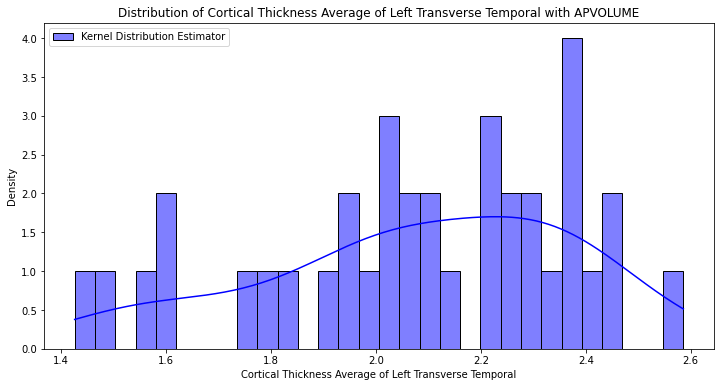

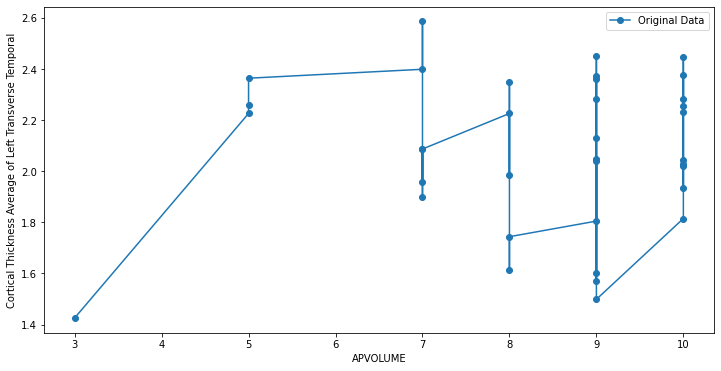


Testing Cortical Thickness Average of Left Transverse Temporal:
Shapiro-Wilk Test: W=0.953, p=1.306e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.136, p=4.810e-01 (Normal)
Anderson-Darling Test: A=0.580, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


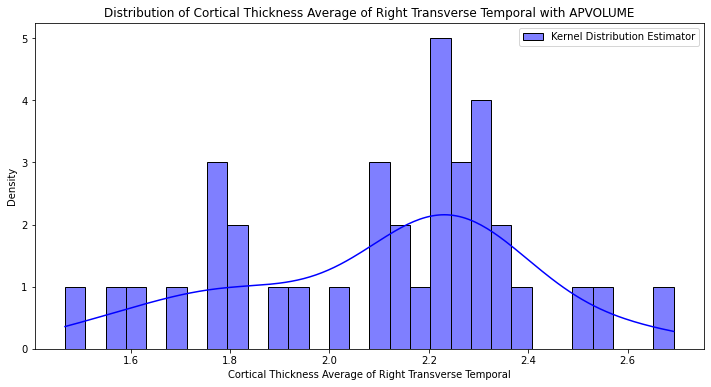

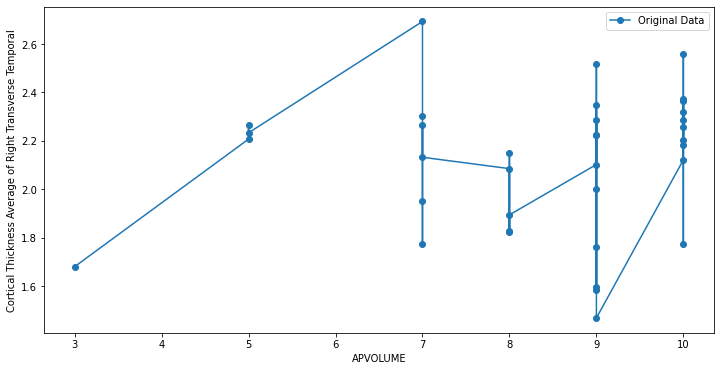


Testing Cortical Thickness Average of Right Transverse Temporal:
Shapiro-Wilk Test: W=0.957, p=1.730e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.137, p=4.694e-01 (Normal)
Anderson-Darling Test: A=0.774, Critical Values=[0.528 0.601 0.721 0.841 1.   ], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------
Dependent variable: TAU


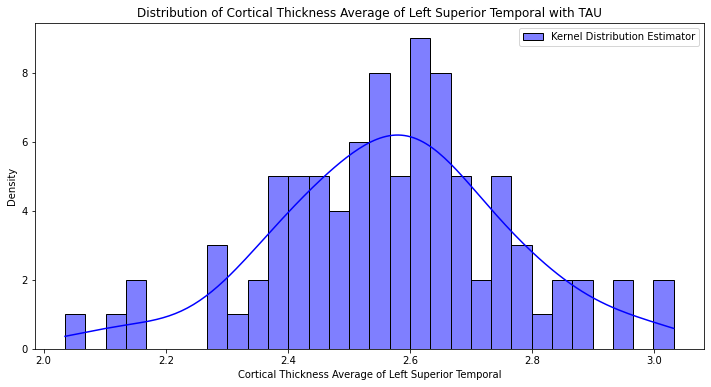

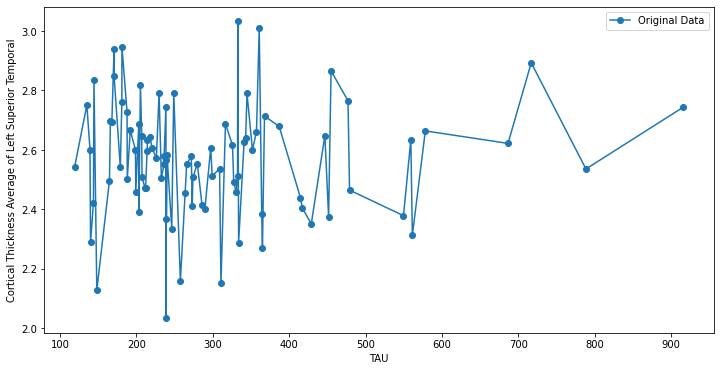


Testing Cortical Thickness Average of Left Superior Temporal:
Shapiro-Wilk Test: W=0.992, p=8.933e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.040, p=9.974e-01 (Normal)
Anderson-Darling Test: A=0.197, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


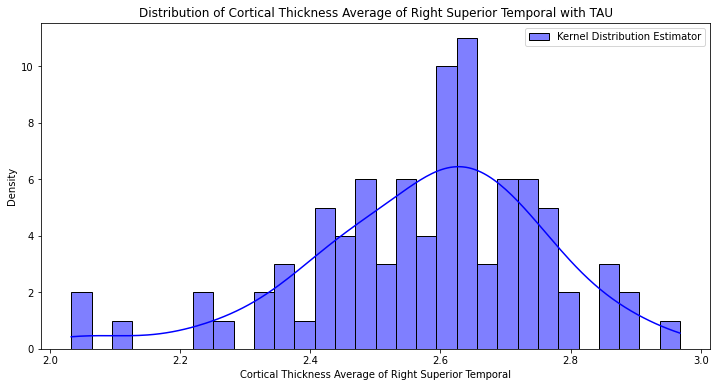

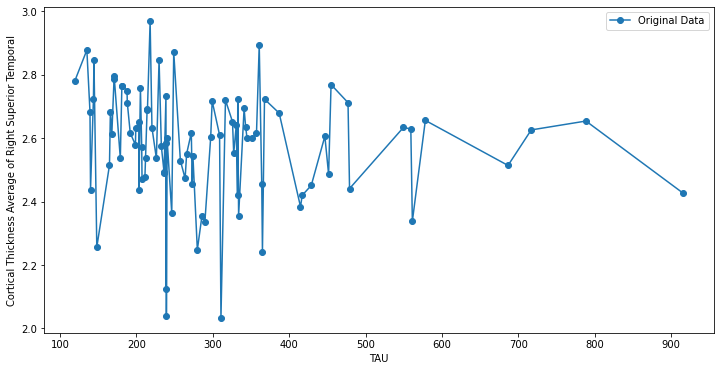


Testing Cortical Thickness Average of Right Superior Temporal:
Shapiro-Wilk Test: W=0.967, p=2.340e-02 (Not Normal)
Kolmogorov-Smirnov Test: D=0.095, p=3.710e-01 (Normal)
Anderson-Darling Test: A=0.727, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


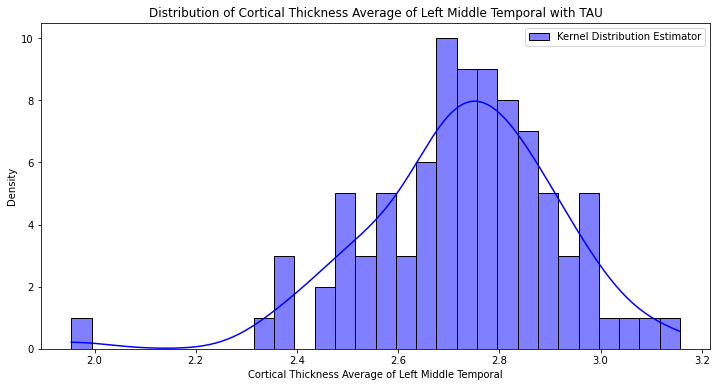

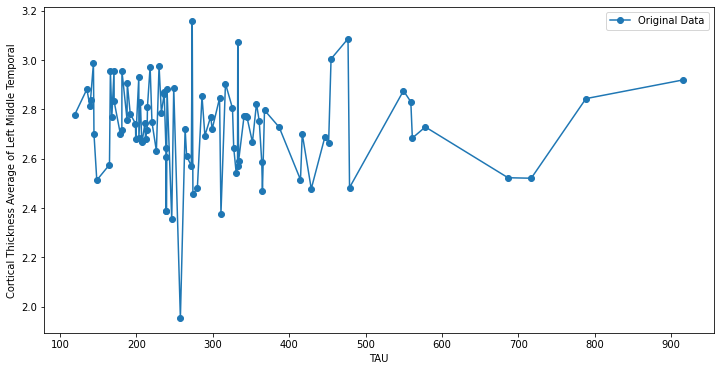


Testing Cortical Thickness Average of Left Middle Temporal:
Shapiro-Wilk Test: W=0.965, p=1.696e-02 (Not Normal)
Kolmogorov-Smirnov Test: D=0.085, p=5.071e-01 (Normal)
Anderson-Darling Test: A=0.488, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


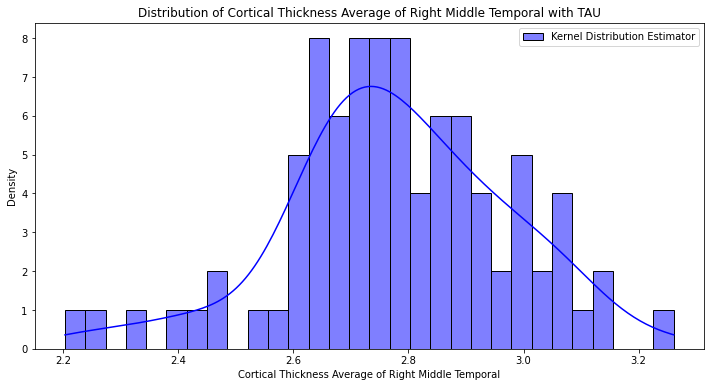

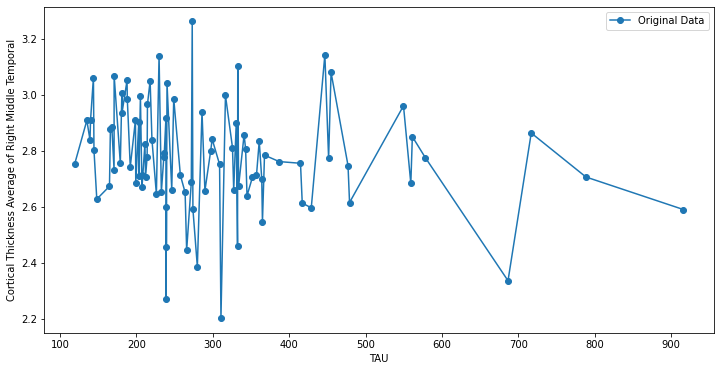


Testing Cortical Thickness Average of Right Middle Temporal:
Shapiro-Wilk Test: W=0.983, p=2.816e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.077, p=6.423e-01 (Normal)
Anderson-Darling Test: A=0.483, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


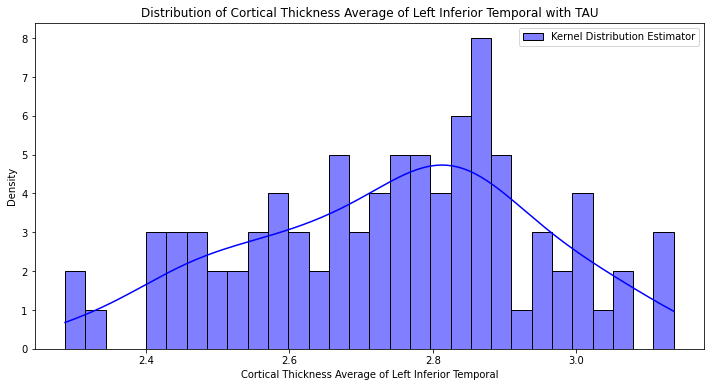

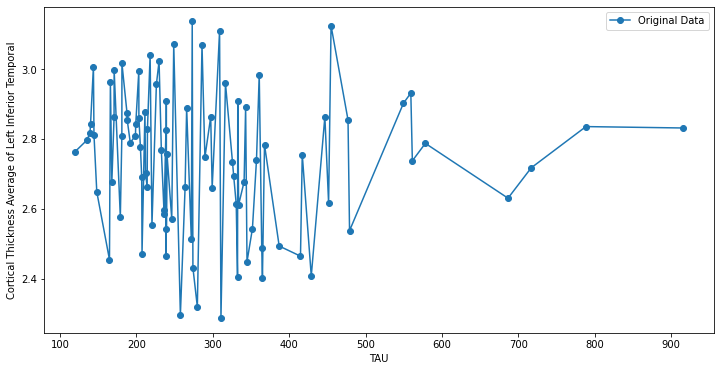


Testing Cortical Thickness Average of Left Inferior Temporal:
Shapiro-Wilk Test: W=0.982, p=2.454e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.067, p=7.917e-01 (Normal)
Anderson-Darling Test: A=0.444, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


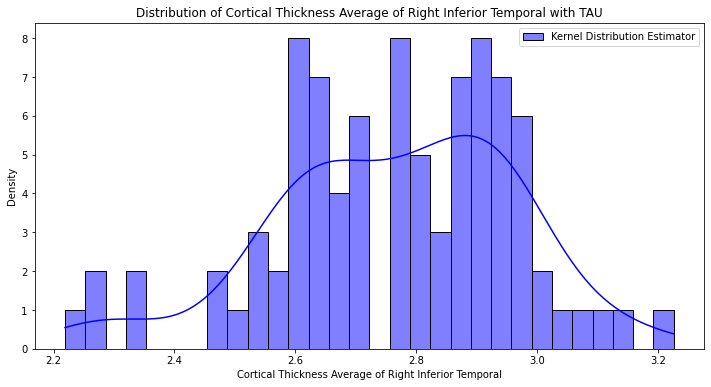

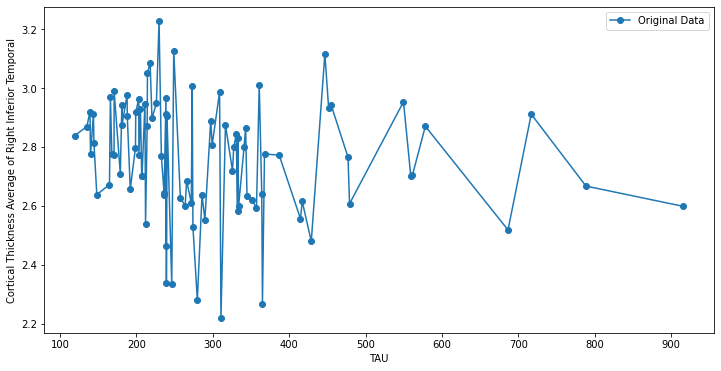


Testing Cortical Thickness Average of Right Inferior Temporal:
Shapiro-Wilk Test: W=0.975, p=8.303e-02 (Normal)
Kolmogorov-Smirnov Test: D=0.086, p=5.010e-01 (Normal)
Anderson-Darling Test: A=0.699, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


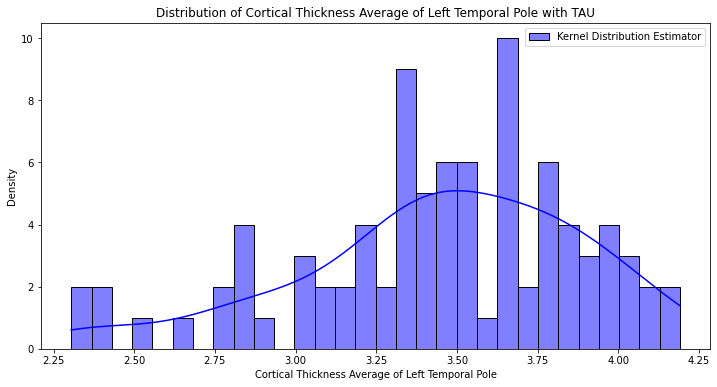

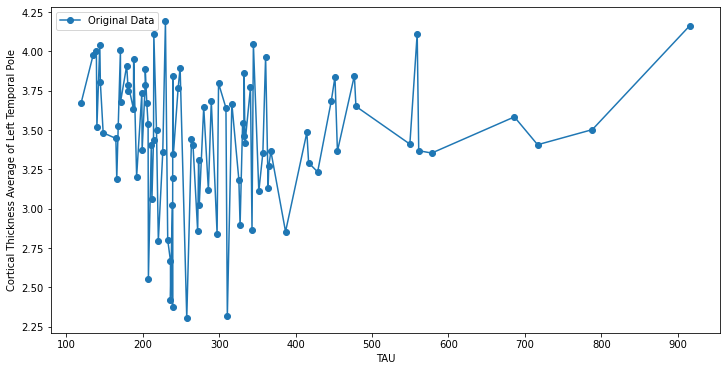


Testing Cortical Thickness Average of Left Temporal Pole:
Shapiro-Wilk Test: W=0.959, p=6.345e-03 (Not Normal)
Kolmogorov-Smirnov Test: D=0.106, p=2.548e-01 (Normal)
Anderson-Darling Test: A=0.907, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


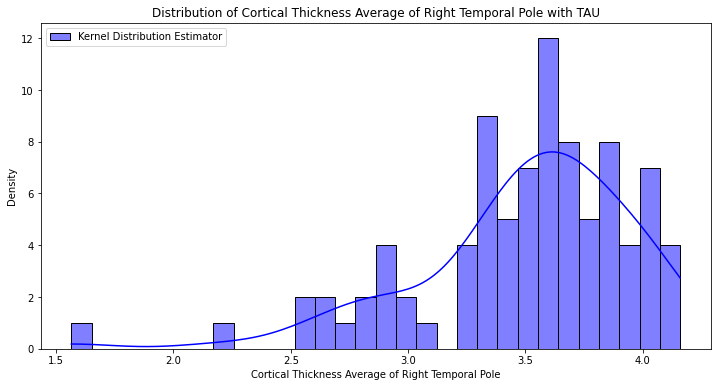

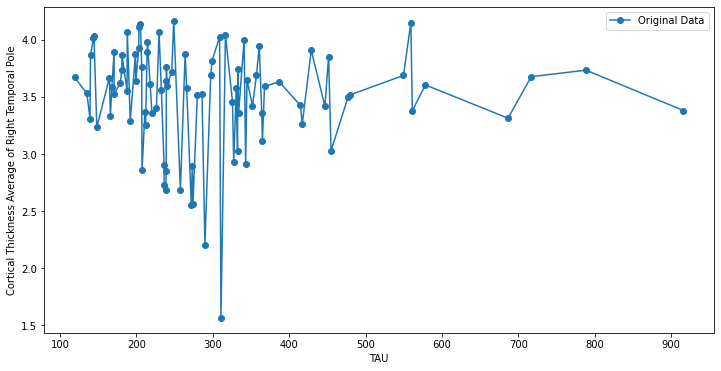


Testing Cortical Thickness Average of Right Temporal Pole:
Shapiro-Wilk Test: W=0.910, p=1.276e-05 (Not Normal)
Kolmogorov-Smirnov Test: D=0.121, p=1.341e-01 (Normal)
Anderson-Darling Test: A=1.856, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


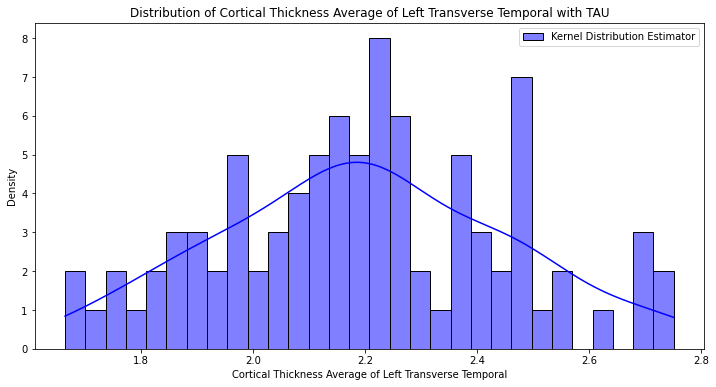

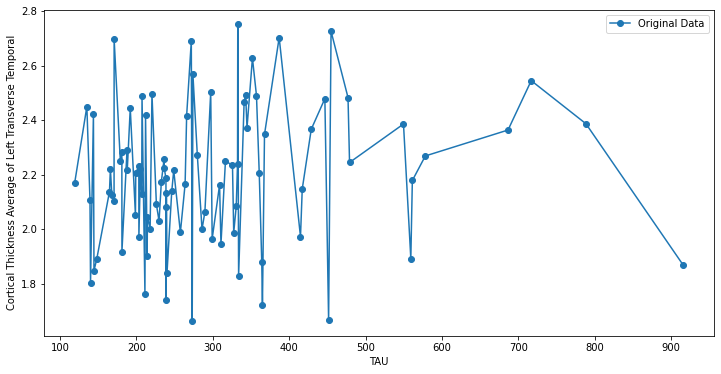


Testing Cortical Thickness Average of Left Transverse Temporal:
Shapiro-Wilk Test: W=0.987, p=4.980e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.060, p=8.846e-01 (Normal)
Anderson-Darling Test: A=0.259, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


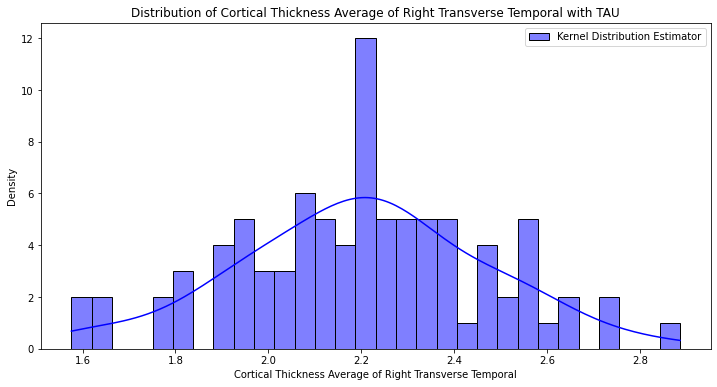

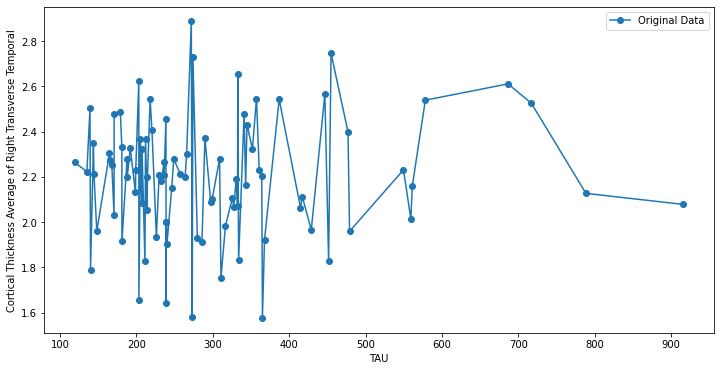


Testing Cortical Thickness Average of Right Transverse Temporal:
Shapiro-Wilk Test: W=0.993, p=9.365e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.049, p=9.777e-01 (Normal)
Anderson-Darling Test: A=0.187, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------
Dependent variable: PTAU


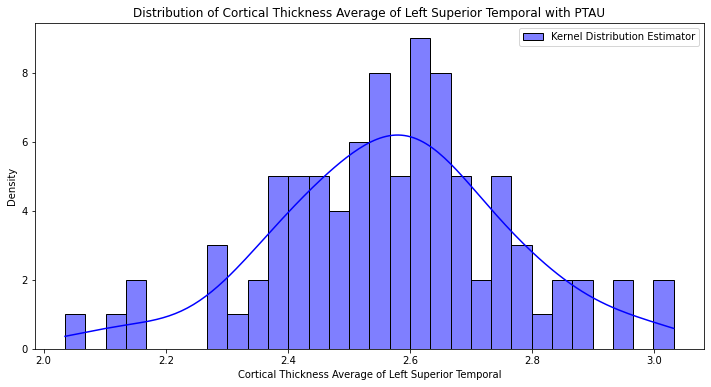

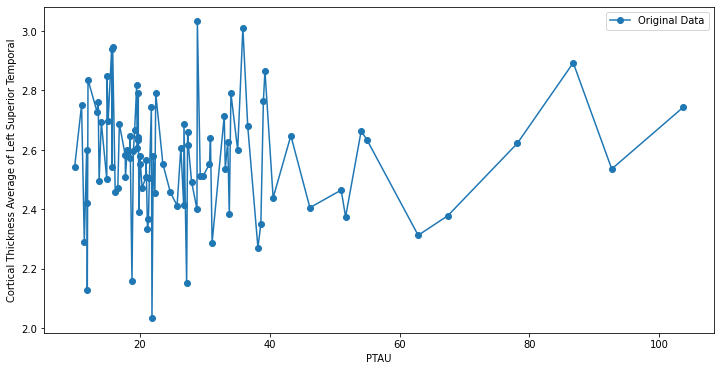


Testing Cortical Thickness Average of Left Superior Temporal:
Shapiro-Wilk Test: W=0.992, p=8.933e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.040, p=9.974e-01 (Normal)
Anderson-Darling Test: A=0.197, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


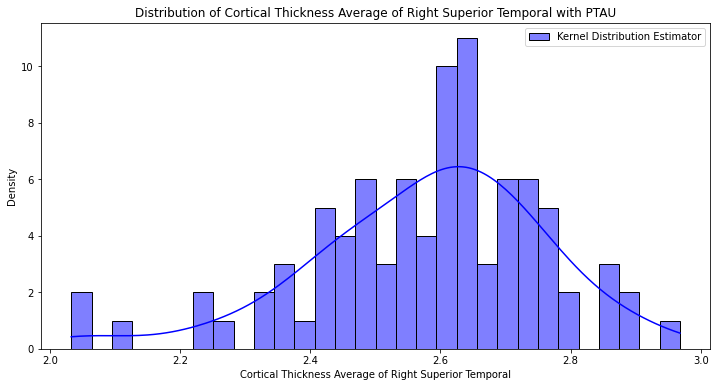

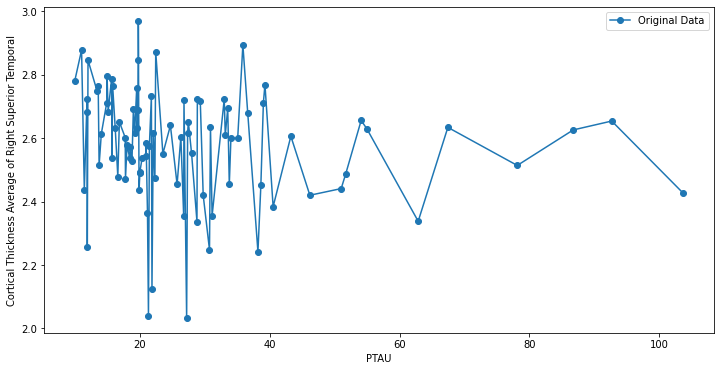


Testing Cortical Thickness Average of Right Superior Temporal:
Shapiro-Wilk Test: W=0.967, p=2.340e-02 (Not Normal)
Kolmogorov-Smirnov Test: D=0.095, p=3.710e-01 (Normal)
Anderson-Darling Test: A=0.727, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


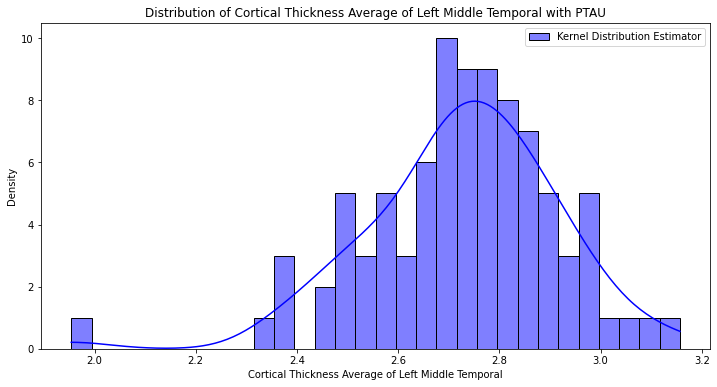

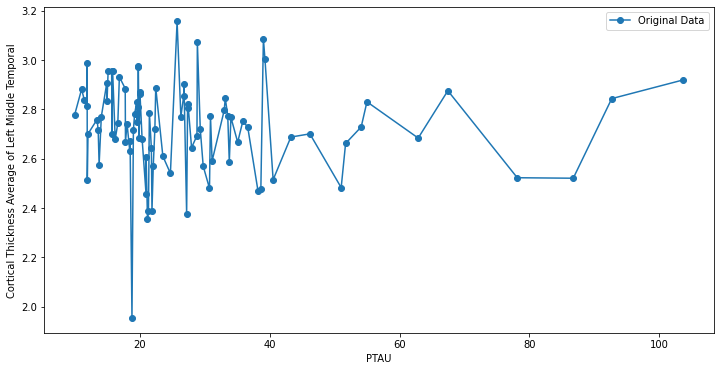


Testing Cortical Thickness Average of Left Middle Temporal:
Shapiro-Wilk Test: W=0.965, p=1.696e-02 (Not Normal)
Kolmogorov-Smirnov Test: D=0.085, p=5.071e-01 (Normal)
Anderson-Darling Test: A=0.488, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


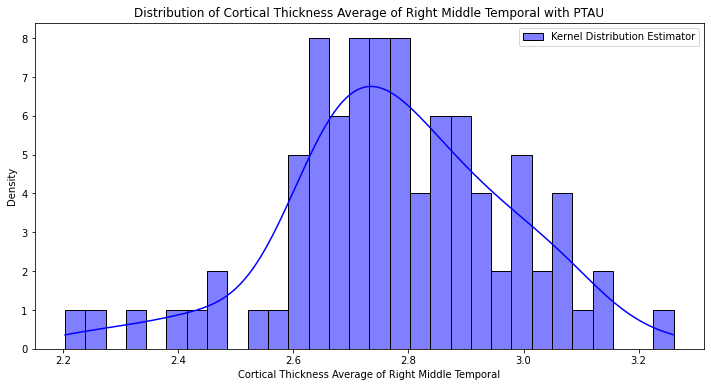

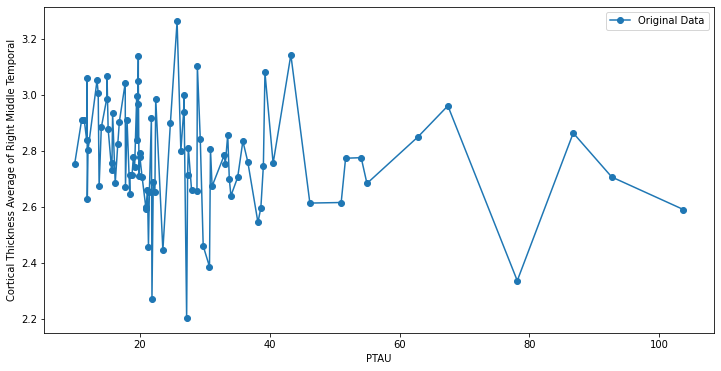


Testing Cortical Thickness Average of Right Middle Temporal:
Shapiro-Wilk Test: W=0.983, p=2.816e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.077, p=6.423e-01 (Normal)
Anderson-Darling Test: A=0.483, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


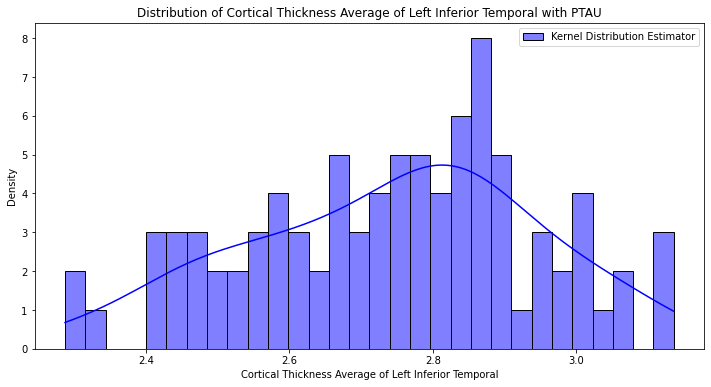

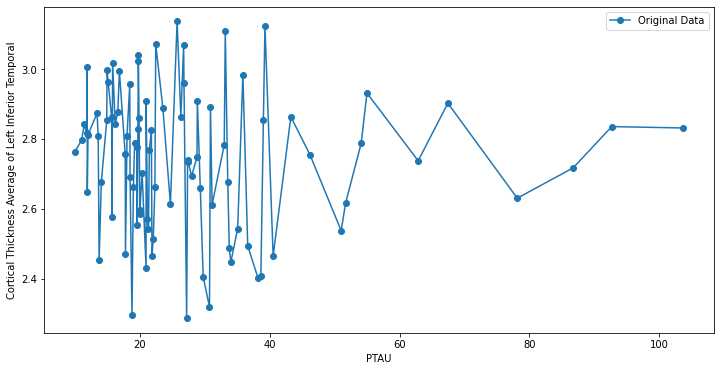


Testing Cortical Thickness Average of Left Inferior Temporal:
Shapiro-Wilk Test: W=0.982, p=2.454e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.067, p=7.917e-01 (Normal)
Anderson-Darling Test: A=0.444, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


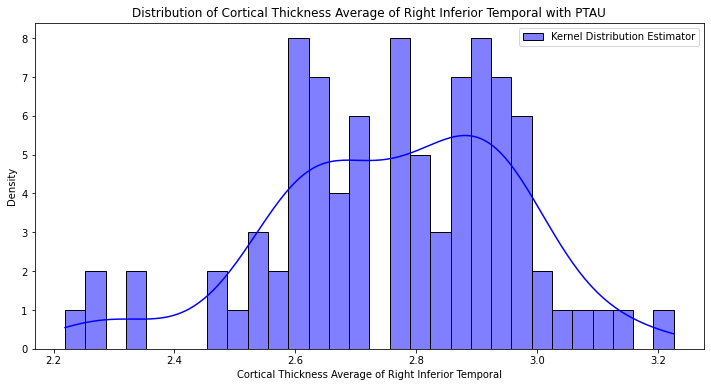

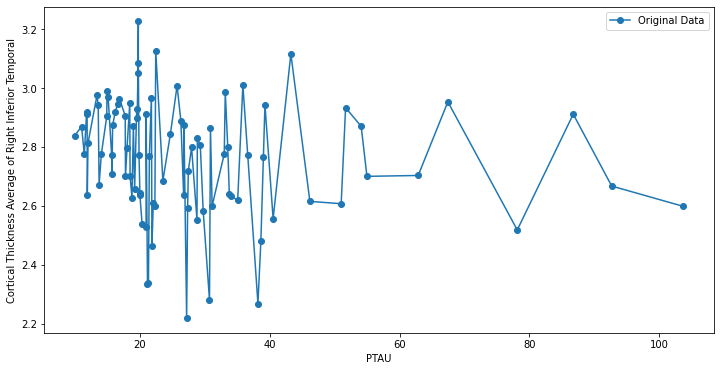


Testing Cortical Thickness Average of Right Inferior Temporal:
Shapiro-Wilk Test: W=0.975, p=8.303e-02 (Normal)
Kolmogorov-Smirnov Test: D=0.086, p=5.010e-01 (Normal)
Anderson-Darling Test: A=0.699, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


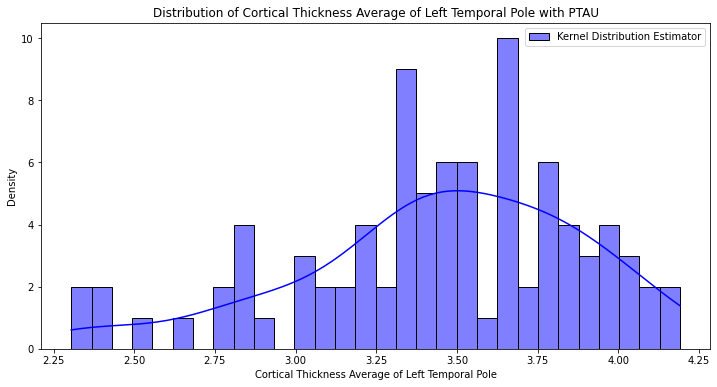

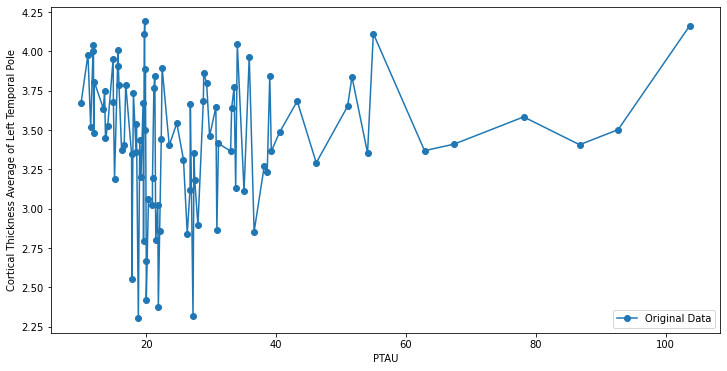


Testing Cortical Thickness Average of Left Temporal Pole:
Shapiro-Wilk Test: W=0.959, p=6.345e-03 (Not Normal)
Kolmogorov-Smirnov Test: D=0.106, p=2.548e-01 (Normal)
Anderson-Darling Test: A=0.907, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


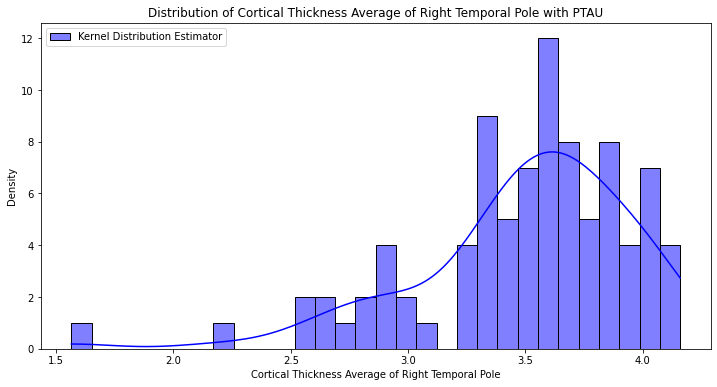

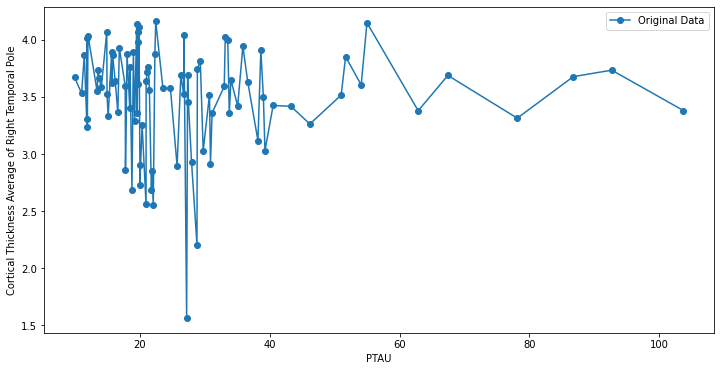


Testing Cortical Thickness Average of Right Temporal Pole:
Shapiro-Wilk Test: W=0.910, p=1.276e-05 (Not Normal)
Kolmogorov-Smirnov Test: D=0.121, p=1.341e-01 (Normal)
Anderson-Darling Test: A=1.856, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


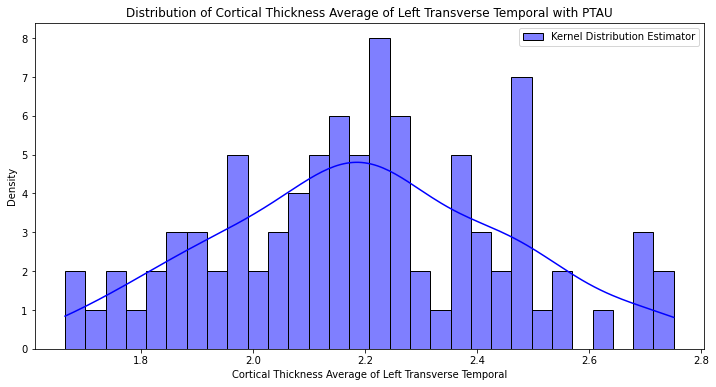

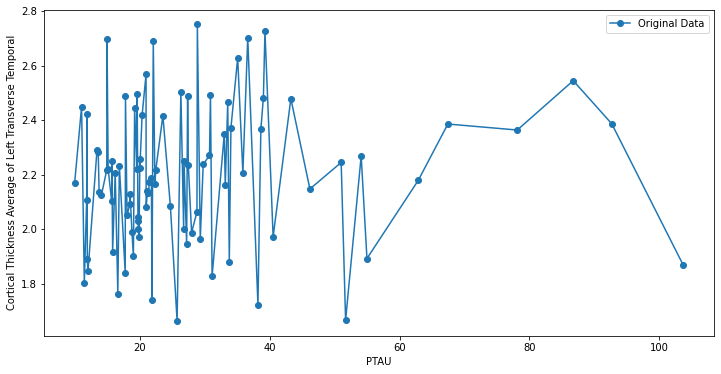


Testing Cortical Thickness Average of Left Transverse Temporal:
Shapiro-Wilk Test: W=0.987, p=4.980e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.060, p=8.846e-01 (Normal)
Anderson-Darling Test: A=0.259, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


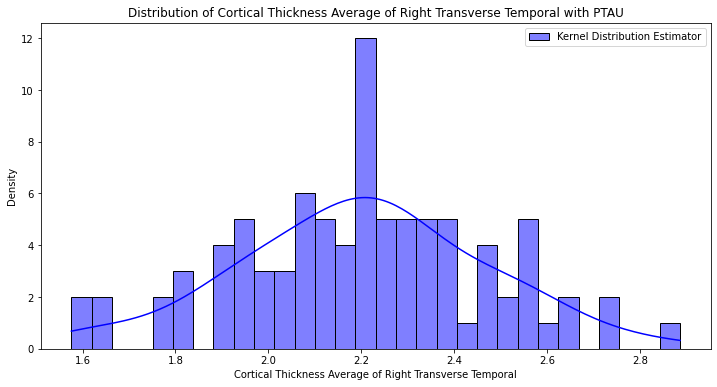

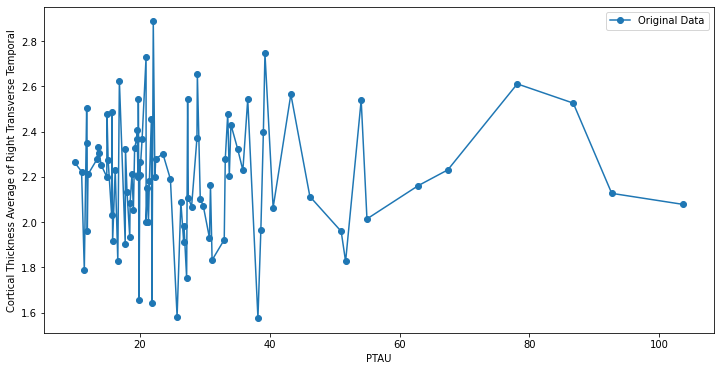


Testing Cortical Thickness Average of Right Transverse Temporal:
Shapiro-Wilk Test: W=0.993, p=9.365e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.049, p=9.777e-01 (Normal)
Anderson-Darling Test: A=0.187, Critical Values=[0.553 0.63  0.755 0.881 1.048], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------
Dependent variable: PLASMAPTAU181


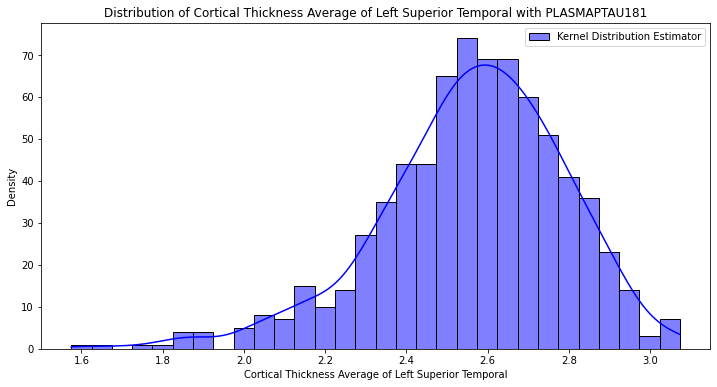

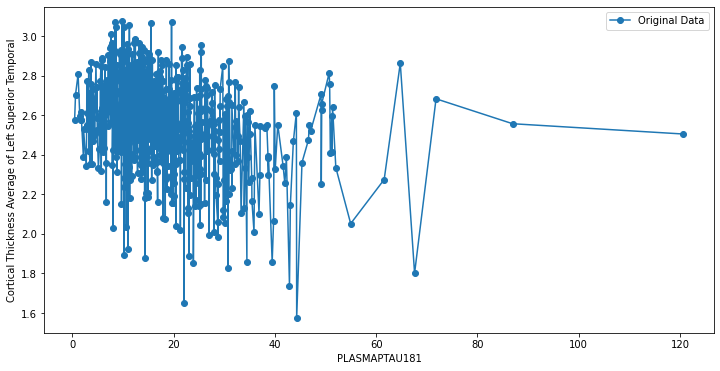


Testing Cortical Thickness Average of Left Superior Temporal:
Shapiro-Wilk Test: W=0.973, p=2.704e-10 (Not Normal)
Kolmogorov-Smirnov Test: D=0.053, p=2.922e-02 (Not Normal)
Anderson-Darling Test: A=3.602, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


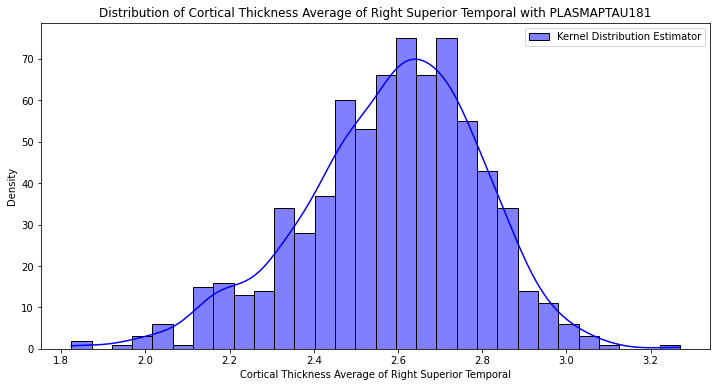

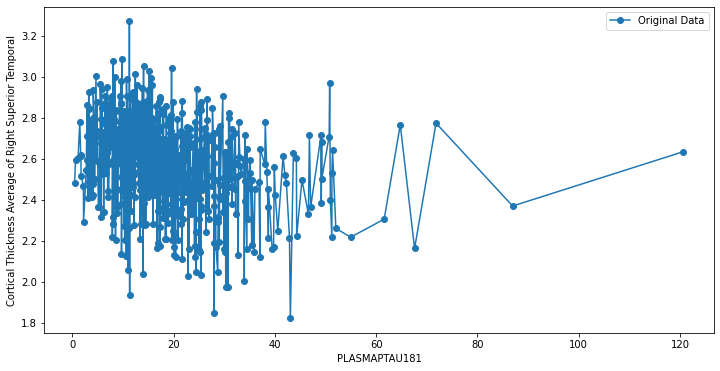


Testing Cortical Thickness Average of Right Superior Temporal:
Shapiro-Wilk Test: W=0.985, p=1.070e-06 (Not Normal)
Kolmogorov-Smirnov Test: D=0.059, p=1.264e-02 (Not Normal)
Anderson-Darling Test: A=3.139, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


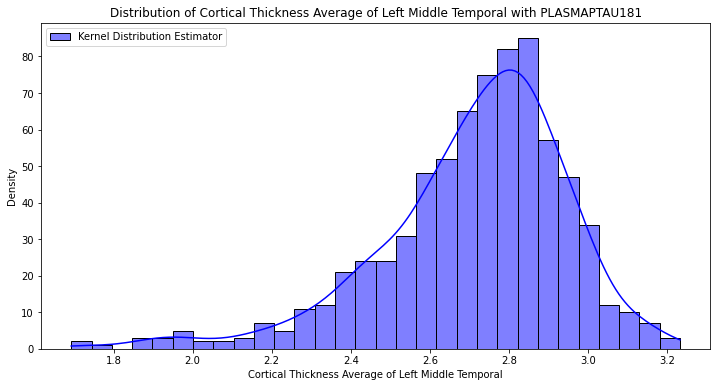

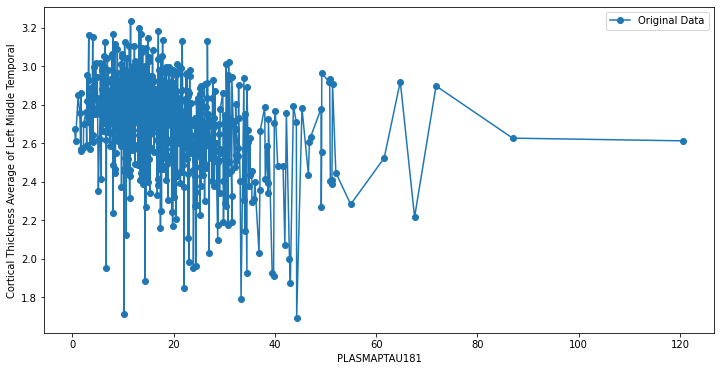


Testing Cortical Thickness Average of Left Middle Temporal:
Shapiro-Wilk Test: W=0.941, p=2.117e-16 (Not Normal)
Kolmogorov-Smirnov Test: D=0.086, p=3.205e-05 (Not Normal)
Anderson-Darling Test: A=9.971, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


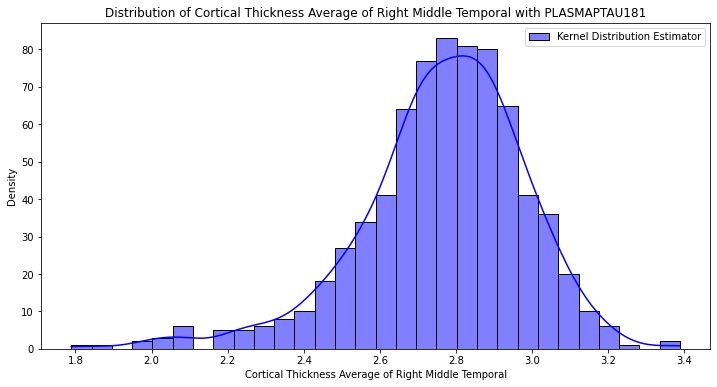

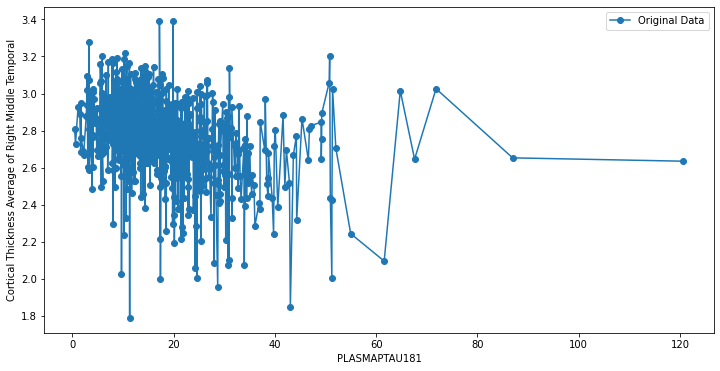


Testing Cortical Thickness Average of Right Middle Temporal:
Shapiro-Wilk Test: W=0.961, p=5.489e-13 (Not Normal)
Kolmogorov-Smirnov Test: D=0.066, p=3.291e-03 (Not Normal)
Anderson-Darling Test: A=5.721, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


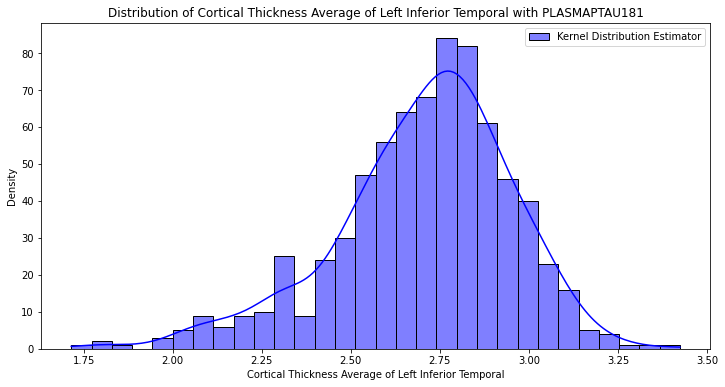

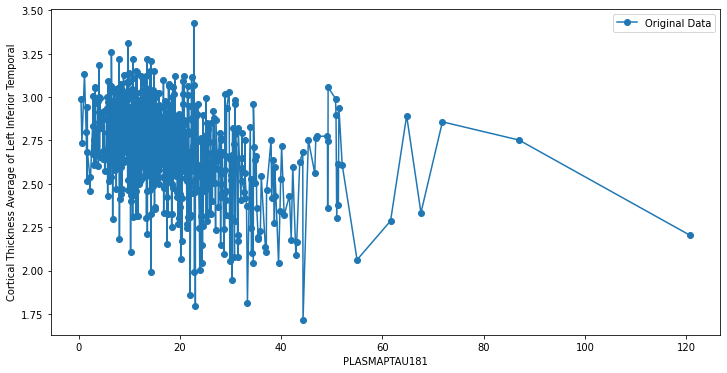


Testing Cortical Thickness Average of Left Inferior Temporal:
Shapiro-Wilk Test: W=0.972, p=1.416e-10 (Not Normal)
Kolmogorov-Smirnov Test: D=0.067, p=2.411e-03 (Not Normal)
Anderson-Darling Test: A=5.392, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


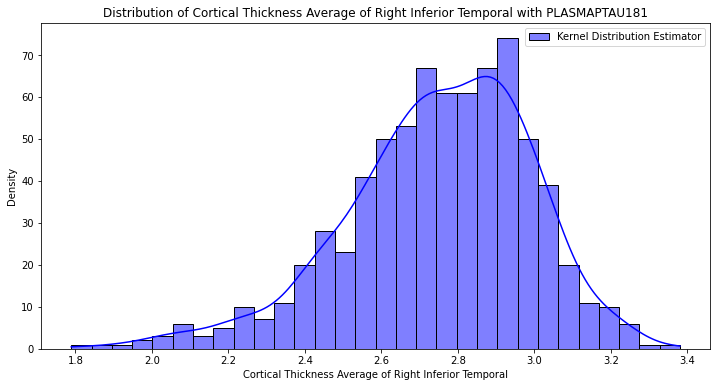

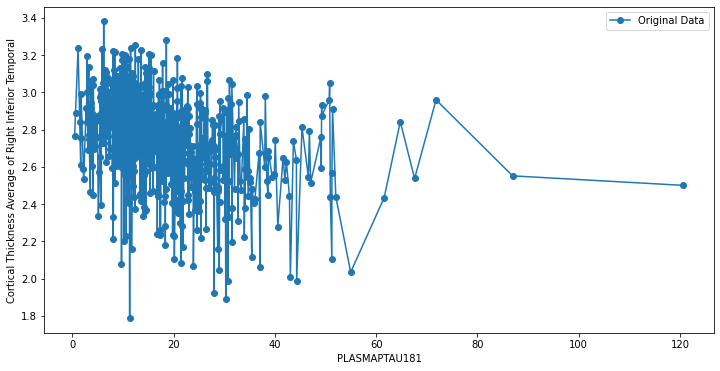


Testing Cortical Thickness Average of Right Inferior Temporal:
Shapiro-Wilk Test: W=0.975, p=9.376e-10 (Not Normal)
Kolmogorov-Smirnov Test: D=0.053, p=3.176e-02 (Not Normal)
Anderson-Darling Test: A=4.087, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


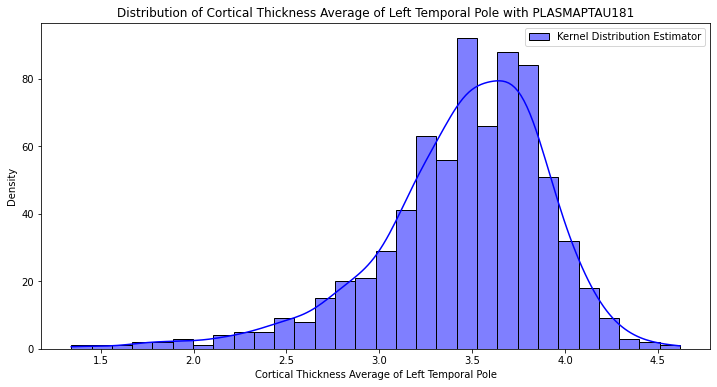

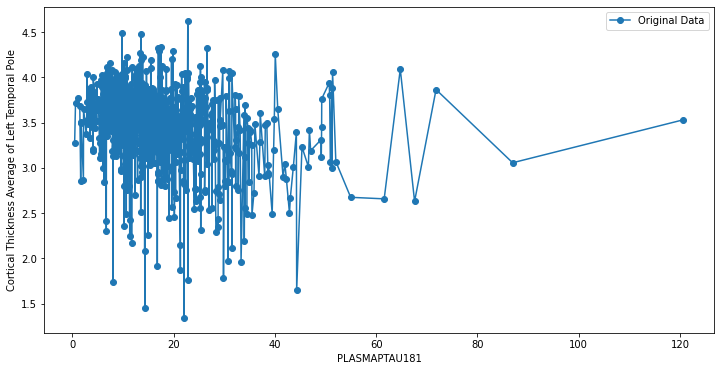


Testing Cortical Thickness Average of Left Temporal Pole:
Shapiro-Wilk Test: W=0.942, p=2.963e-16 (Not Normal)
Kolmogorov-Smirnov Test: D=0.087, p=2.665e-05 (Not Normal)
Anderson-Darling Test: A=9.692, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


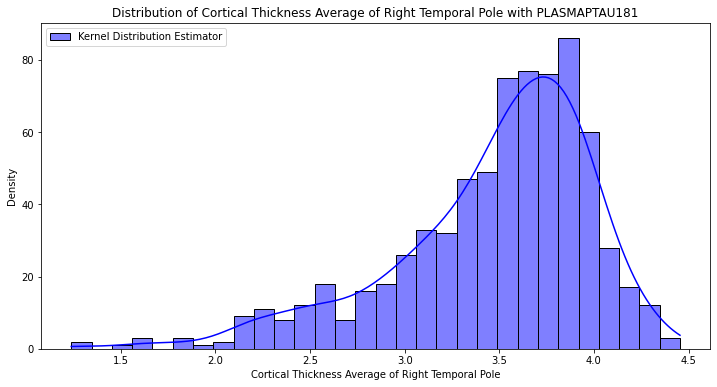

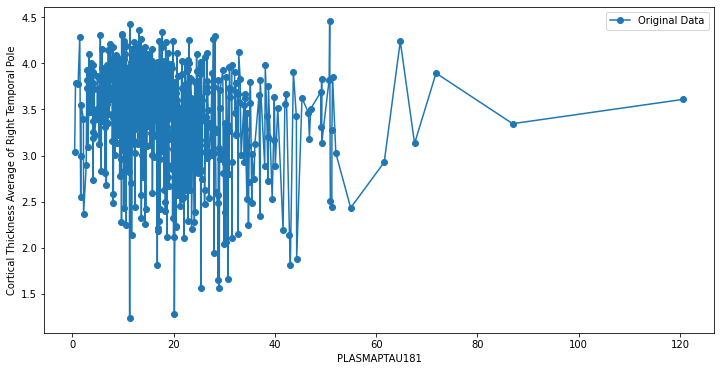


Testing Cortical Thickness Average of Right Temporal Pole:
Shapiro-Wilk Test: W=0.922, p=5.163e-19 (Not Normal)
Kolmogorov-Smirnov Test: D=0.113, p=1.172e-08 (Not Normal)
Anderson-Darling Test: A=16.852, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Not Normal at 5% significance)
-----------------------------------------------------------------------------------


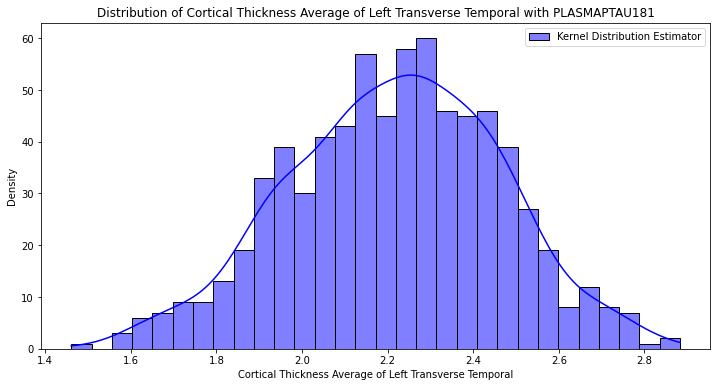

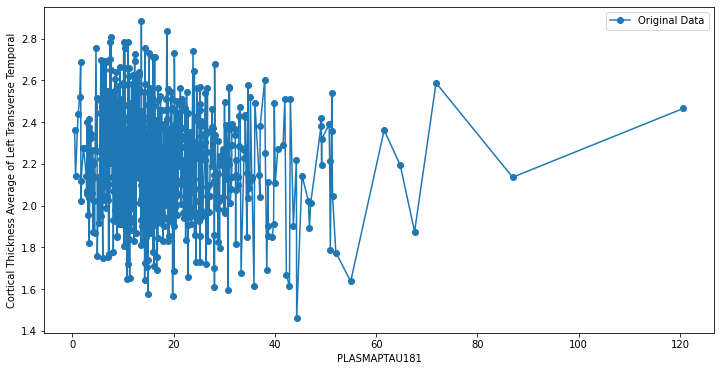


Testing Cortical Thickness Average of Left Transverse Temporal:
Shapiro-Wilk Test: W=0.997, p=1.514e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.024, p=7.641e-01 (Normal)
Anderson-Darling Test: A=0.587, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


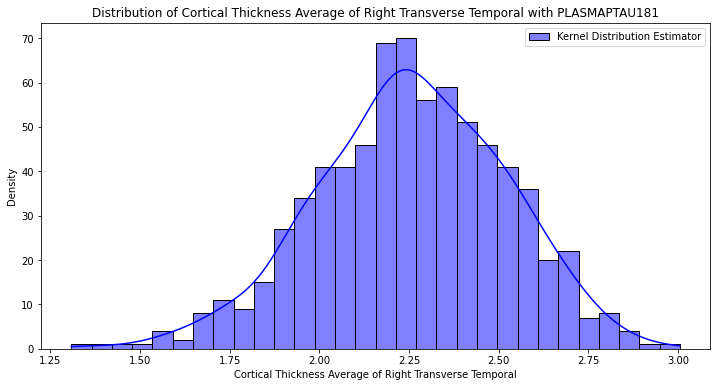

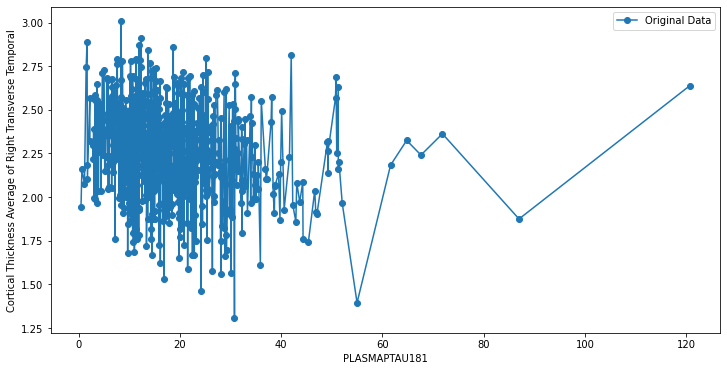


Testing Cortical Thickness Average of Right Transverse Temporal:
Shapiro-Wilk Test: W=0.997, p=1.155e-01 (Normal)
Kolmogorov-Smirnov Test: D=0.025, p=7.281e-01 (Normal)
Anderson-Darling Test: A=0.402, Critical Values=[0.573 0.652 0.783 0.913 1.086], Significance Levels=[15.  10.   5.   2.5  1. ]
(Normal at 5% significance)
-----------------------------------------------------------------------------------


In [42]:
import seaborn as sns
from scipy.stats import shapiro, kstest, anderson

for dependent_var in dependent_variables:
    print(f"Dependent variable: {dependent_var}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_var)

    filtered_df = filtered_df.sort_values(by=dependent_var)
    # Extract the independent variable (X) and target variable (y) values
    X = filtered_df[dependent_var].values
    y = filtered_df[target_names]
    new_y = filtered_df[target_names].values

    for col in y.columns:
        plt.figure(figsize=(12, 6))
        sns.histplot(y[col], kde=True, color='blue', label="Kernel Distribution Estimator", bins=30)
        plt.title(f"Distribution of {names[col]} with {dependent_var}")
        plt.xlabel(names[col])
        plt.ylabel("Density")
        plt.legend()
        plt.show()

        plt.figure(figsize=(12, 6))
        plt.plot(X, y[col], label="Original Data", linestyle='-', marker='o')
        plt.legend()
        plt.xlabel(dependent_var)
        plt.ylabel(names[col])
        plt.show()

        # Perform statistical tests
        print(f"\nTesting {names[col]}:")
        # Shapiro-Wilk Test
        stat, p = shapiro(y[col])
        print(f"Shapiro-Wilk Test: W={stat:.3f}, p={p:.3e} {'(Not Normal)' if p < 0.05 else '(Normal)'}")

        # Kolmogorov-Smirnov Test
        stat, p = kstest(y[col], 'norm', args=(y[col].mean(), y[col].std()))
        print(f"Kolmogorov-Smirnov Test: D={stat:.3f}, p={p:.3e} {'(Not Normal)' if p < 0.05 else '(Normal)'}")

        # Anderson-Darling Test
        result = anderson(y[col], dist='norm')
        print(f"Anderson-Darling Test: A={result.statistic:.3f}, Critical Values={result.critical_values}, "
            f"Significance Levels={result.significance_level}")
        if result.statistic > result.critical_values[2]:  # Typically 5% significance
            print("(Not Normal at 5% significance)")
        else:
            print("(Normal at 5% significance)")

        print("-----------------------------------------------------------------------------------")

In [68]:
from collections import defaultdict

def init_data_defaultdict():
    return defaultdict(lambda: {dependent_variable:pd.DataFrame() for dependent_variable in dependent_variables})
    # return defaultdict(lambda: {lambda: {dependent_variable:pd.DataFrame() for dependent_variable in dependent_variables}})
    # return {model: {dependent_variable:pd.DataFrame() for dependent_variable in dependent_variables} for model in models}
# Try putting original in this as well
def init_data_dict():
    return {dependent_variable:pd.DataFrame() for dependent_variable in dependent_variables}
synthetic_data_dict, test_data_dict, original_data_dict, model_metrics = init_data_defaultdict(), init_data_defaultdict(), init_data_dict(), init_data_defaultdict()

In [ ]:
import shutil
model_dir = ["ctgan", "vae", "gaussian_copula"]
sub_dir = ["histogram", "scatter", "correlation", "boxplot", "training"]
for model in model_dir:
    for sub in sub_dir:
        for dependent_variable in dependent_variables:
            path = os.path.join("./plots", model, sub, dependent_variable)
            # If the directory already exists, delete it
            if os.path.exists(path):
                shutil.rmtree(path)
                print(f"🗑️ Directory {path} deleted successfully")
            # Create fresh directories
            os.makedirs(path)
            print(f"📂 Directory {path} created successfully")

# path = "./hyperparameters"
path = ["./hyperparameters", "./metrics"]
for p in path:
    for model in model_dir:
        if os.path.exists(f"{p}/{model}"):
            shutil.rmtree(f"{p}/{model}")
            print(f"🗑️ Directory {p}/{model} deleted successfully")
        os.makedirs(f"{p}/{model}")
        print(f"📁 Directory {p}/{model} created successfully")

🗑️ Directory ./plots\ctgan\histogram\ABETA42 deleted successfully
📂 Directory ./plots\ctgan\histogram\ABETA42 created successfully
🗑️ Directory ./plots\ctgan\histogram\APVOLUME deleted successfully
📂 Directory ./plots\ctgan\histogram\APVOLUME created successfully
🗑️ Directory ./plots\ctgan\histogram\TAU deleted successfully
📂 Directory ./plots\ctgan\histogram\TAU created successfully
🗑️ Directory ./plots\ctgan\histogram\PTAU deleted successfully
📂 Directory ./plots\ctgan\histogram\PTAU created successfully
🗑️ Directory ./plots\ctgan\histogram\PLASMAPTAU181 deleted successfully
📂 Directory ./plots\ctgan\histogram\PLASMAPTAU181 created successfully
🗑️ Directory ./plots\ctgan\scatter\ABETA42 deleted successfully
📂 Directory ./plots\ctgan\scatter\ABETA42 created successfully
🗑️ Directory ./plots\ctgan\scatter\APVOLUME deleted successfully
📂 Directory ./plots\ctgan\scatter\APVOLUME created successfully
🗑️ Directory ./plots\ctgan\scatter\TAU deleted successfully
📂 Directory ./plots\ctgan\sca

In [45]:
# %pip install ctgan

In [49]:
def compute_correlation_matrix_mad(original_data, synthetic_data):
    """
    Compute the correlation matrix mean absolute difference (MAD) between the original and synthetic data.

    Parameters:
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
    """

    # Correlation matrix
    original_correlation_matrix = original_data.corr(method="spearman")
    synthetic_correlation_matrix = synthetic_data.corr(method="spearman")

    # Mean Absolute Difference (MAD) of the correlation matrices
    correlation_matrix_mad = np.mean(np.abs(original_correlation_matrix - synthetic_correlation_matrix))

    # A lower MAD indicates a better match between the original and synthetic data
    return correlation_matrix_mad

In [50]:
from scipy.stats import gaussian_kde
from scipy.spatial.distance import jensenshannon

def compute_js_divergence(original_data, synthetic_data, bins=50):
    """
    Compute the Jensen-Shannon divergence between the original and synthetic data.

    Parameters:
        original_data (dataframe): The original data.
        synthetic_data (dataframe): The synthetic data.
        bins (int): The number of bins to use for the histogram.
    """

    total_divergence = 0
    n_features = len(original_data.columns)

    for column in original_data.columns:
        # Extract the feature values
        original_feature = original_data[column].values
        synthetic_feature = synthetic_data[column].values

        # Compute range for current feature/histogram
        min_value = min(original_feature.min(), synthetic_feature.min())
        max_value = max(original_feature.max(), synthetic_feature.max())
        x_range = np.linspace(min_value, max_value, bins)

        # Estimate the densities
        kde_original = gaussian_kde(original_feature)
        kde_synthetic = gaussian_kde(synthetic_feature)

        # Compute probabilities
        p = kde_original(x_range)
        q = kde_synthetic(x_range)

        # Add epsilon to prevent division by 0
        epsilon = 1e-10

        # To prevent division by 0
        p_sum = np.sum(p)
        q_sum = np.sum(q)
        if p_sum <= epsilon or q_sum <= epsilon:
            print(f"Warning: Unstable density estimation detected (p_sum={p_sum}, q_sum={q_sum}). Using fallback value:0.5")
            return 0.5  # Return a moderate fallback value

        # Normalize to ensure they sum to 1
        p = p / p_sum
        q = q / q_sum

        # Add to tatal divergence
        total_divergence += jensenshannon(p, q)

        if np.isnan(total_divergence) or np.isinf(total_divergence):
            print("Warning: JS divergence calculation unstable, using fallback value:0.5")
            return 0.5

    # A lower JS divergence indicates a better match between the original and synthetic data
    return total_divergence / n_features

In [51]:
def compute_summary_statistics(original_data, synthetic_data):
    """
    Compute summary statistics for the original and synthetic data.

    Parameters:
        original_data (dataframe): The original data.
        synthetic_data (dataframe): The synthetic data.

    Returns:
        Relative (%) average difference between the summary statistics of the original and synthetic data.
    """

    total_difference = 0
    n_features = len(original_data.columns)

    # Summary statistics
    original_data_summary = original_data.describe().drop(index=["count", "min", "max"], axis=0)
    synthetic_data_summary = synthetic_data.describe().drop(index=["count", "min", "max"], axis=0)

    for column in original_data.columns:
        # Extract the feature summary statistics
        original_col_stat = original_data_summary[column]
        synthetic_col_stat = synthetic_data_summary[column]

        # To compute the relative scale based difference
        data_range = original_col_stat.max() - original_col_stat.min()
        # Compute the relative difference
        relative_difference = np.abs(original_col_stat - synthetic_col_stat) / data_range

        # Find the mean relative difference and add to total difference
        total_difference += np.mean(relative_difference)

    # A lower relative difference indicates a better match between the original and synthetic data
    return total_difference / n_features

In [52]:
def evaluate_model(original_data, synthetic_data):
    """
    Evaluate the synthetic data generated by a model using the following metrics:
    1. Mean absolute difference (MAD) of the correlation matrices.
    2. Jensen-Shannon Divergence.
    3. Summary statistics.

    Parameters:
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.

    Returns:
        dict: A dictionary containing the evaluation metrics.
    """

    metrics = {}

    # Mean absolute difference (MAD)
    metrics["correlation_diff"] = compute_correlation_matrix_mad(original_data, synthetic_data)
    print(f"Mean absolute difference (MAD) of the correlation matrices: {metrics['correlation_diff']}")

    # Jensen-Shannon Divergence
    metrics["jensen_shannon_divergence"] = compute_js_divergence(original_data, synthetic_data)
    print(f"JS Divergence: {metrics['jensen_shannon_divergence']}")

    # Summary statistics
    metrics["summary_stats"] = compute_summary_statistics(original_data, synthetic_data)
    print(f"Summary stats {metrics['summary_stats']}")

    return metrics

In [53]:
# Function to compute normalised score
# We are doing this so that, if the model get a very good value for one metric, say jsd, and bad for say correlation,
# then adding the two without normalising, will result in a score that has more weightage on correlation. And the model will try to reduce this score
# Got to make sure each metric contributes proportionally to the score
def compute_normalised_score(all_metrics, metrics):
  # Only normalize after collecting enough samples
  if len(all_metrics["correlation_diff"]) >= 3:
    # Calculate normalised factor using 90th percentile
    norm_factors = {
        k:max(np.percentile(v, 90), 0.1) for k, v in all_metrics.items()
    }

    # Occasionally print to verify normalization is working
    if len(all_metrics["correlation_diff"]) % 10 == 0:
      print(f"Norm factor: corr={norm_factors['correlation_diff']:.4f}, "
            f"js={norm_factors['jensen_shannon_divergence']:.4f}, "
            f"summary={norm_factors['summary_stats']:.4f}"
            )

    norm_score = (
        metrics["correlation_diff"] / norm_factors["correlation_diff"]+
        metrics["jensen_shannon_divergence"] / norm_factors["jensen_shannon_divergence"]+
        metrics["summary_stats"] / norm_factors["summary_stats"]
    )

    # Show raw vs normalised occasionally
    if len(all_metrics["correlation_diff"]) % 10 == 0:
      raw_score = sum(metrics.values())
      print(f"Raw score: {raw_score:.4f}, Normalised: {norm_score:.4f}")

    return norm_score

  else:
    return sum(metrics.values())

In [54]:
# %pip install hyperopt

In [55]:
from hyperopt import hp

# Define the search space for the hyperparameters
param_space = {
    "batch_size": hp.choice("batch_size", [32, 64, 128, 256]),
    "generator_dim": hp.choice("generator_dim", [(128, 128), (256, 256), (256, 512), (512, 256), (256, 256, 256), (512, 256, 128)]),
    "discriminator_dim": hp.choice("discriminator_dim", [(128, 128), (256, 256), (256, 512), (512, 256), (256, 256, 256), (512, 256, 128)]),
    "generator_lr": hp.loguniform("generator_lr", np.log(1e-5), np.log(5e-3)),
    "discriminator_lr": hp.loguniform("discriminator_lr", np.log(1e-5), np.log(5e-3)),
    "embedding_dim": hp.choice("embedding_dim", [64, 128, 256]),
    "discriminator_steps": hp.choice("discriminator_steps", [1, 3, 5]),
    "pac": hp.choice("pac", [1, 4, 8, 16]),
    "epochs": hp.choice("epochs", [500, 1000, 2000])
}

In [56]:
import gc

def optimize_memory():
  if torch.cuda.is_available():
    torch.cuda.empty_cache()
  gc.collect()

In [57]:
print(torch.cuda.is_available())

False


In [ ]:
from hyperopt import fmin, tpe, Trials, STATUS_OK, STATUS_FAIL, space_eval
from ctgan import CTGAN

def ctgan_bayesian_optimization(dependent_variable, df, param_space):
  # Initialize metric collection for normalization
  all_metrics = {
      "correlation_diff" : [],
      "jensen_shannon_divergence" : [],
      "summary_stats" : []
  }

  metrics_hist = []

  # Define the objective function
  def objective(param_space):
    # Track the best loss seen so far
    global best_loss
    if not hasattr(objective, "best_loss"):
      objective.best_loss = float("inf")

    try:
      # Initialize the CTGAN model
      ctgan = CTGAN(
          epochs=int(param_space["epochs"]),
          verbose=False,
          batch_size=int(param_space["batch_size"]),
          generator_dim=tuple(map(int, param_space["generator_dim"])),
          discriminator_dim=tuple(map(int, param_space["discriminator_dim"])),
          generator_lr=param_space["generator_lr"],
          discriminator_lr=param_space["discriminator_lr"],
          embedding_dim=int(param_space["embedding_dim"]),
          pac=int(param_space["pac"])
      )

      # Train the model with periodic evaluation
      eval_frequency = 50             # Evaluate the model every 50 epochs
      best_score = float("inf")
      patience = 3                    # Stop training if the loss does not improve for 3 evaluations
      patience_counter = 0
      improvement_threshold = 0.98    # Start with a strick threshold

      # Train and evaluate in chunks
      for epoch_start in range(0, 1000, eval_frequency):
        # Adjust threshold based on epoch
        if epoch_start >= 400:
          improvement_threshold = 0.995                 # More lenient for later epochs
        elif epoch_start >= 200:
          improvement_threshold = 0.99

        # Train for eval_frequency epochs
        ctgan.fit(df, epochs=eval_frequency)

        # Generate and evaluate the synthetic data
        synthetic_data = ctgan.sample(5*len(df))
        metrics = evaluate_model(df, synthetic_data)

        # Collect metrics for normalization
        for k in all_metrics.keys():
            all_metrics[k].append(metrics[k])

        # Compute the normalised score
        current_score = compute_normalised_score(all_metrics, metrics)
        print(f"Epoch: {epoch_start + eval_frequency}, Score: {current_score}")

        metrics_hist.append({
            "epoch": epoch_start + eval_frequency,
            "score": current_score,
            "metrics": metrics
        })

        # Check for improvement with dynamic threshold
        if current_score < best_score * improvement_threshold:
            best_score = current_score
            patience_counter = 0
        else:
            patience_counter += 1

        # Early stopping check
        if patience_counter >= patience:
            print(f"Early stopping at epoch: {epoch_start + eval_frequency}")
            break

        # Check if this run is significantly worse than the best seen
        if epoch_start > 100 and current_score > 1.5 * objective.best_loss:
            print(f"Stopping poor performing run at epoch: {epoch_start + eval_frequency}")
            return {
                "loss": float("inf"),
                "status": STATUS_OK,
                "early_stopping": True,
                "stoppage_epoch": epoch_start + eval_frequency
            }

      # Generate the final synthetic data
      generated_synthetic_data = ctgan.sample(5*len(df))
      synthetic_data = pd.DataFrame(
          generated_synthetic_data,
          columns=df.columns
      )

      # Evaluate the data
      metrics = evaluate_model(df, synthetic_data)
      for k in all_metrics.keys():
          all_metrics[k].append(metrics[k])
      # Calculate the normalised score for hyperparameter optimization
      score = compute_normalised_score(all_metrics, metrics)

      if score < objective.best_loss:
          objective.best_loss = score

      return {
          "loss": score,                                  # Hyperopt minimizes the loss
          "status": STATUS_OK,                            # Successful run
          "metrics": metrics,                             # Additional information to keep track of the metrics
          "metrics_hist": metrics_hist,
          "final_epoch": epoch_start + eval_frequency     # The final epoch at which the model was trained
      }


    except Exception as e:
      print(f"Error: {e}")
      return {
          "loss": float("inf"),   # Set loss to infinity in case of an error
          "status": STATUS_FAIL,  # Unsuccessful run
          "exception": str(e)     # Store the exception for debugging
      }

  # Initialize the trials object
  trials = Trials()
  best = fmin(
      fn=objective,
      space=param_space,              # Parameter search space
      algo=tpe.suggest,               # The Bayesian optimization algorithm (Tree Parzen Estimator)
      max_evals=25,                   # Maximum number of evaluations
      trials=trials                   # Trials object to store the results
  )

  actual_params = space_eval(param_space, best)                       # To see the actual values of the best parameters given the index
  print(f"Best Parameters for {dependent_variable}: {actual_params}")
  print(f"Best Score: {trials.best_trial['result']['loss']}")
  return actual_params, trials, metrics_hist

In [59]:
# use like stochastic gradient decent maybe to find teh bets parameter. Not sure maybe start a new conversation

In [60]:
# CTGAN hyperparameter optimization
from sklearn.preprocessing import RobustScaler

# Dictionary to store the best parameters, results and metrics history for each dependent variable
best_params = {}
results = {}
metrics_history = {}

for dependent_variable in dependent_variables:
    print(f"Dependent variable: {dependent_variable}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_variable)

    scalar = RobustScaler()
    scaled_data = scalar.fit_transform(filtered_df)
    scaled_df = pd.DataFrame(scaled_data, columns=filtered_df.columns)

    noise_factor = 0.005
    scaled_df += np.random.normal(0, noise_factor, scaled_df.shape)

    # best_params, result = ctgan_grid_search(scaled_df, param_grid)
    best_params[dependent_variable], results[dependent_variable], metrics_history[dependent_variable] = ctgan_bayesian_optimization(dependent_variable, scaled_df, param_space)

    # Clean up memory
    optimize_memory()


Dependent variable: ABETA42
Mean absolute difference (MAD) of the correlation matrices: 0.30999205417576203
JS Divergence: 0.5790332818137792                     
Summary stats 1.2483735074982556                      
Epoch: 50, Score: 2.137398843487797                   
Mean absolute difference (MAD) of the correlation matrices: 0.3417903590280538
JS Divergence: 0.43497663012058774                    
Summary stats 0.7743192102906084                      
Epoch: 100, Score: 1.5510861994392497                 
Mean absolute difference (MAD) of the correlation matrices: 0.3232688424315528
JS Divergence: 0.6544569066831524                     
Summary stats 1.2324690539994767                      
Epoch: 150, Score: 2.969548127752282                  
Mean absolute difference (MAD) of the correlation matrices: 0.3304077657110175
JS Divergence: 0.5539119384476792                     
Summary stats 0.9617917013058613                      
Epoch: 200, Score: 2.626523537651711              

In [61]:
# Visualize hyperparameter optimization
def plot_hyperopt_results(trials, hyper_param_name, dependent_variable):
  '''
  Plot the values of a hyperparameter against the loss value
  '''
  plt.figure(figsize=(12, 6))

  # Extract parameter values and corresponding values
  values = [trial["misc"]["vals"][hyper_param_name][0] if isinstance(trial["misc"]["vals"][hyper_param_name], list) and len(trial["misc"]["vals"][hyper_param_name]) > 0 else None for trial in trials.trials]
  losses = [trial["result"]["loss"] if trial["result"]["status"] == "ok" else float("inf") for trial in trials.trials]

  if hyper_param_name in ["batch_size", "embedding_dim", "discriminator_steps", "pac", "epochs"]:
    values = [param_space[hyper_param_name][int(val)] if val is not None else None for val in values]

  plt.scatter(values, losses, alpha=0.5)
  plt.xlabel(f"Value of {hyper_param_name}")
  plt.ylabel("Loss (lower is better)")
  plt.title(f"Hyperparameter Optimization for {hyper_param_name} - {dependent_variable}")

  if hyper_param_name in ["generator_lr", "discriminator_lr"]:
    plt.xscale("log")
  plt.grid(True, alpha=0.3)
  plt.tight_layout()
  plt.show()



In [62]:
def plot_convergence(trials, dependent_variable):
  '''
  Plot the convergence of the hyperparameter optimization
  '''

  plt.figure(figsize=(12, 6))

  # Extract trials information
  iterations = range(1, len(trials.losses()) + 1)
  best_values = np.minimum.accumulate(trials.losses())

  # Plot the convergence
  plt.plot(iterations, trials.losses(), "o-", alpha=0.5, label="Trial loss")
  plt.plot(iterations, best_values, "r-", linewidth=2, label="Best loss")
  plt.xlabel("Iteration")
  plt.ylabel("Loss (lower is better)")
  plt.title(f"Convergence of Bayesian Optimization for {dependent_variable}")
  plt.legend()
  plt.grid(True, alpha=0.3)
  plt.tight_layout()
  plt.show()

In [63]:
def plot_training_metrics(metrics_hist, dependent_variable):
  '''
  Plot the evolution of metrics during training
  '''

  if not metrics_hist:
    return None

  epochs = [metric["epoch"] for metric in metrics_hist]
  scores = [metric["score"] for metric in metrics_hist]
  js_divergence = [metric["metrics"]["jensen_shannon_divergence"] for metric in metrics_hist]
  correlation_diff = [metric["metrics"]["correlation_diff"] for metric in metrics_hist]
  summary_stats = [metric["metrics"]["summary_stats"] for metric in metrics_hist]

  plt.figure(figsize=(12, 6))
  # Plot JS Difference
  plt.plot(epochs, js_divergence, label="JS Divergence", linestyle='--', marker='x')
  plt.xlabel("Epoch")
  plt.ylabel("JS Divergence")
  plt.title(f"Evolution of JS Divergence for {dependent_variable}")

  # Plot summary statistics
  plt.plot(epochs, summary_stats, label="Summary Stats", linestyle='--', marker='x')
  plt.xlabel("Epoch")
  plt.ylabel("Summary Stats")
  plt.title(f"Evolution of Summary Stats for {dependent_variable}")

  # Plot correaltion difference
  plt.plot(epochs, correlation_diff, label="Correlation Diff", linestyle='--', marker='x')
  plt.xlabel("Epoch")
  plt.ylabel("Correlation Diff")
  plt.title(f"Evolution of Correlation Diff for {dependent_variable}")

  # Plot overall score
  plt.plot(epochs, scores, label="Score", linestyle='-', marker='o')
  plt.xlabel("Epoch")
  plt.ylabel("Score")
  plt.title(f"Evolution of Score for {dependent_variable}")

In [74]:
synthetic_data_dict["ctgan"]["PLASMAPTAU181"].head()

,PLASMAPTAU181,ST58TA,ST117TA,ST40TA,ST99TA,ST32TA,ST91TA,ST60TA,ST119TA,ST62TA,ST121TA
501,-5.836965,2.859928,2.590978,2.756049,2.953456,2.690339,2.977863,3.863402,3.230154,2.343636,2.492891
3039,-4.701213,2.542520,2.514397,2.196872,2.755511,2.588903,2.678284,3.811694,3.333666,2.179412,2.049008
2579,-4.312456,2.662880,2.523729,2.682103,2.929121,2.622281,2.849644,3.564549,3.896517,2.346210,2.106585
31,-3.818879,2.640902,2.453796,2.454715,2.914335,2.325809,2.625108,3.417684,2.787843,2.317941,2.449760
2996,-3.436993,2.029555,2.113536,2.267367,2.394734,2.103897,2.494985,3.084324,2.413761,2.265536,2.521587


Error plotting batch_size: setting an array element with a sequence.


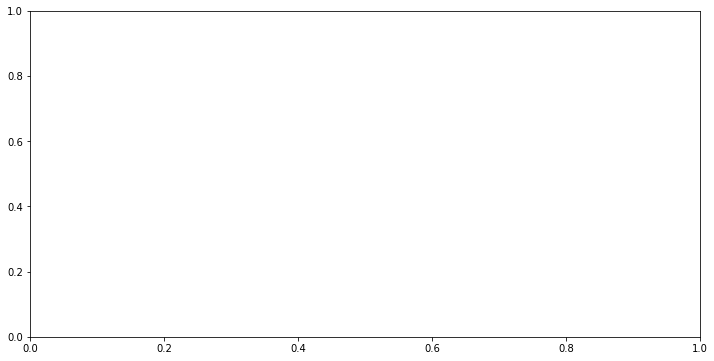

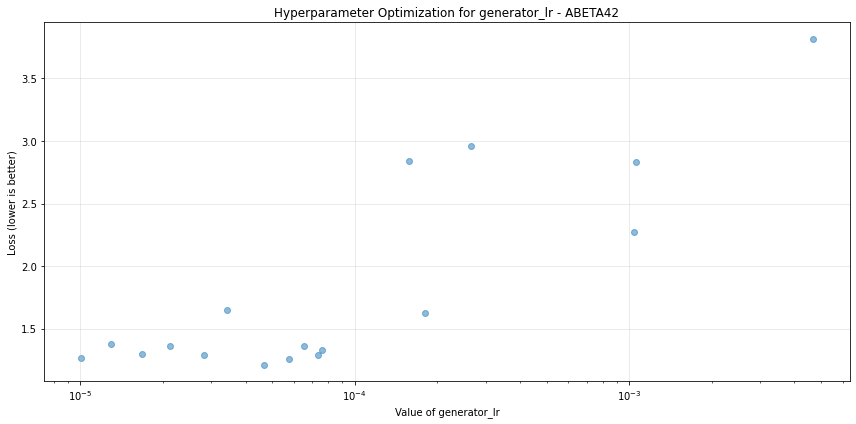

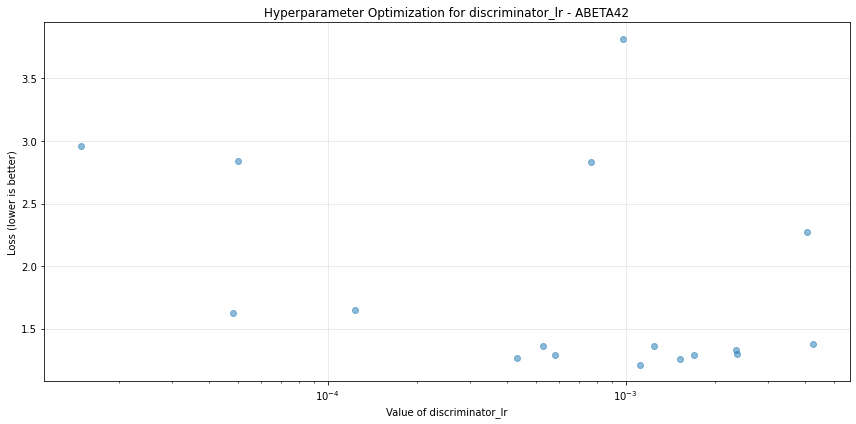

Error plotting embedding_dim: setting an array element with a sequence.
Error plotting pac: setting an array element with a sequence.
Error plotting epochs: setting an array element with a sequence.
Error plotting discriminator_steps: setting an array element with a sequence.


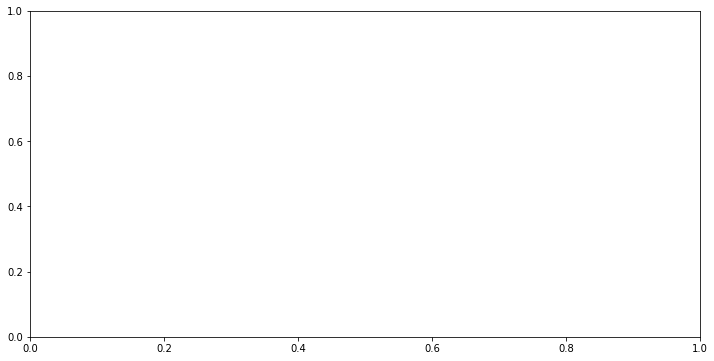

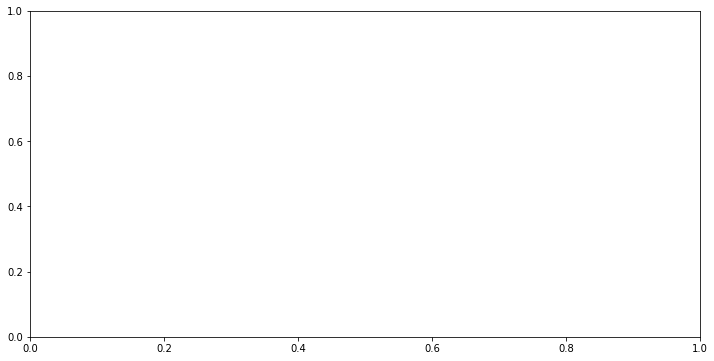

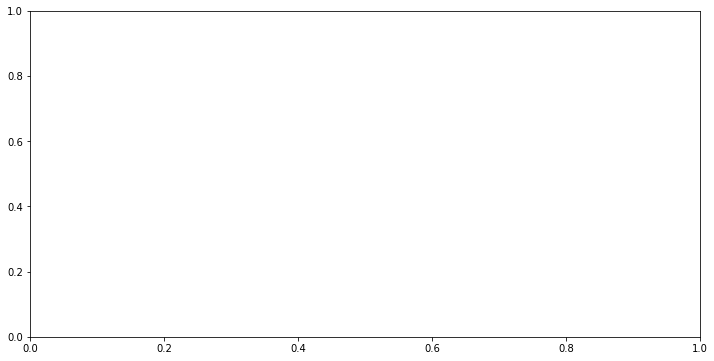

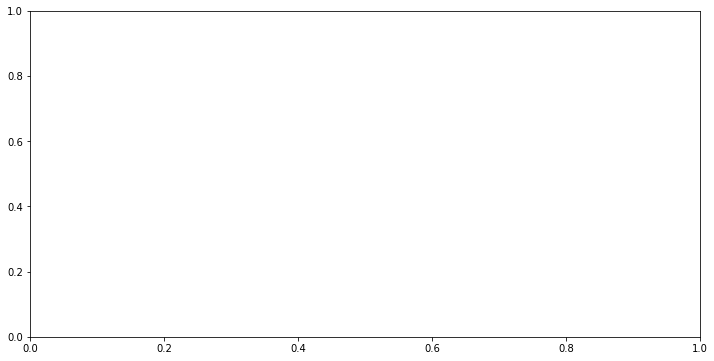

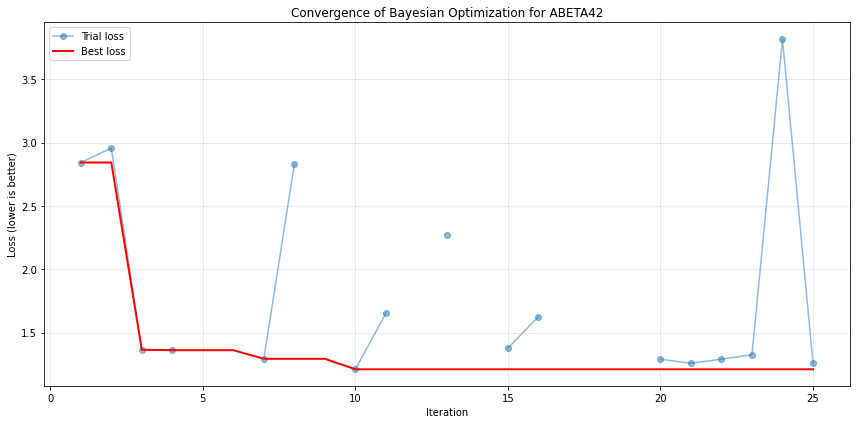

Error plotting batch_size: setting an array element with a sequence.


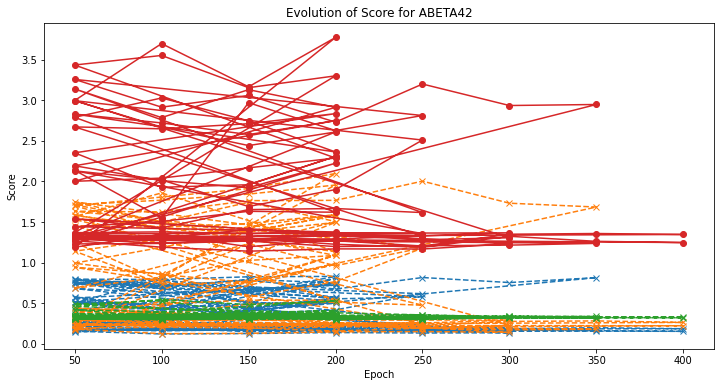

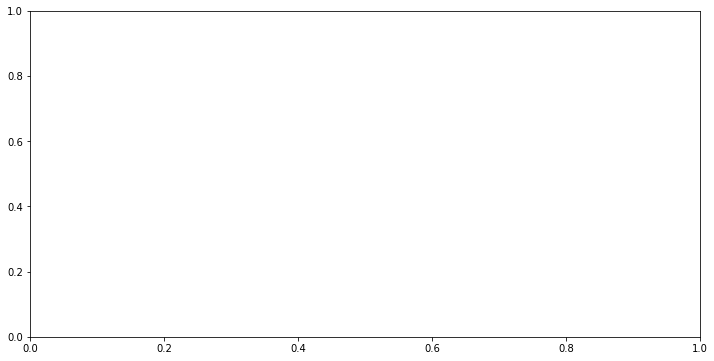

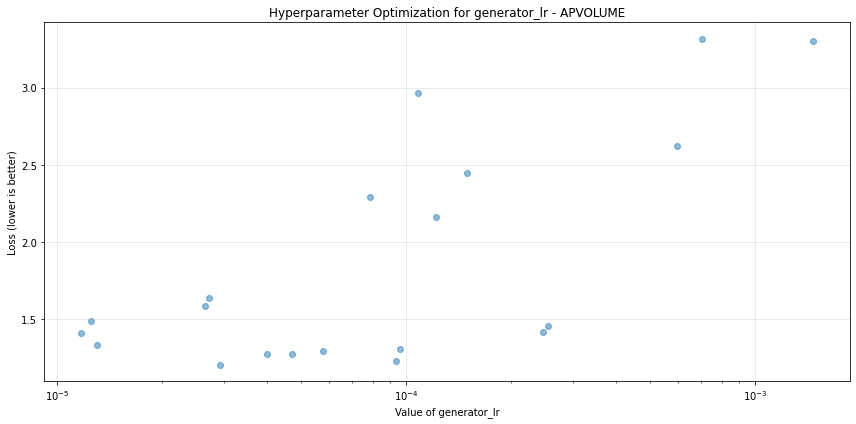

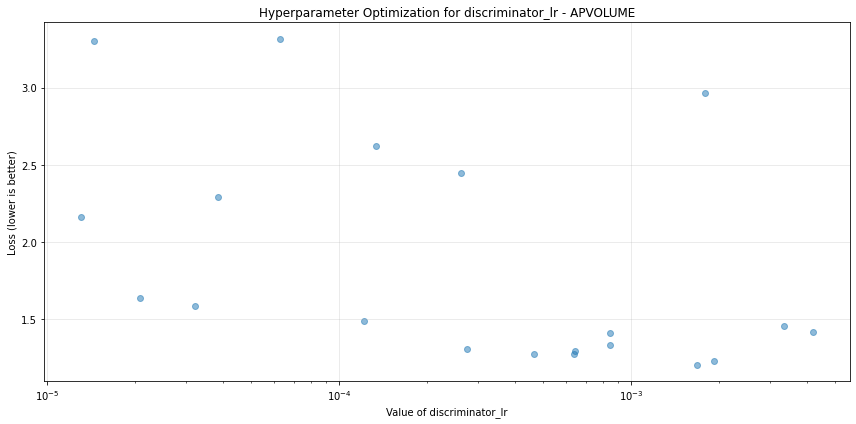

Error plotting embedding_dim: setting an array element with a sequence.
Error plotting pac: setting an array element with a sequence.
Error plotting epochs: setting an array element with a sequence.
Error plotting discriminator_steps: setting an array element with a sequence.


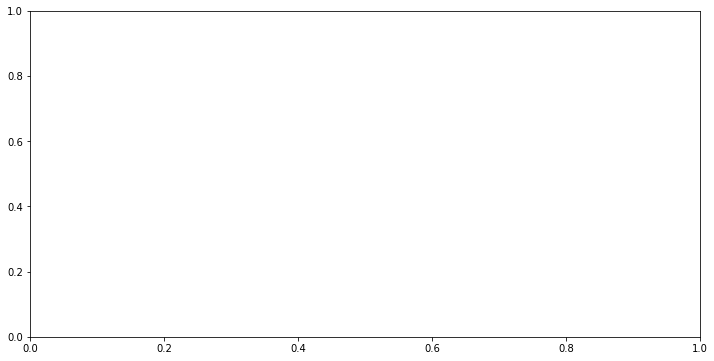

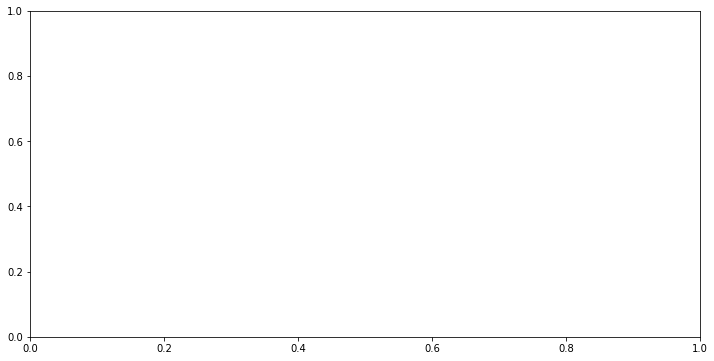

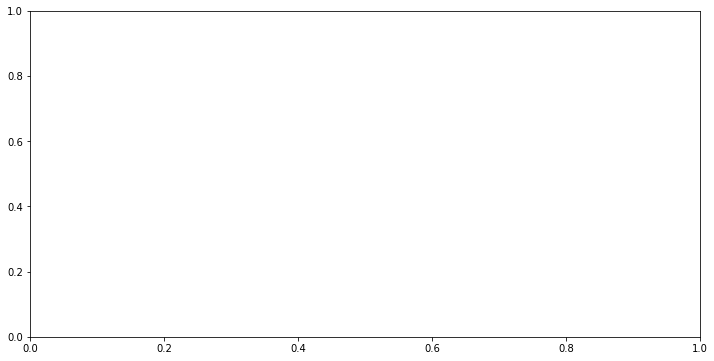

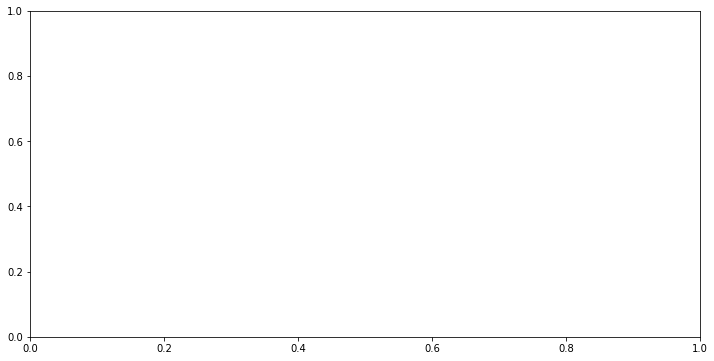

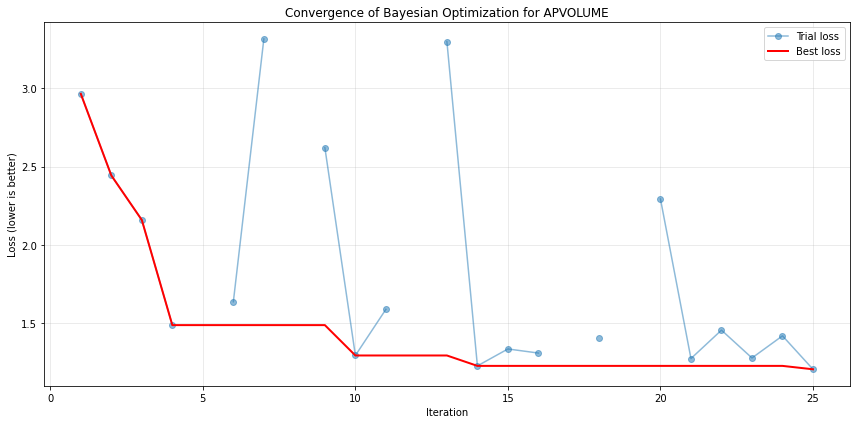

Error plotting batch_size: setting an array element with a sequence.


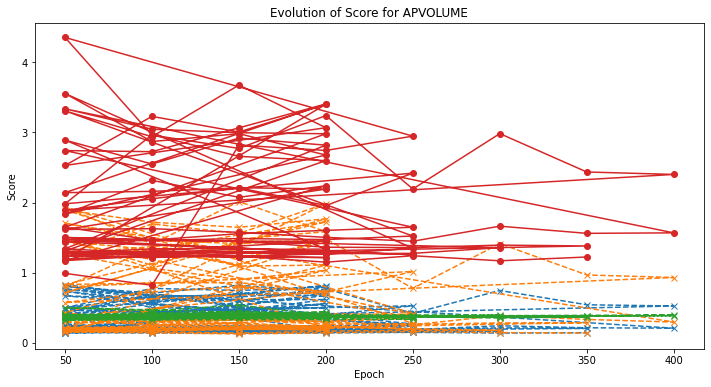

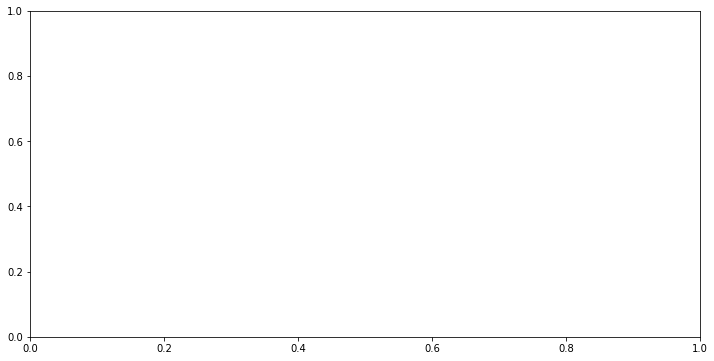

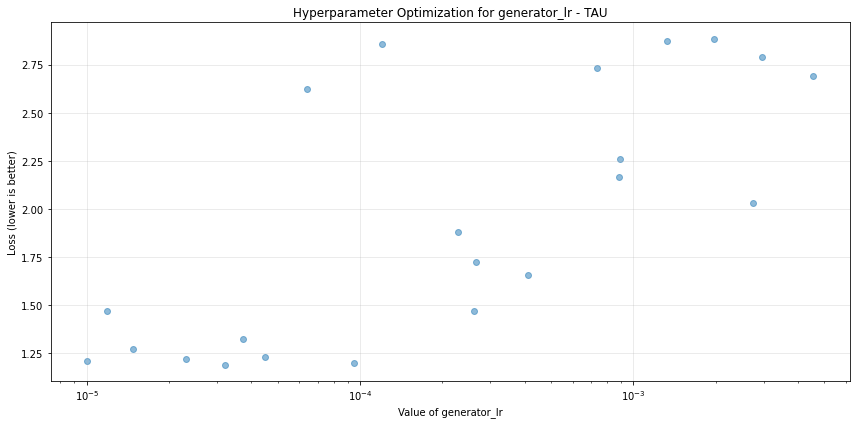

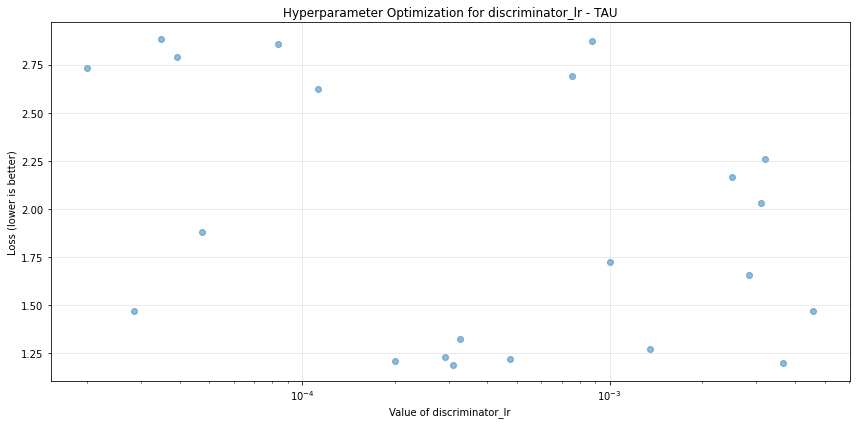

Error plotting embedding_dim: setting an array element with a sequence.
Error plotting pac: setting an array element with a sequence.
Error plotting epochs: setting an array element with a sequence.
Error plotting discriminator_steps: setting an array element with a sequence.


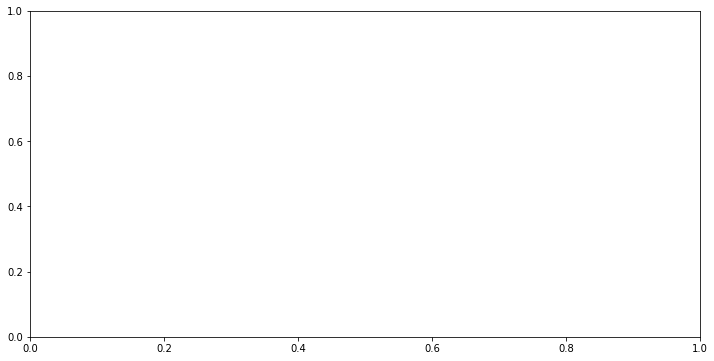

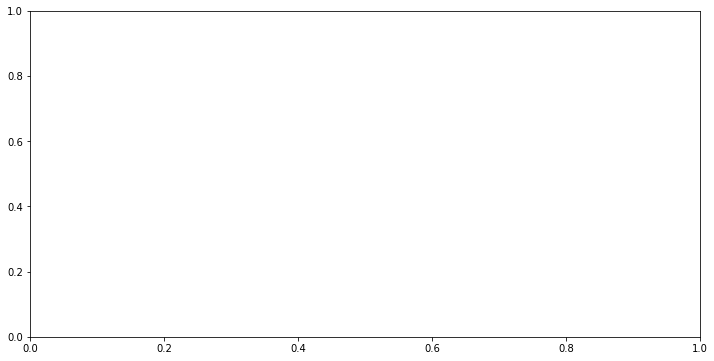

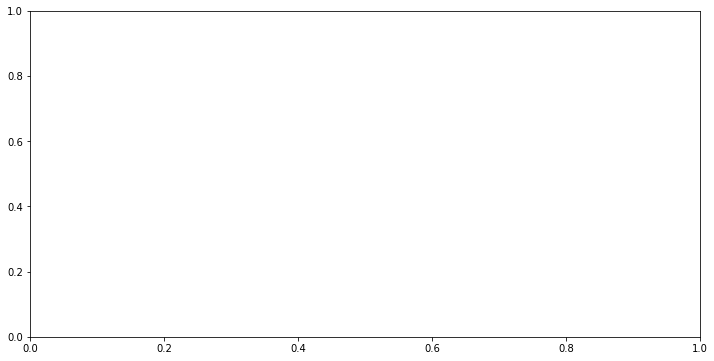

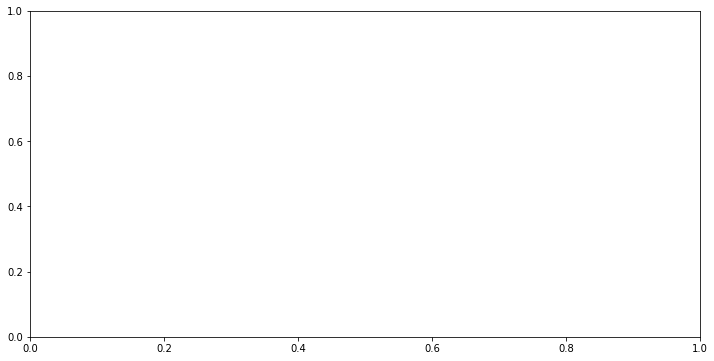

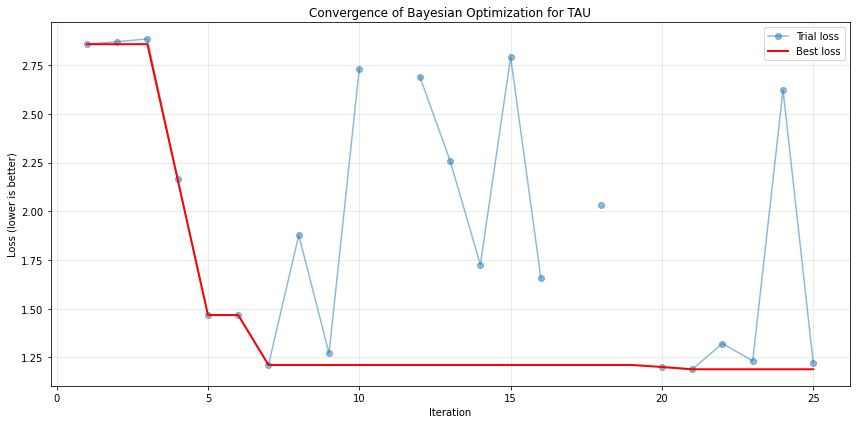

Error plotting batch_size: setting an array element with a sequence.


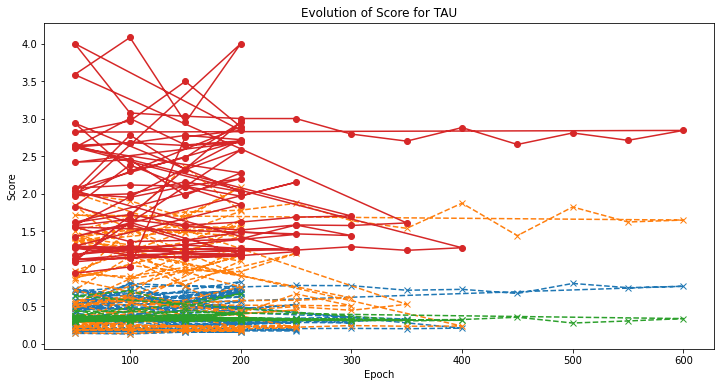

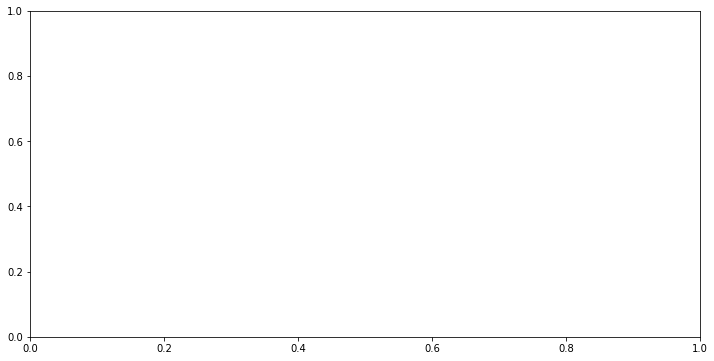

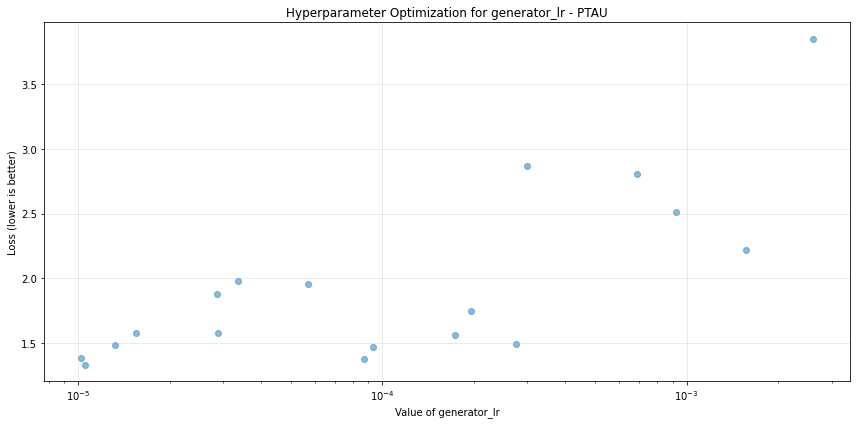

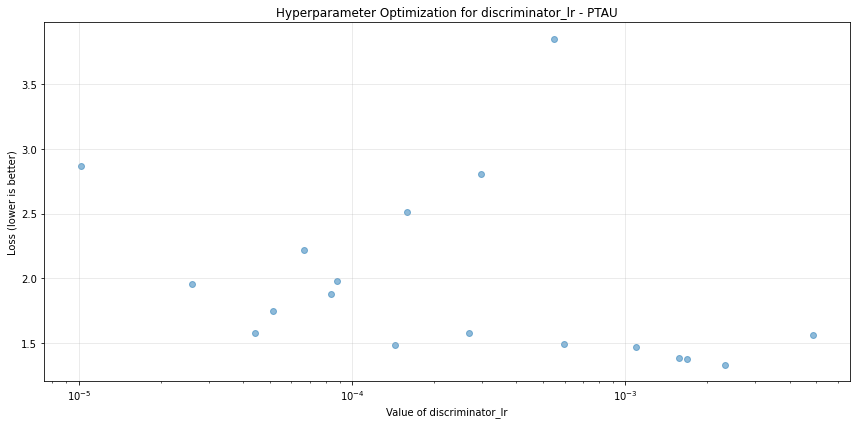

Error plotting embedding_dim: setting an array element with a sequence.
Error plotting pac: setting an array element with a sequence.
Error plotting epochs: setting an array element with a sequence.
Error plotting discriminator_steps: setting an array element with a sequence.


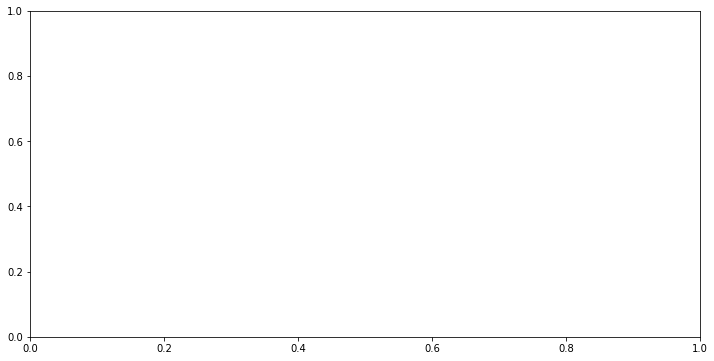

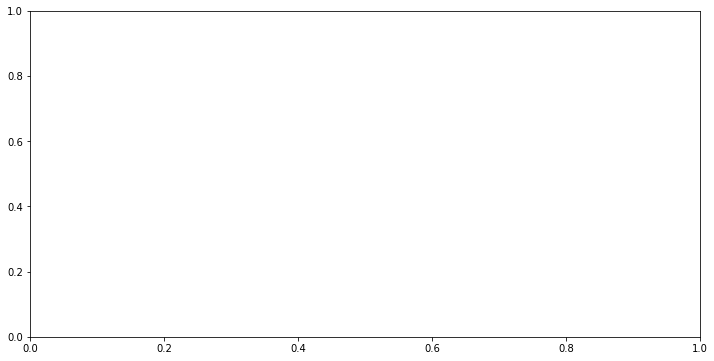

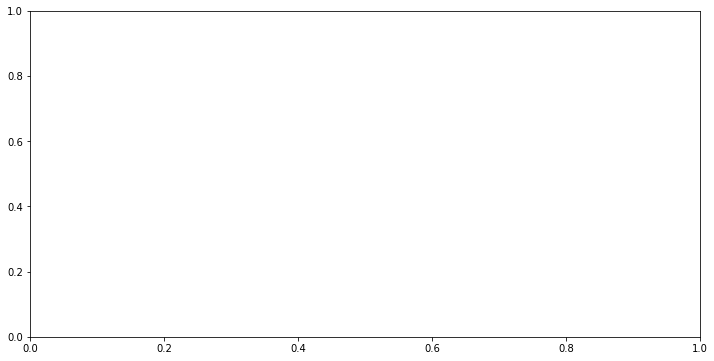

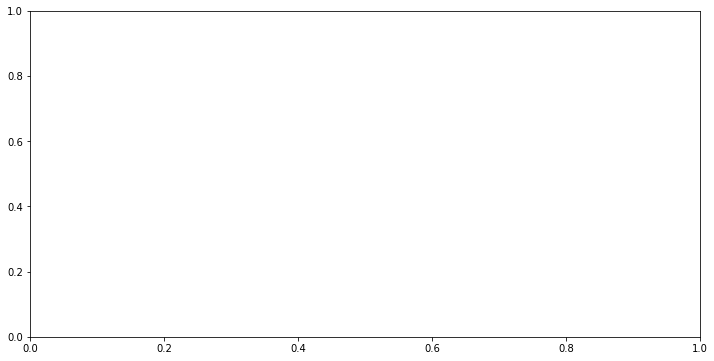

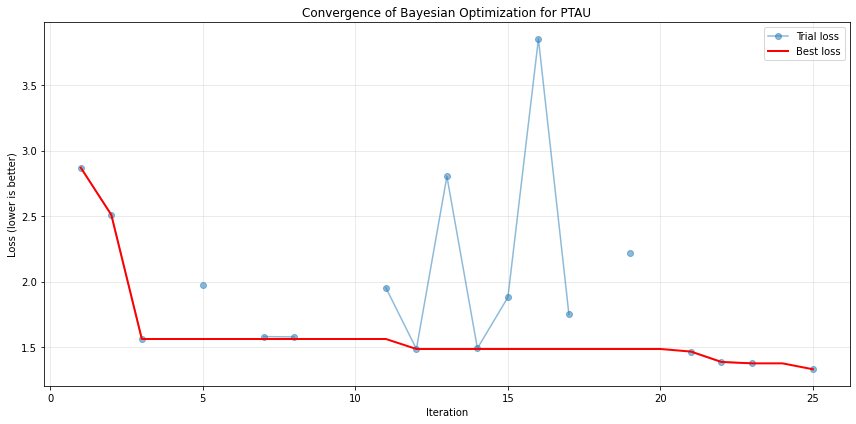

Error plotting batch_size: setting an array element with a sequence.


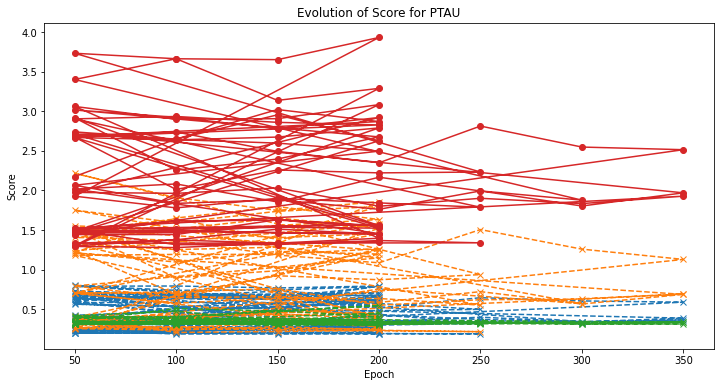

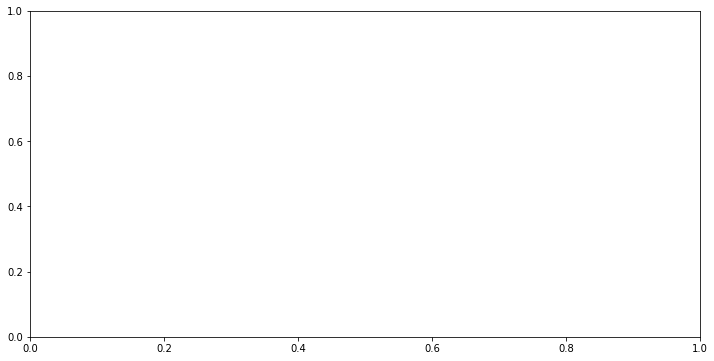

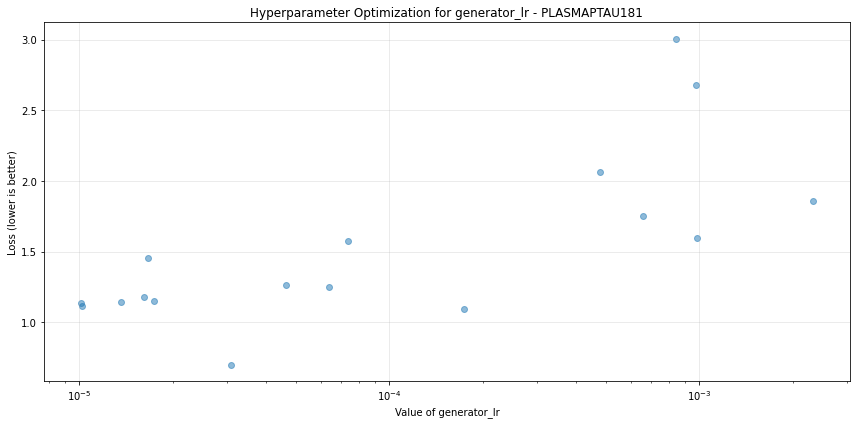

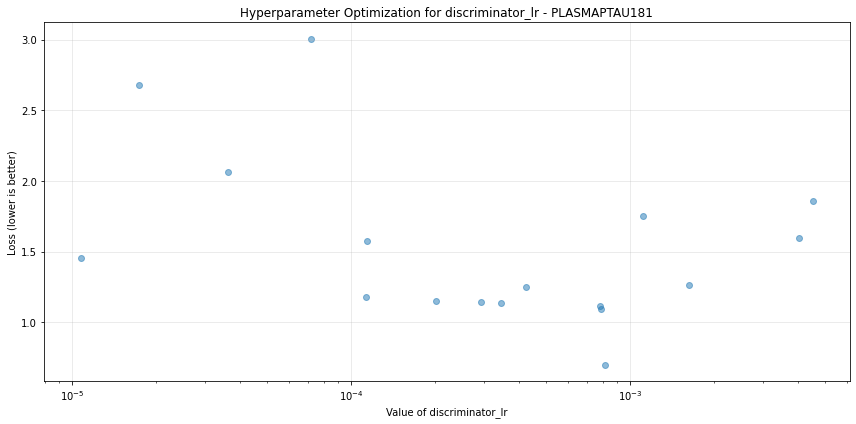

Error plotting embedding_dim: setting an array element with a sequence.
Error plotting pac: setting an array element with a sequence.
Error plotting epochs: setting an array element with a sequence.
Error plotting discriminator_steps: setting an array element with a sequence.


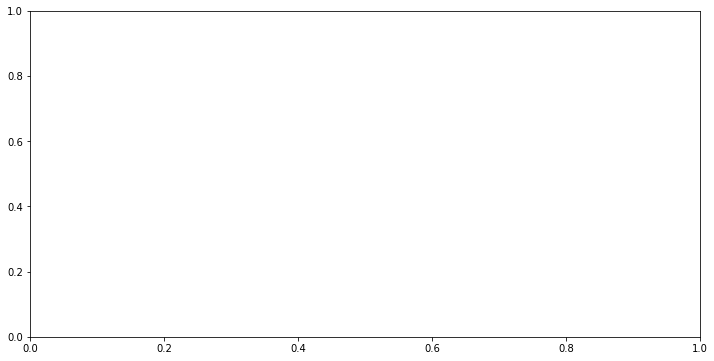

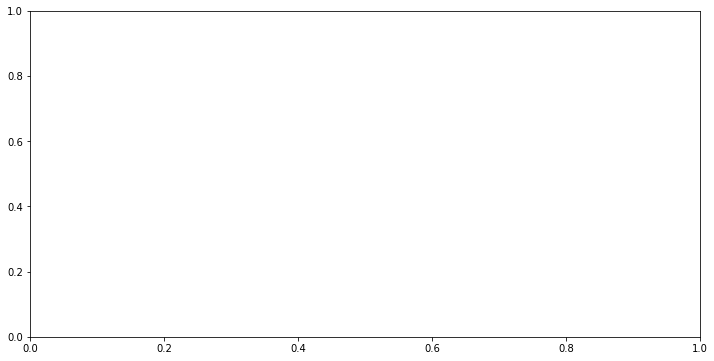

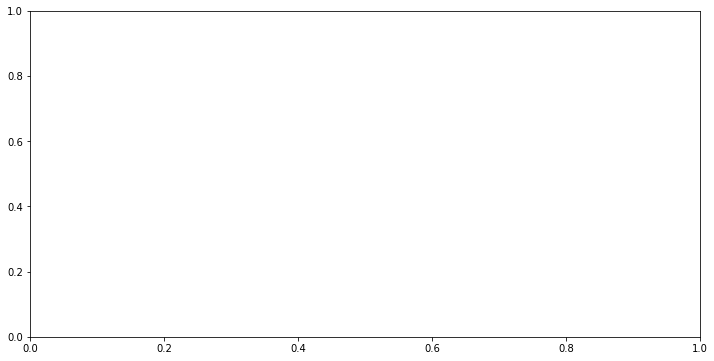

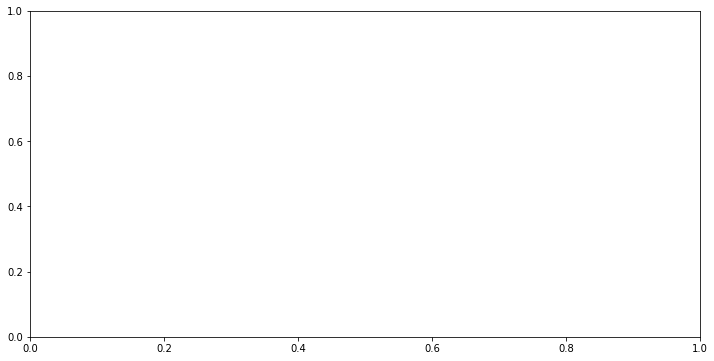

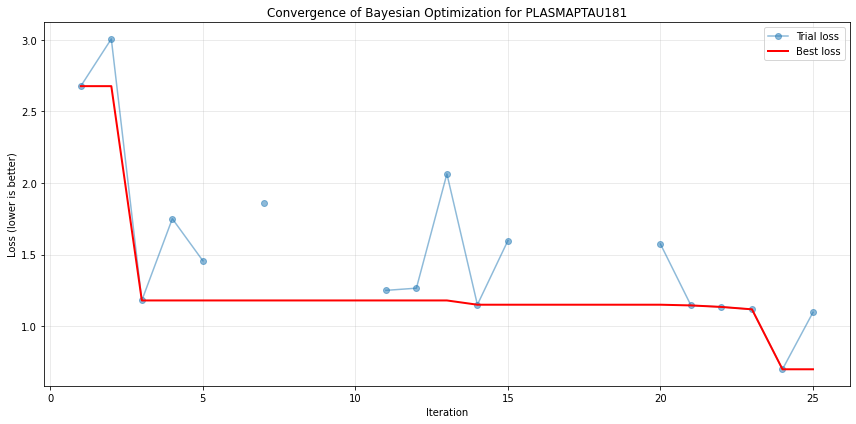

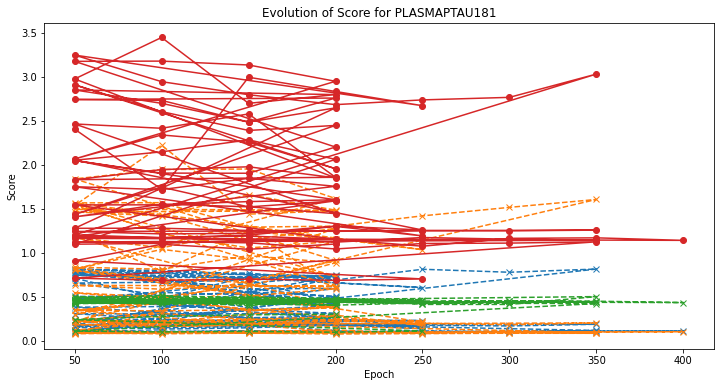

In [73]:
for dependent_variable in dependent_variables:

  # for hyper_param_name in best_params[dependent_variable]:
  #   plot_hyperopt_results(results[dependent_variable], hyper_param_name, dependent_variable)
  # Only plot specific hyperparameters that we know work with the plotting function
    for hyper_param_name in ['batch_size', 'generator_lr', 'discriminator_lr', 'embedding_dim', 'pac', 'epochs', 'discriminator_steps']:
      try:
        plot_hyperopt_results(results[dependent_variable], hyper_param_name, dependent_variable)
      except Exception as e:
        print(f"Error plotting {hyper_param_name}: {e}")
    plot_convergence(results[dependent_variable], dependent_variable)
    plot_training_metrics(metrics_history[dependent_variable], dependent_variable)

In [79]:
def plot_histogram(original_data, synthetic_data, dependent_variable, col):
    """
    Plot the histograms of the original and synthetic data for a given dependent variable.

    Parameters:
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
        col (str): The imdependent variable/target variable to plot.
    """

    plt.figure(figsize=(12, 6))
    sns.histplot(original_data[col], kde=True, color='blue', label=f"Original Data, data points:{len(original_data)}", bins=30, stat="density")
    sns.histplot(synthetic_data[col], kde=True, color='red', label=f"Synthetic Data, data points:{synthetic_data.shape[0]}", bins=30, stat="density")
    plt.title(f"Distribution of {names[col]}")
    plt.xlabel(names[col])
    plt.ylabel("Density")
    plt.legend()
    save_path = os.path.join("./plots/ctgan/histogram", f"{dependent_variable}", f"{col}.png")
    # plt.savefig(save_path, dpi=300)
    plt.savefig(save_path)
    plt.show()
    plt.close()

def plot_scatter(original_data, synthetic_data, dependent_variable, col):
    """
    Plot the scatter plot of the original and synthetic data for a given dependent variable.

    Parameters:
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
        col (str): The imdependent variable/target variable to plot.
    """
    plt.figure(figsize=(12, 6))
    plt.plot(original_data[dependent_variable], original_data[col], label="Original Data", linestyle='-', marker='o')
    plt.plot(synthetic_data[dependent_variable], synthetic_data[col], label="Synthetic Data", linestyle='--', marker='x', alpha=0.7)
    plt.title(f"{names[col]} vs {dependent_variable}")
    plt.legend()
    plt.xlabel(dependent_variable)
    plt.ylabel(names[col])
    save_path = os.path.join("./plots/ctgan/scatter", f"{dependent_variable}", f"{col}.png")
    # plt.savefig(save_path, dpi=300)
    plt.savefig(save_path)
    plt.show()
    plt.close()

def plot_boxplot(original_data, synthetic_data, dependent_variable, col):
    """
    Plot the boxplot of the original and synthetic data for a given dependent variable.

    Parameters:
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
        col (str): The imdependent variable/target variable to plot.
    """
    plt.figure(figsize=(12, 6))
    plt.boxplot([original_data[col], synthetic_data[col]], tick_labels=["Original Data", "Synthetic Data"], vert=False)
    plt.title(f"Box plot of {names[col]}")
    plt.ylabel(names[col])
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    save_path = os.path.join("./plots/ctgan/boxplot", f"{dependent_variable}", f"{col}.png")
    # plt.savefig(save_path, dpi=300)
    plt.savefig(save_path)
    plt.show()
    plt.close()

def plot_correlation_heatmap(original_data, synthetic_data, dependent_variable):
    """
    Plot the correlation heatmap of the original and synthetic data for a given dependent variable.

    Parameters:
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
    """
    plt.figure(figsize=(12, 6))
    original_training_data_correlation_matrix = original_data.corr(method="spearman")
    sns.heatmap(original_training_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
    plt.title('Spearman Correlation Heatmap of Original Data')
    save_path = os.path.join("./plots/ctgan/correlation", f"{dependent_variable}", "original.png")
    # plt.savefig(save_path, dpi=300)
    plt.savefig(save_path)
    plt.show()
    plt.close()

    plt.figure(figsize=(12, 6))
    synthetic_data_correlation_matrix = synthetic_data.corr(method="spearman")
    sns.heatmap(synthetic_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
    plt.title('Spearman Correlation Heatmap of Synthetic Data')
    save_path = os.path.join("./plots/ctgan/correlation", f"{dependent_variable}", "synthetic.png")
    # plt.savefig(save_path, dpi=300)
    plt.savefig(save_path)
    plt.show()
    plt.close()

Dependent variable: ABETA42
Training with best parameters: {'batch_size': 64, 'discriminator_dim': (256, 256, 256), 'discriminator_lr': 0.001116114608734491, 'discriminator_steps': 1, 'embedding_dim': 64, 'epochs': 1000, 'generator_dim': (256, 256, 256), 'generator_lr': 4.6472553835033815e-05, 'pac': 4}


Gen. (0.19) | Discrim. (-0.75): 100%|██████████| 1000/1000 [00:52<00:00, 19.12it/s]


Original data shape: (89, 11)
Synthetic data shape: (445, 11)


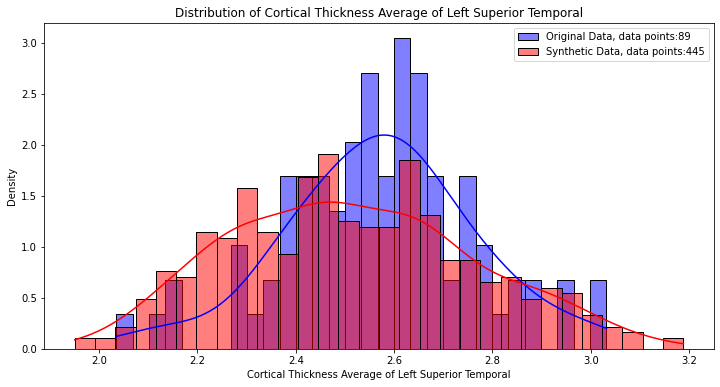

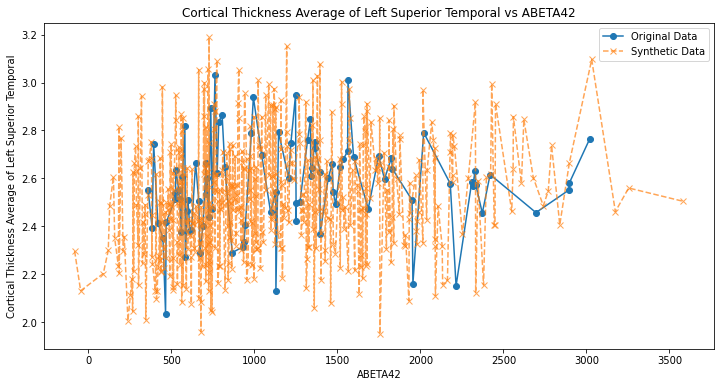

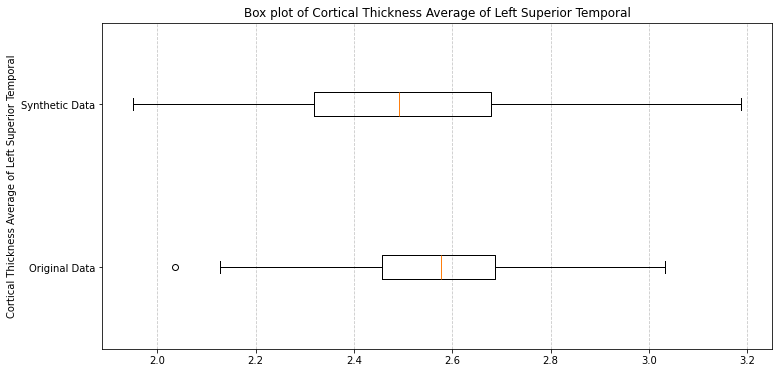

------------------------------------


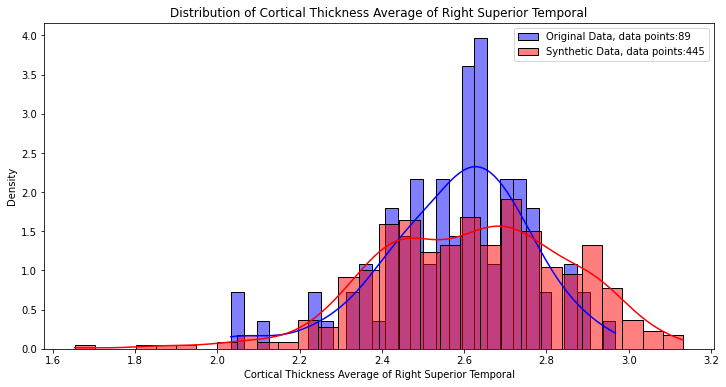

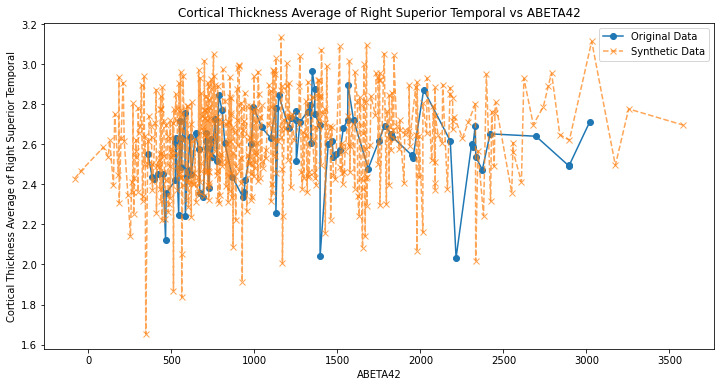

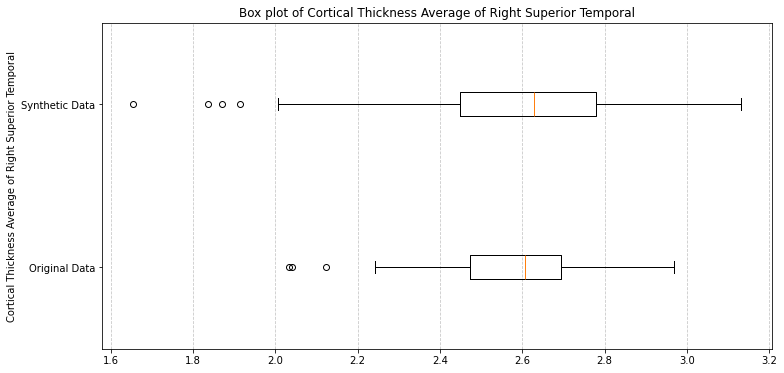

------------------------------------


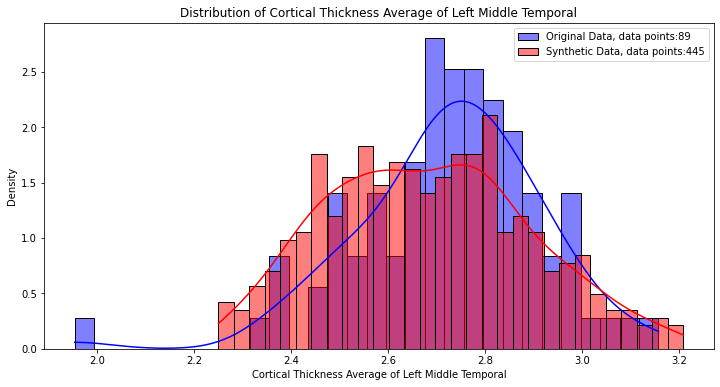

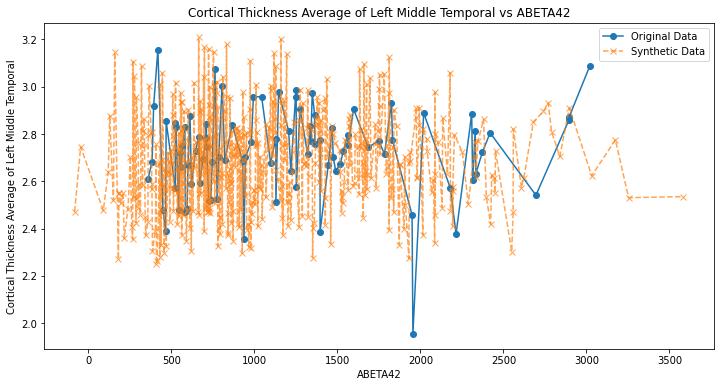

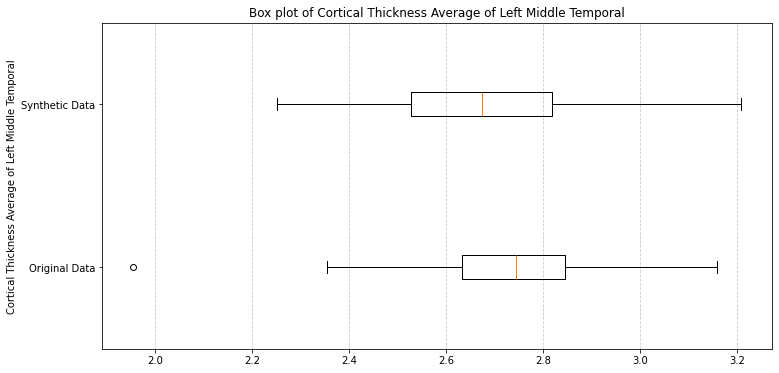

------------------------------------


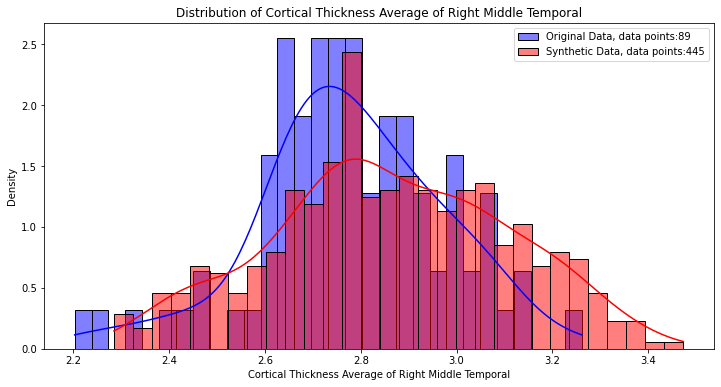

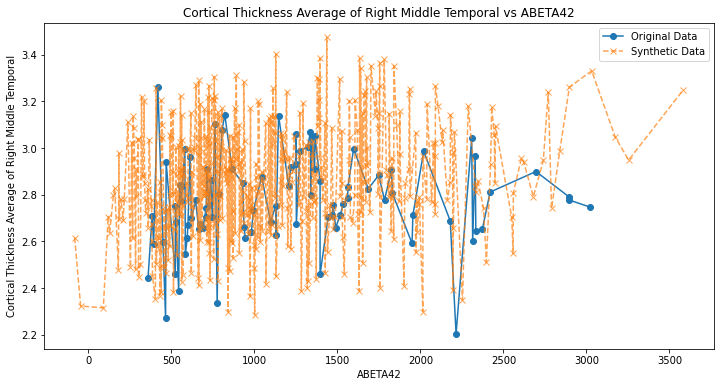

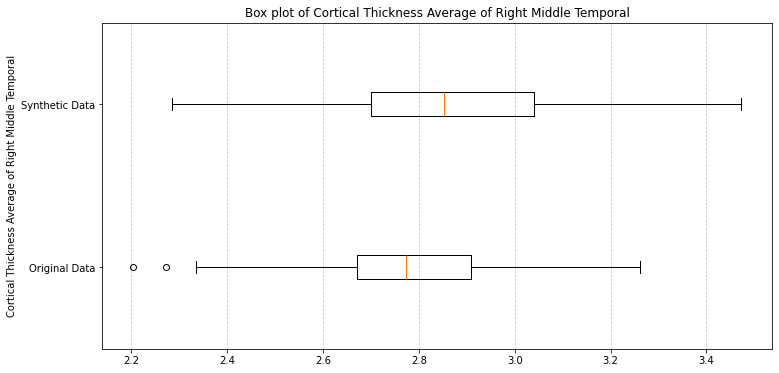

------------------------------------


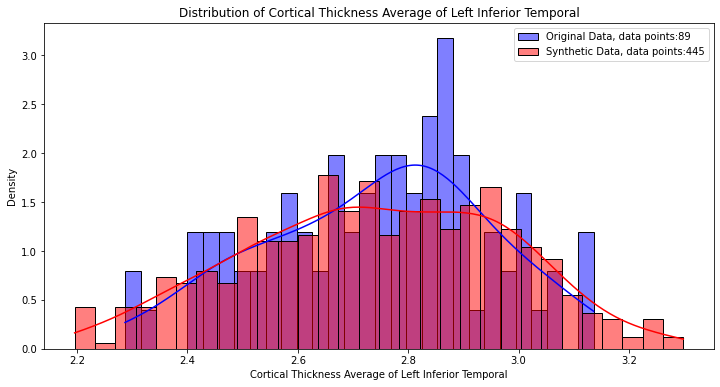

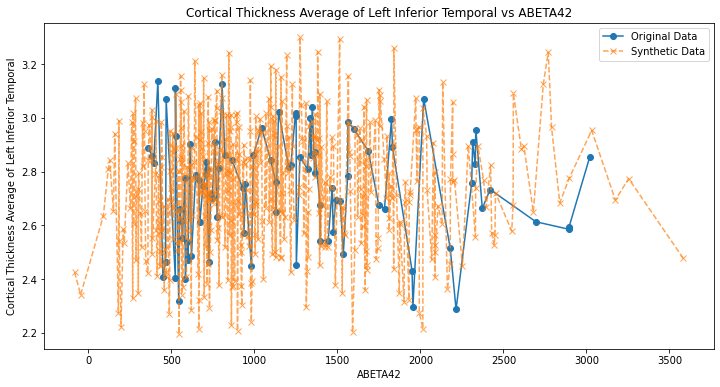

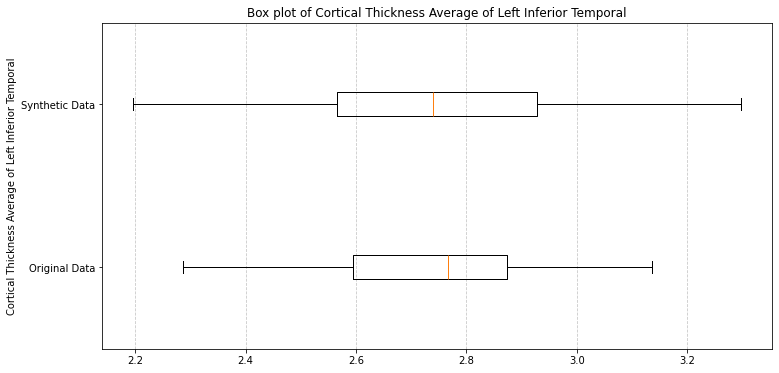

------------------------------------


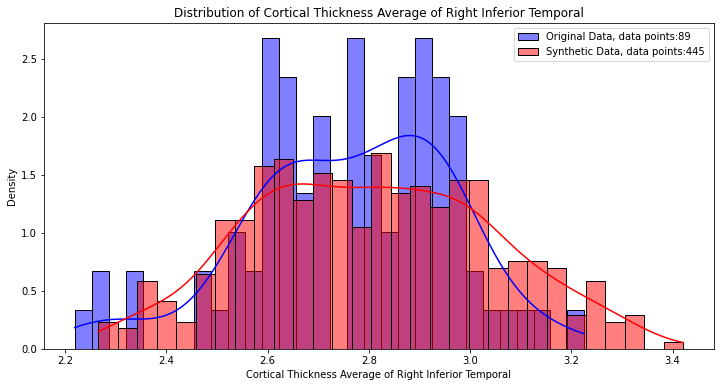

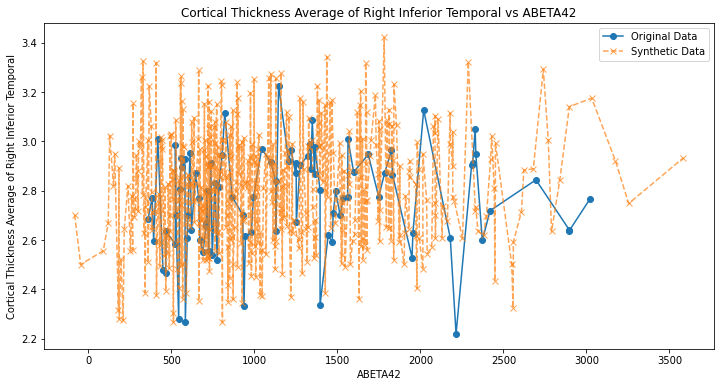

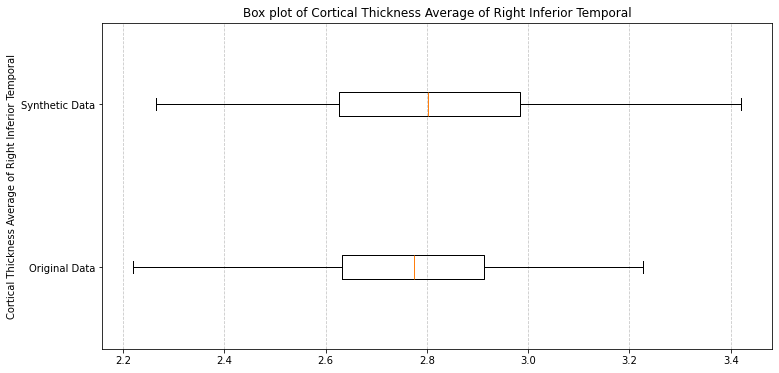

------------------------------------


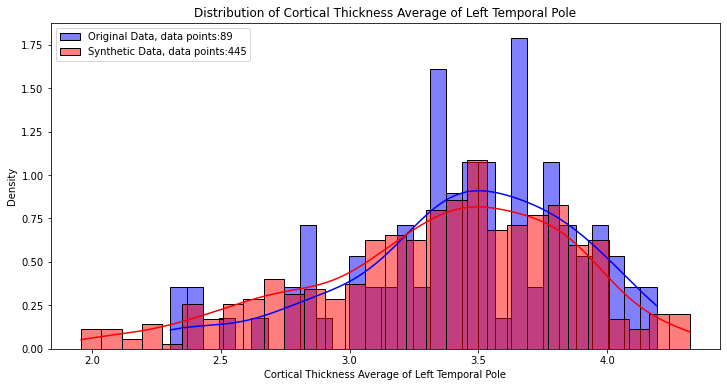

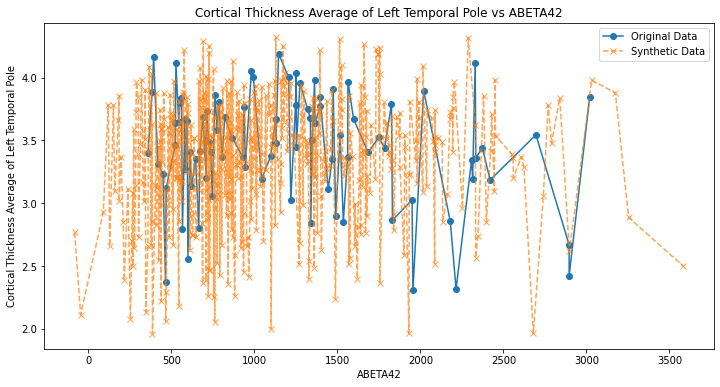

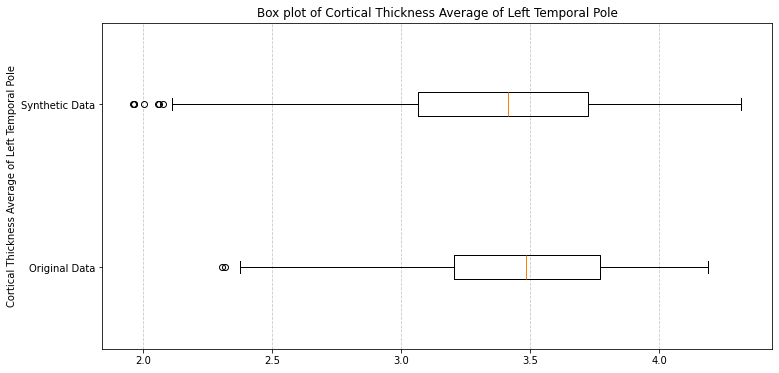

------------------------------------


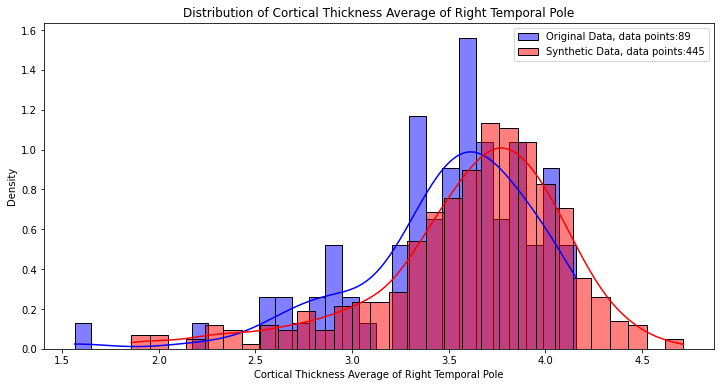

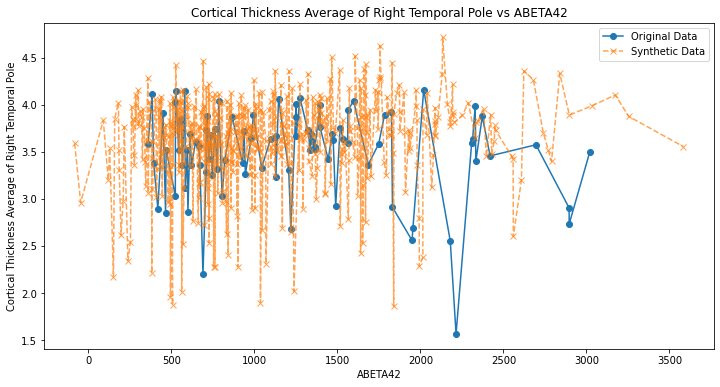

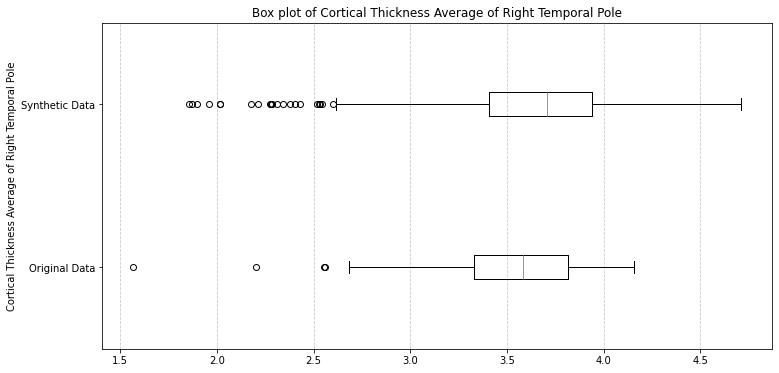

------------------------------------


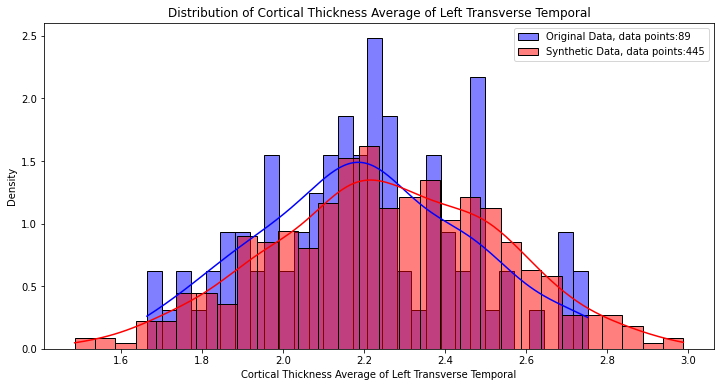

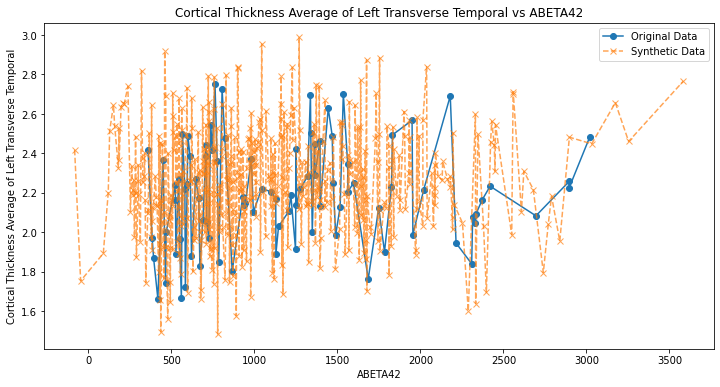

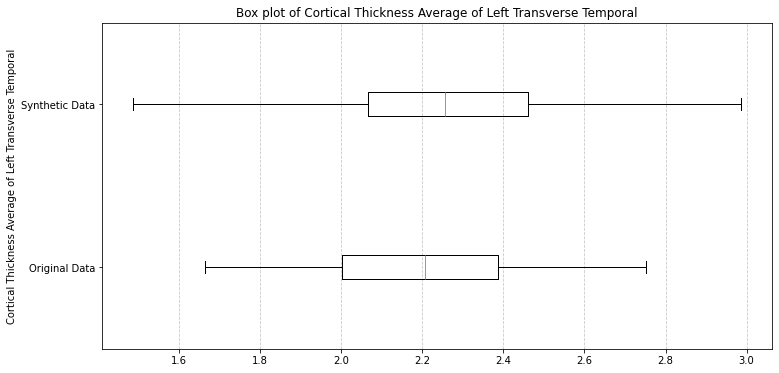

------------------------------------


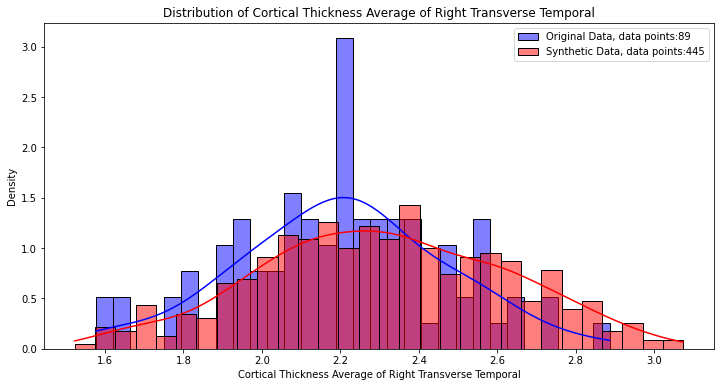

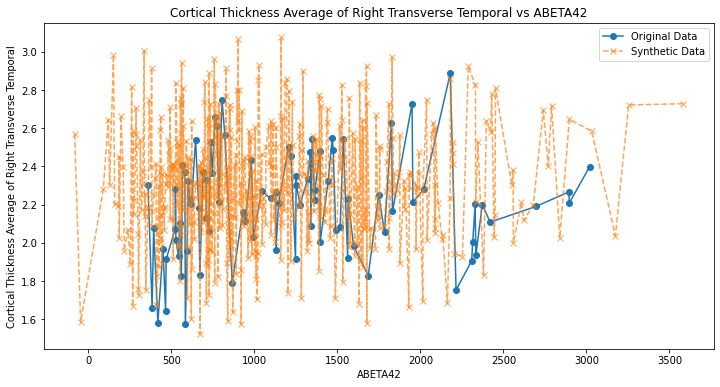

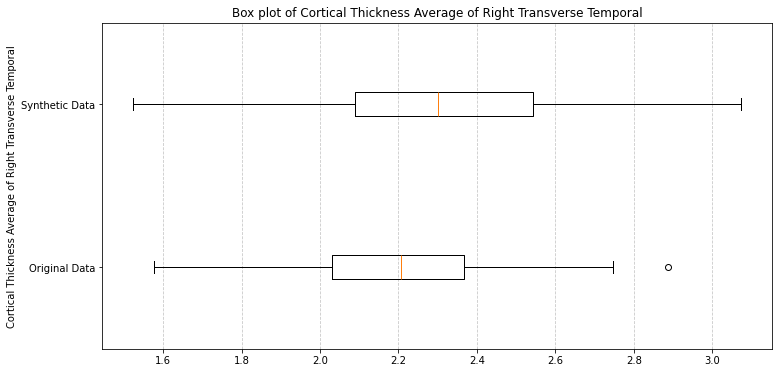

------------------------------------


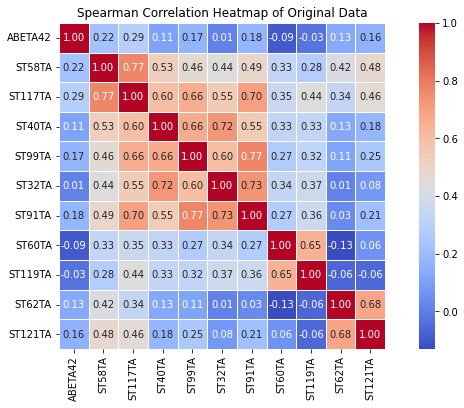

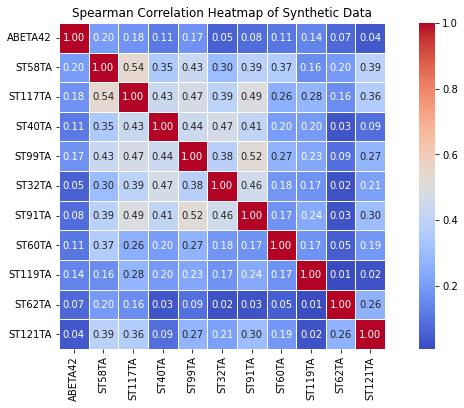

Mean absolute difference (MAD) of the correlation matrices: 0.12182763528657421
JS Divergence: 0.12098391535581139
Summary stats 0.028308602081651014
------------------------------------------------------------------------------------------------------------
Dependent variable: APVOLUME
Training with best parameters: {'batch_size': 128, 'discriminator_dim': (512, 256, 128), 'discriminator_lr': 0.0016823228615544432, 'discriminator_steps': 1, 'embedding_dim': 256, 'epochs': 2000, 'generator_dim': (512, 256, 128), 'generator_lr': 2.9335099543181216e-05, 'pac': 8}


Gen. (0.42) | Discrim. (0.75): 100%|██████████| 2000/2000 [02:20<00:00, 14.20it/s]  


Original data shape: (36, 11)
Synthetic data shape: (180, 11)


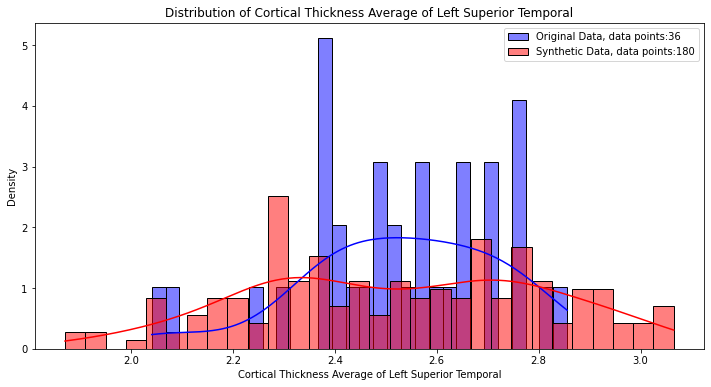

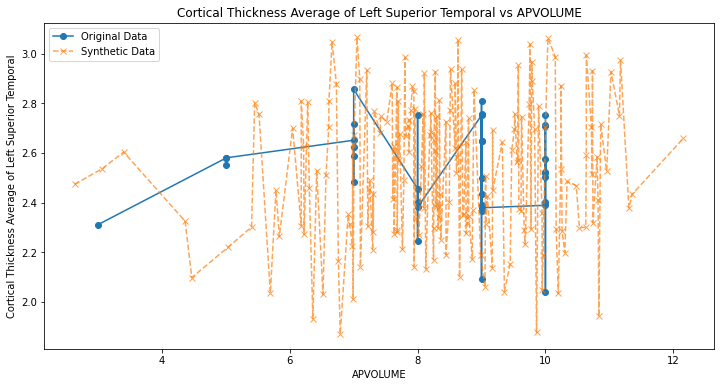

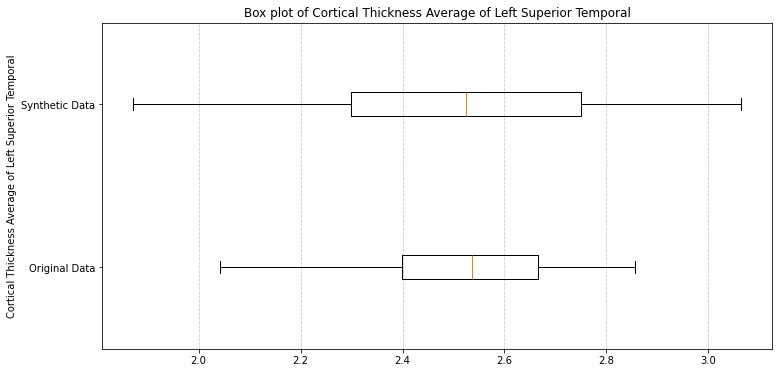

------------------------------------


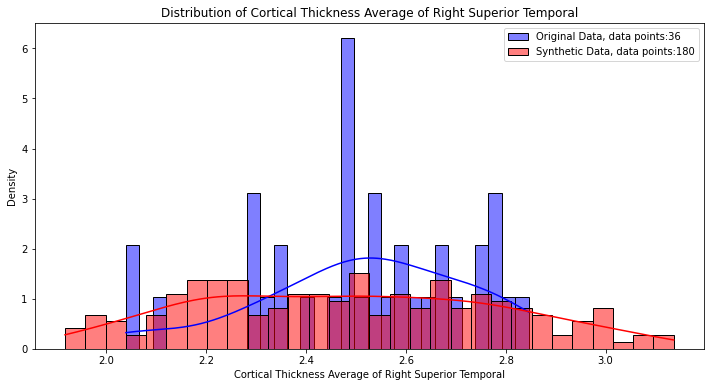

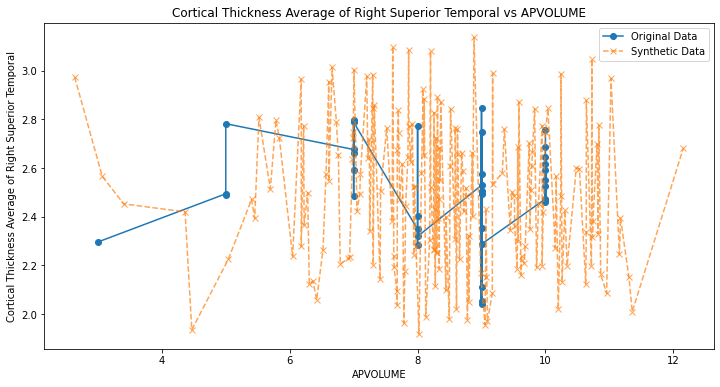

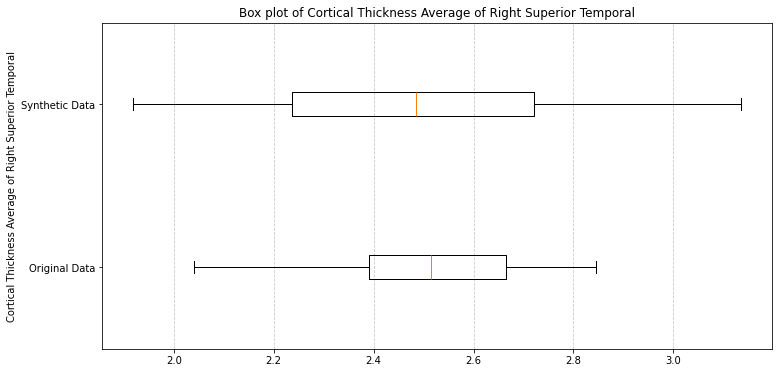

------------------------------------


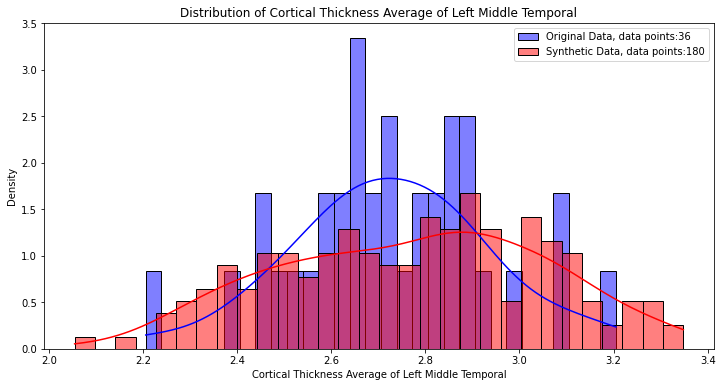

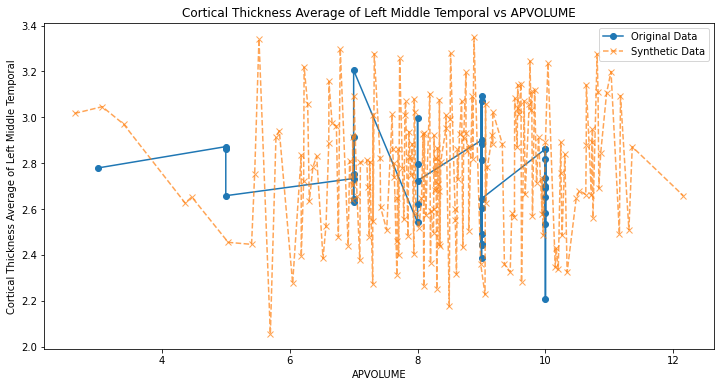

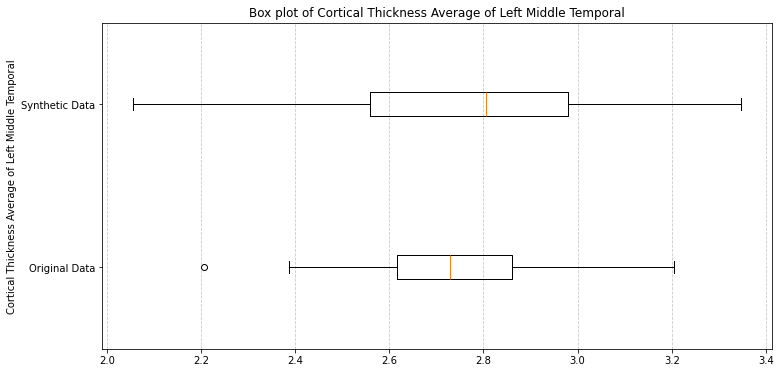

------------------------------------


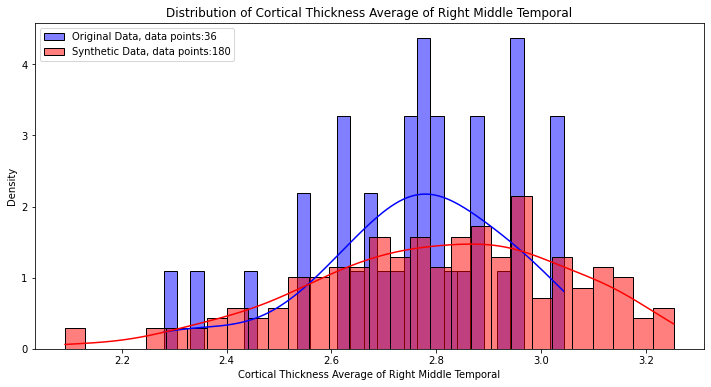

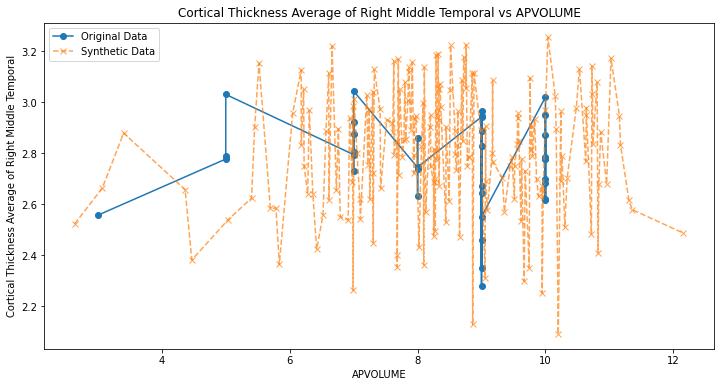

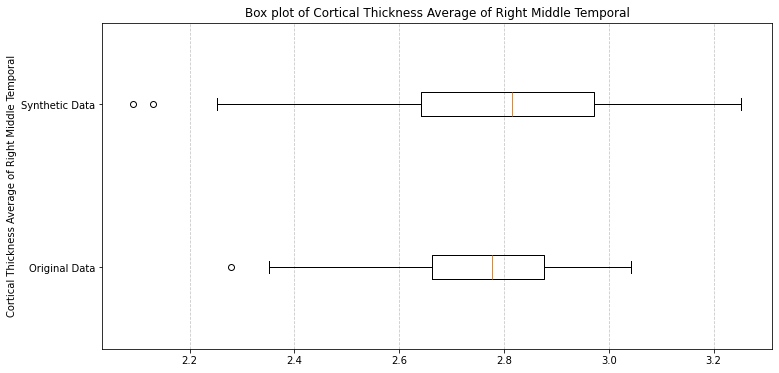

------------------------------------


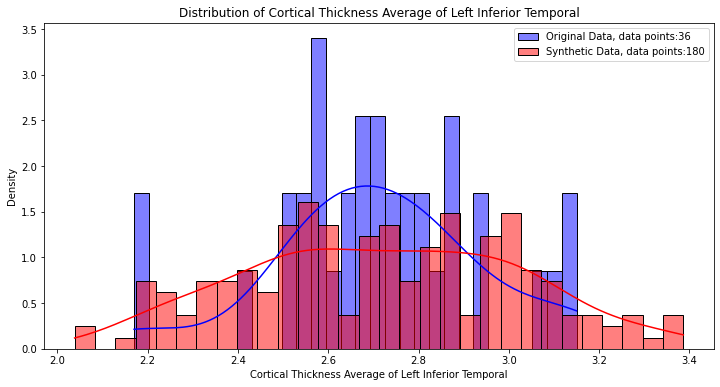

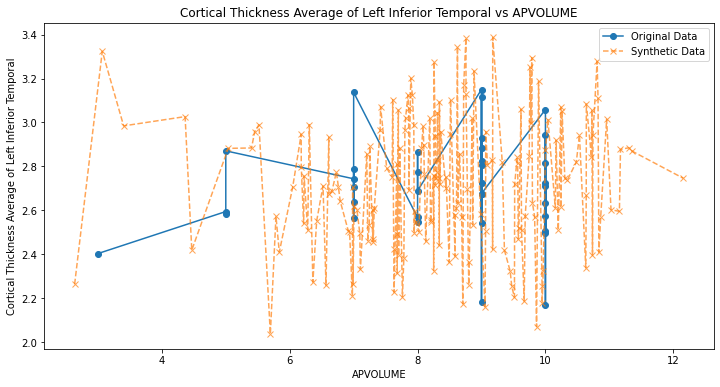

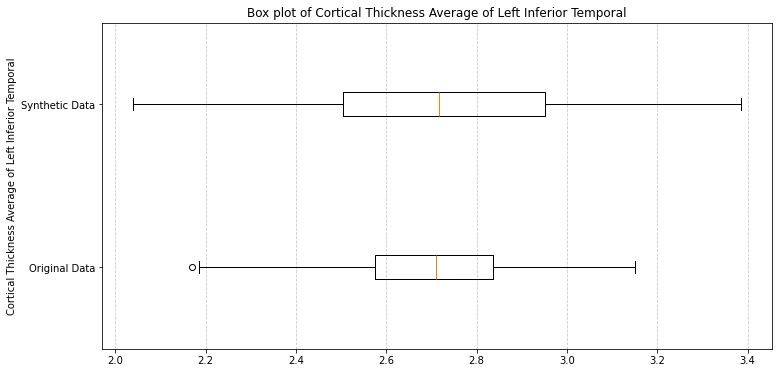

------------------------------------


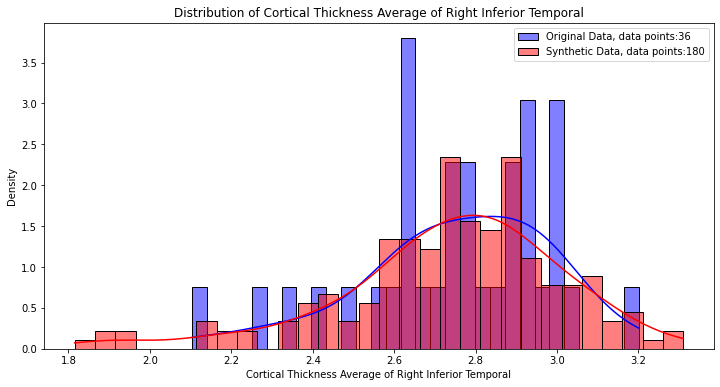

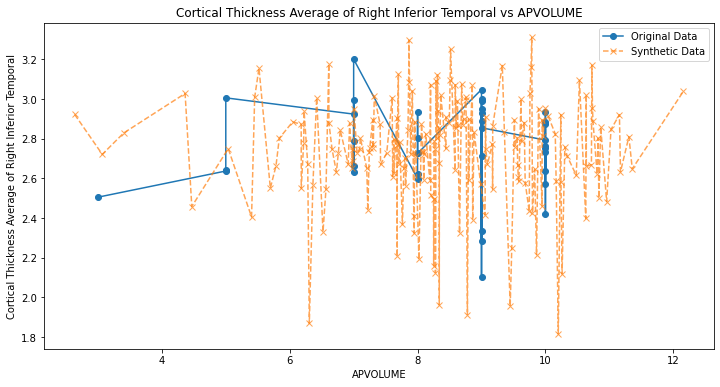

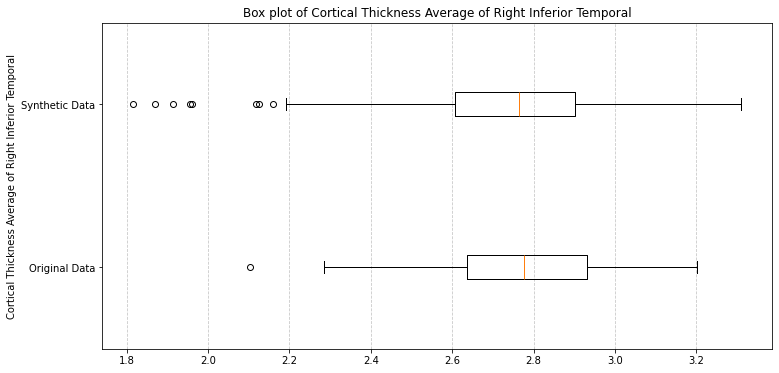

------------------------------------


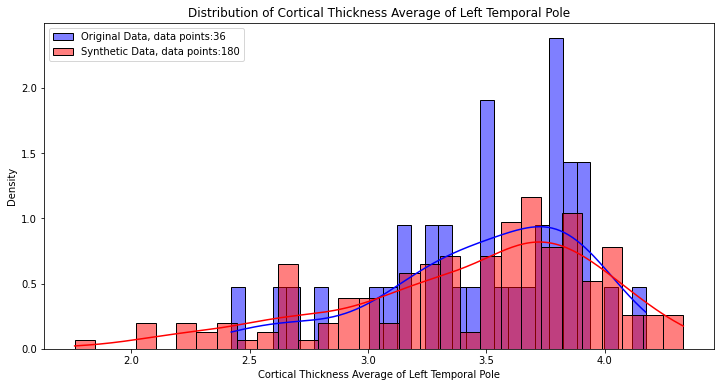

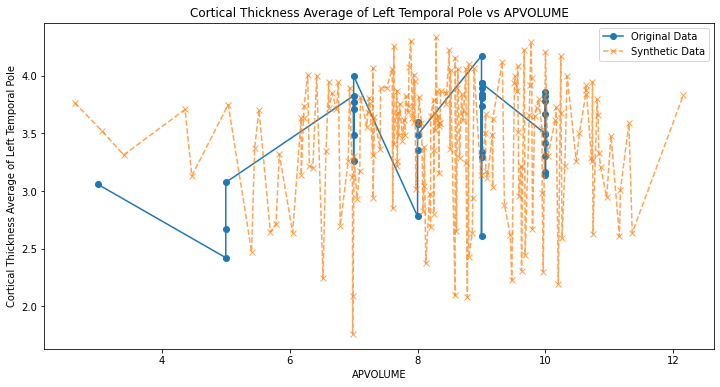

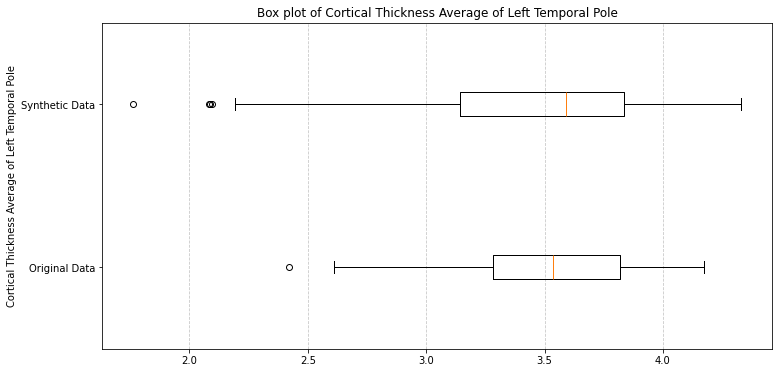

------------------------------------


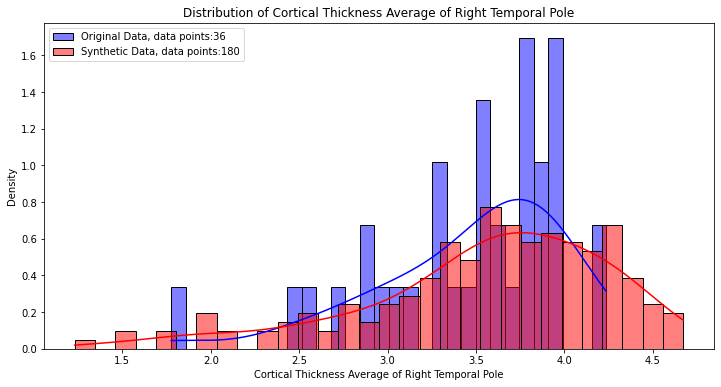

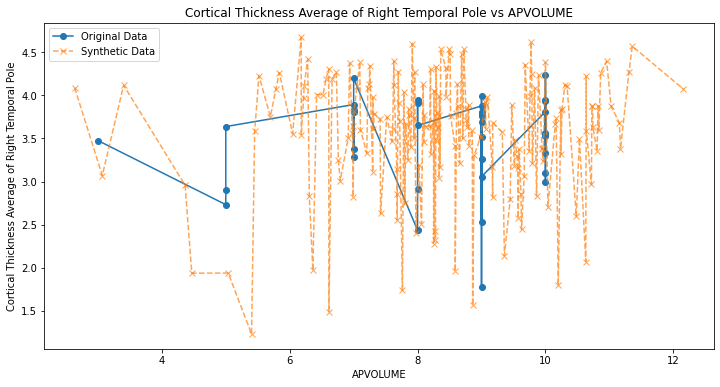

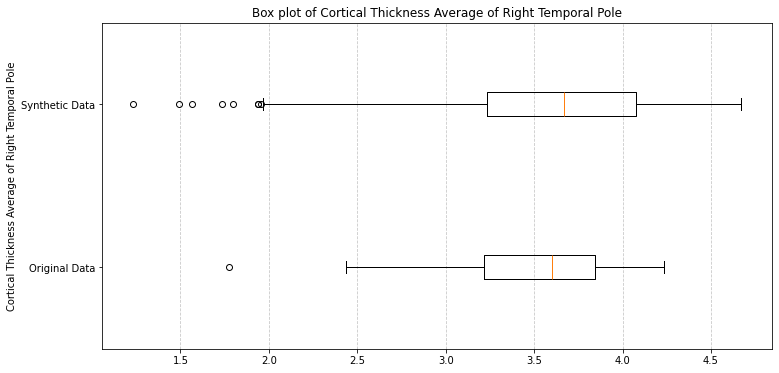

------------------------------------


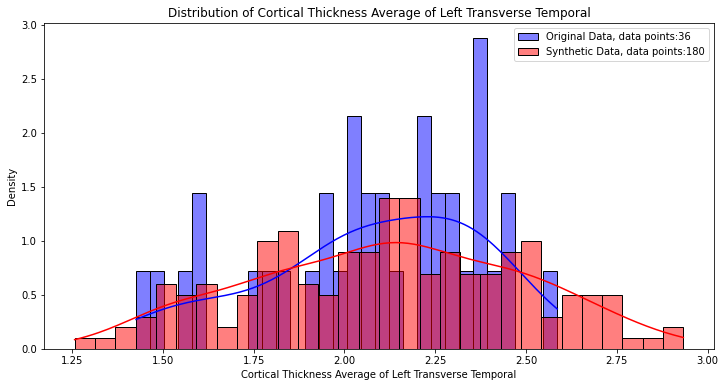

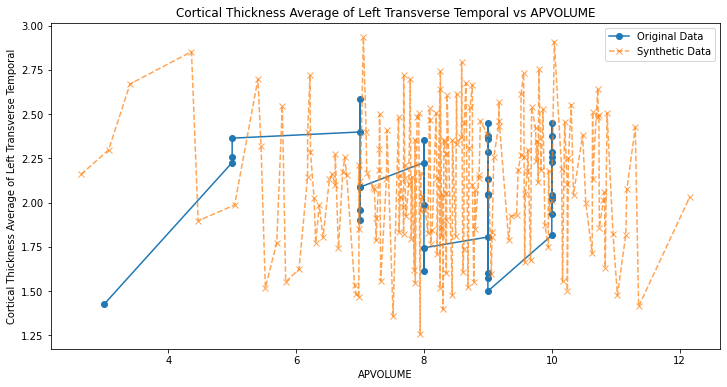

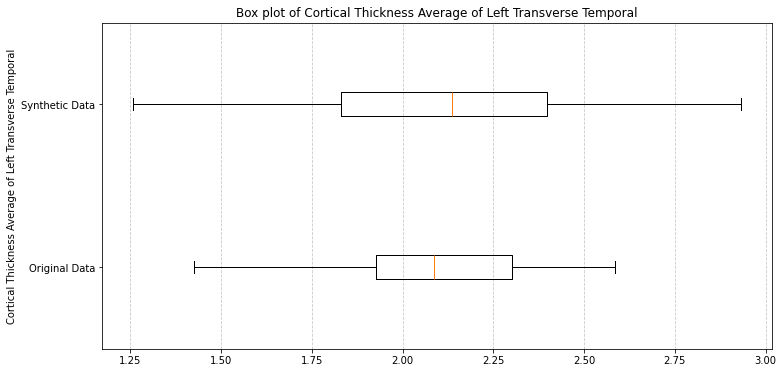

------------------------------------


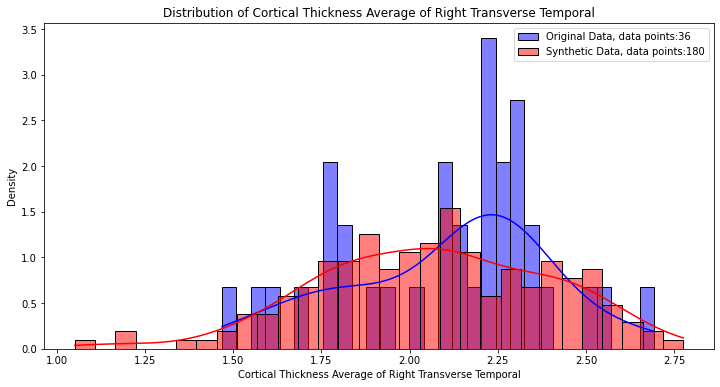

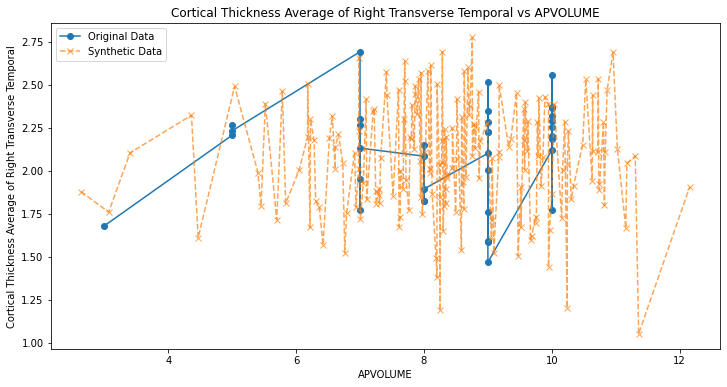

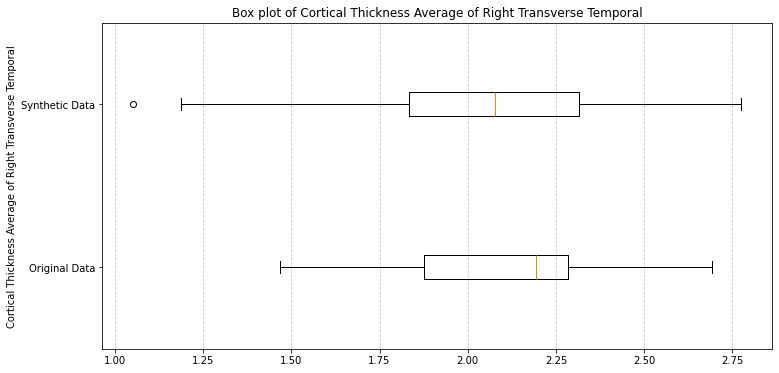

------------------------------------


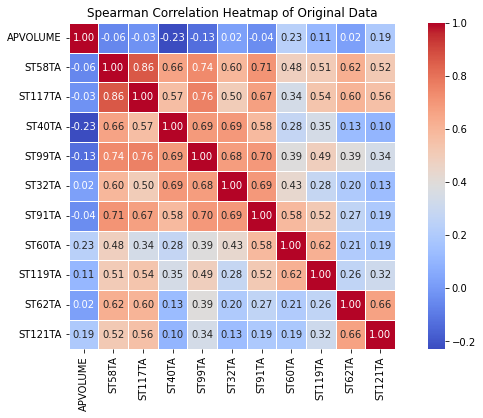

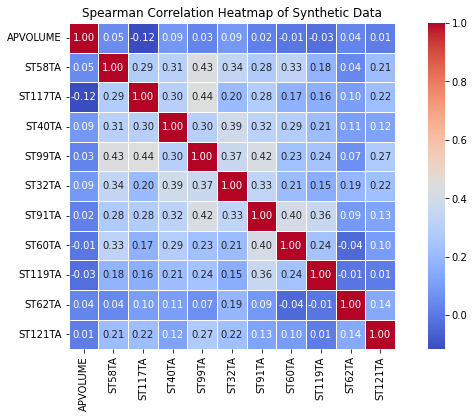

Mean absolute difference (MAD) of the correlation matrices: 0.21661869782252555
JS Divergence: 0.1362423802762616
Summary stats 0.025960810699972803
------------------------------------------------------------------------------------------------------------
Dependent variable: TAU
Training with best parameters: {'batch_size': 256, 'discriminator_dim': (512, 256, 128), 'discriminator_lr': 0.0003102367904017593, 'discriminator_steps': 3, 'embedding_dim': 128, 'epochs': 500, 'generator_dim': (256, 256, 256), 'generator_lr': 3.1954445995001434e-05, 'pac': 16}


Gen. (-2.01) | Discrim. (0.95): 100%|██████████| 500/500 [00:40<00:00, 12.35it/s] 


Original data shape: (89, 11)
Synthetic data shape: (445, 11)


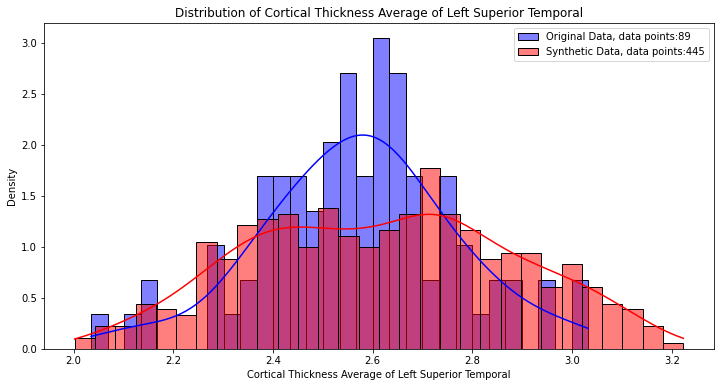

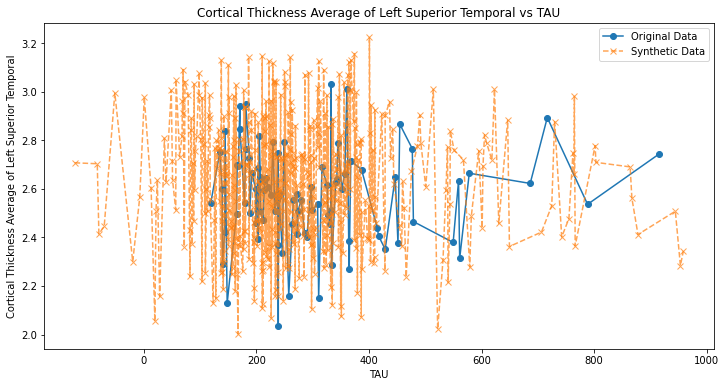

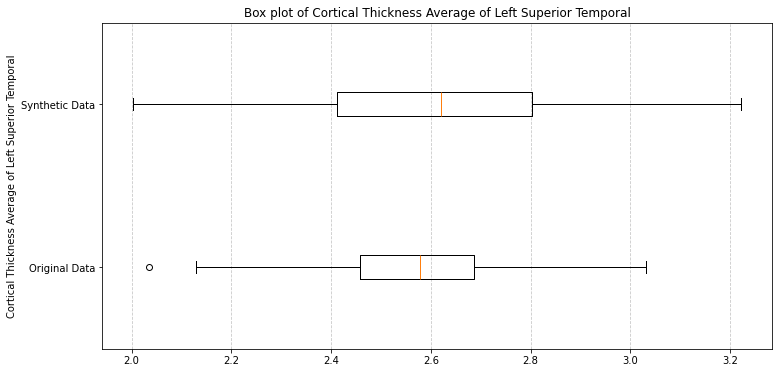

------------------------------------


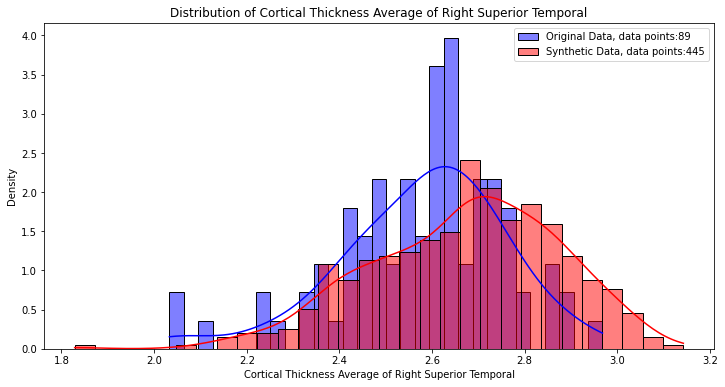

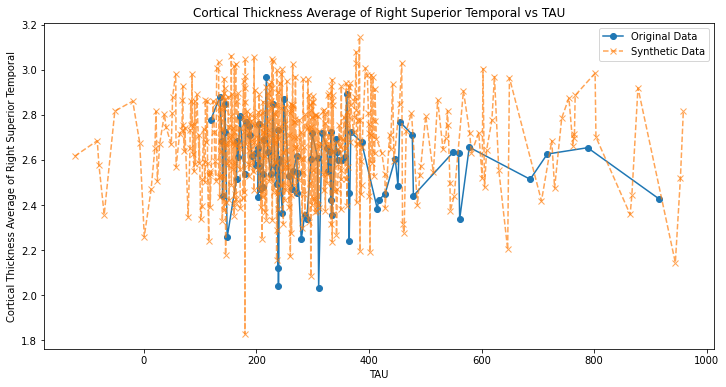

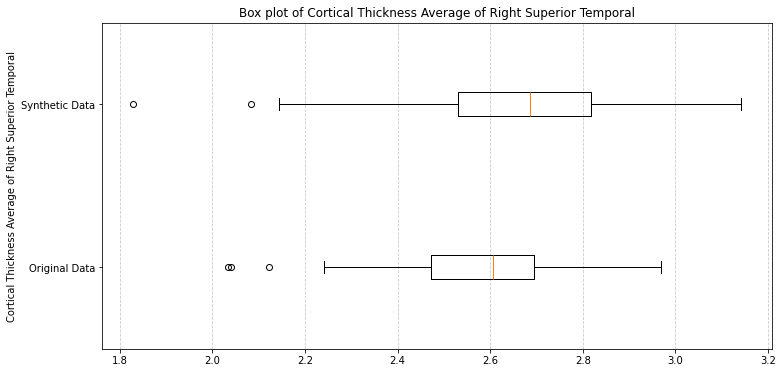

------------------------------------


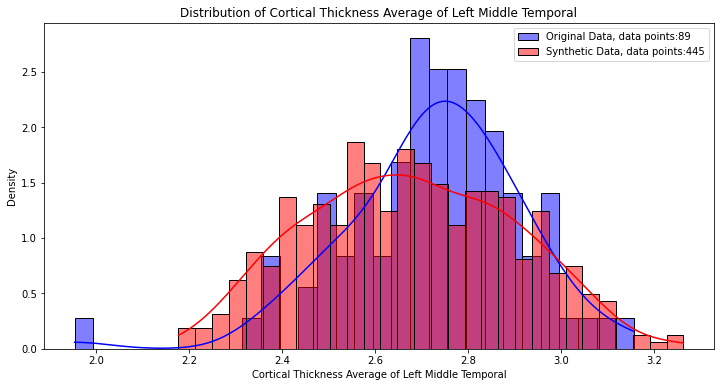

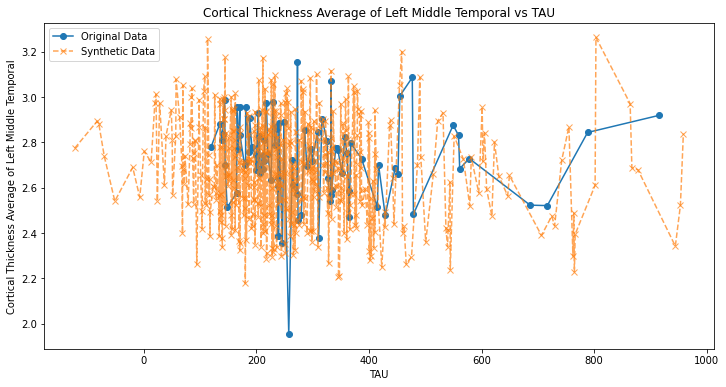

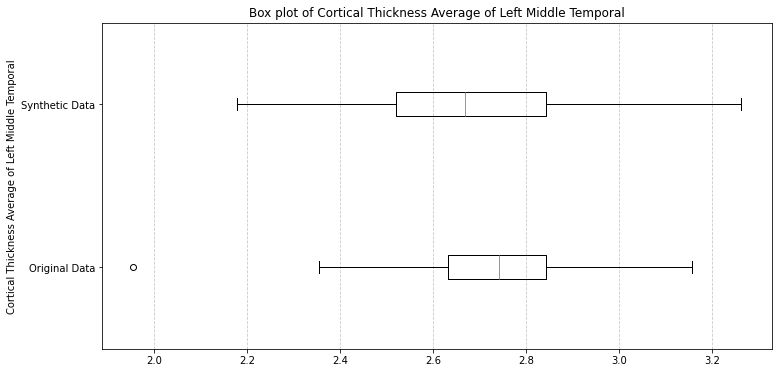

------------------------------------


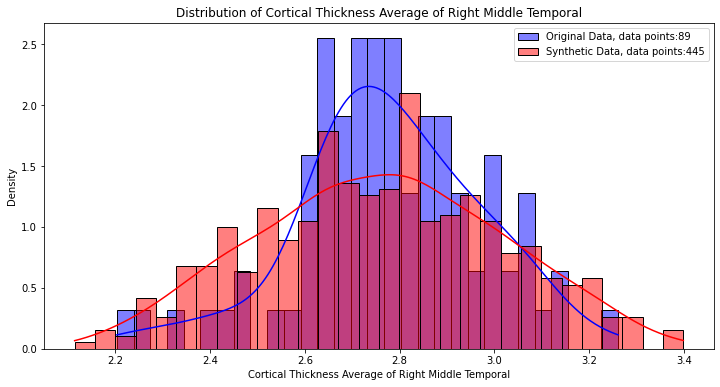

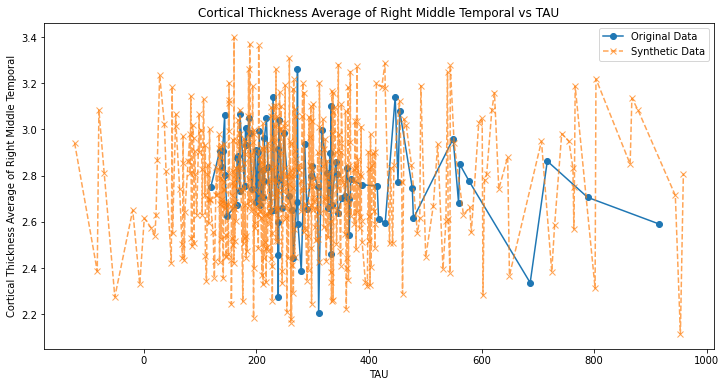

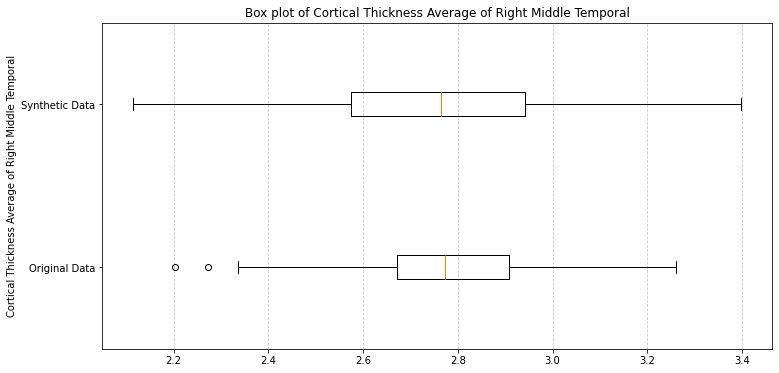

------------------------------------


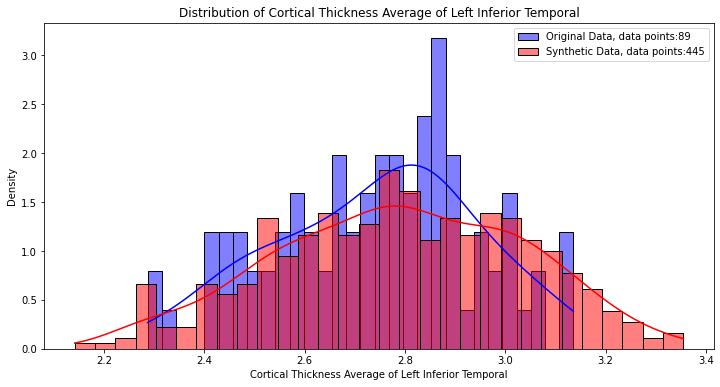

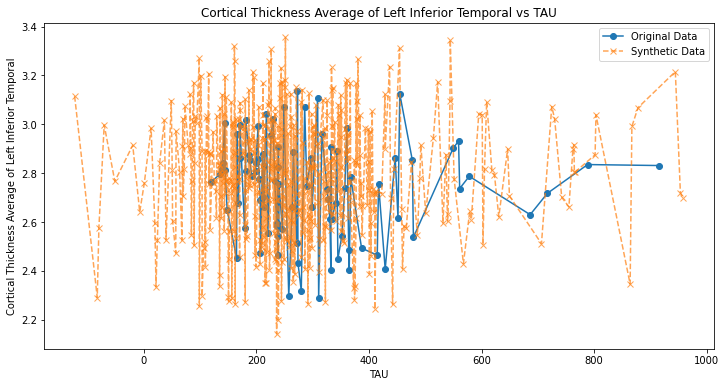

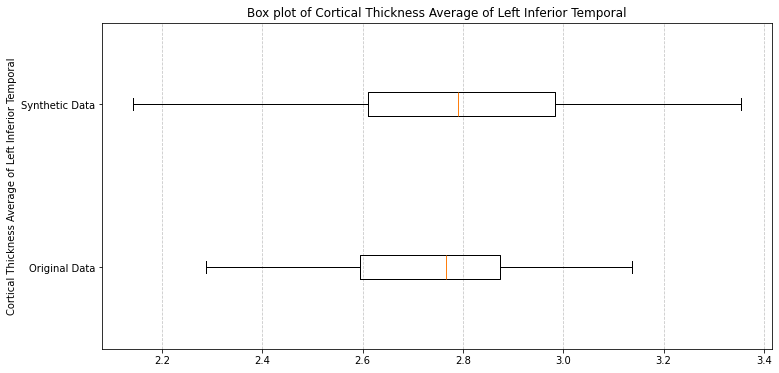

------------------------------------


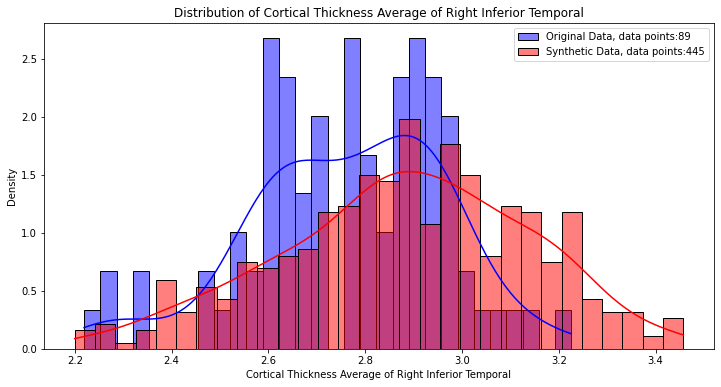

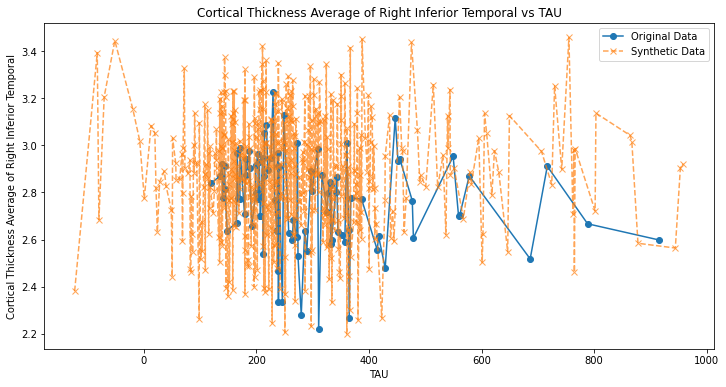

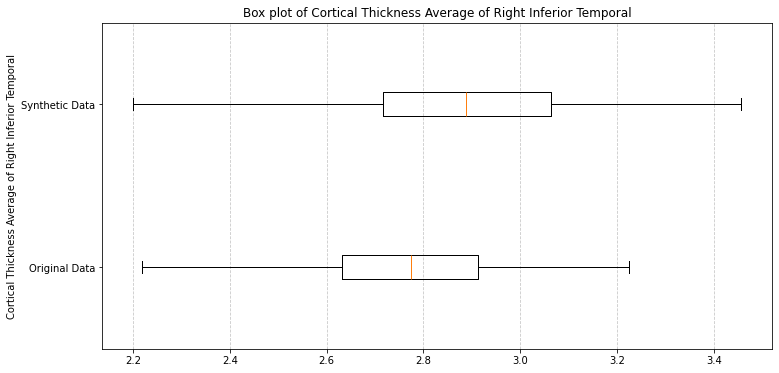

------------------------------------


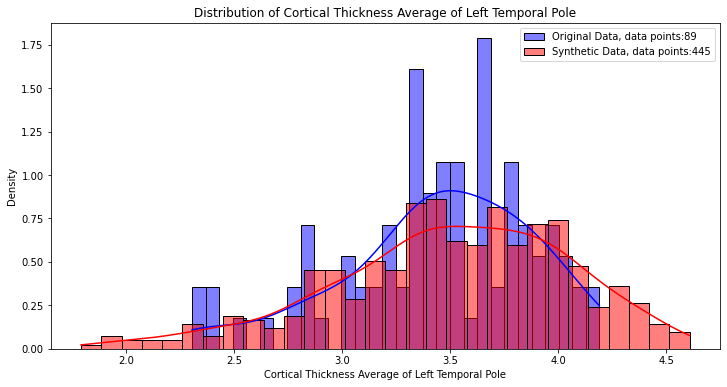

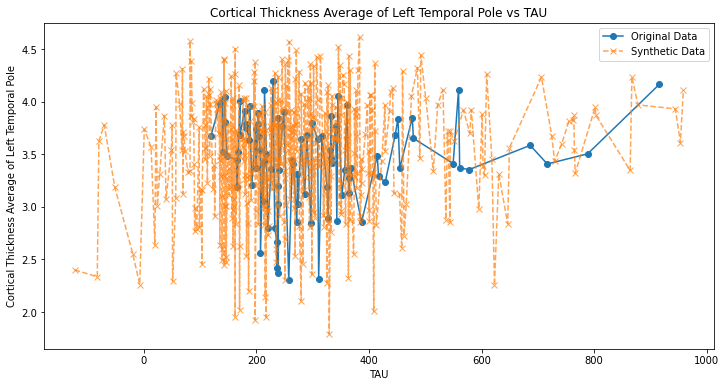

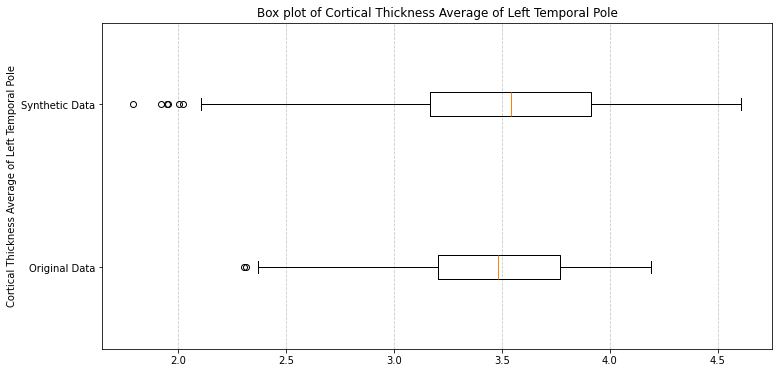

------------------------------------


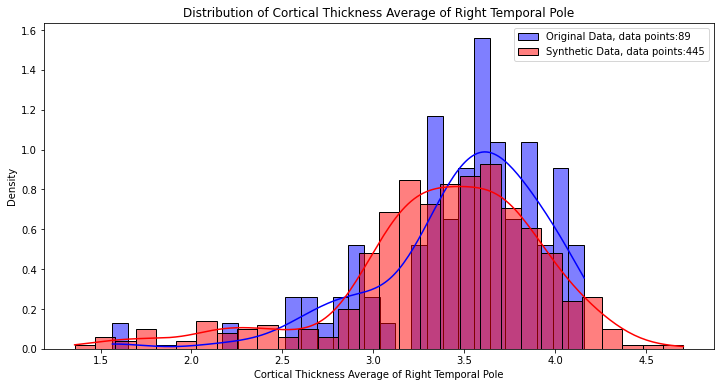

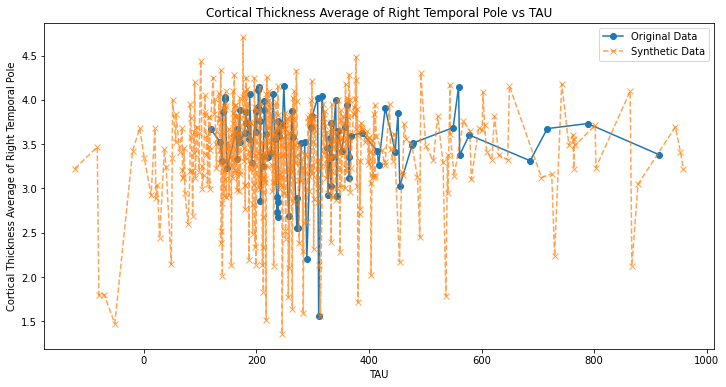

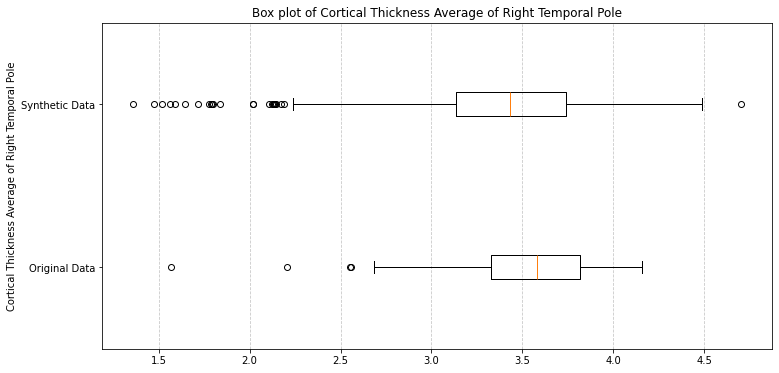

------------------------------------


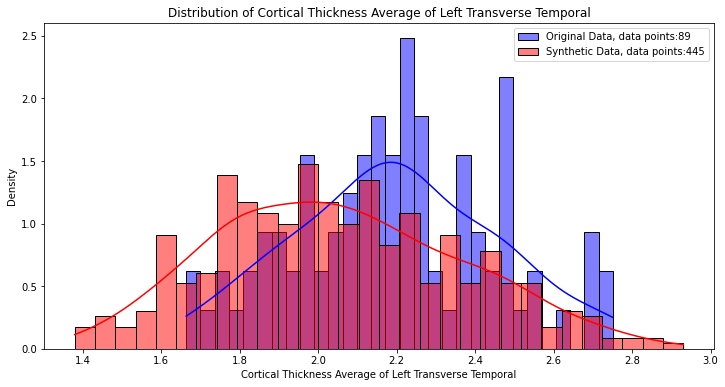

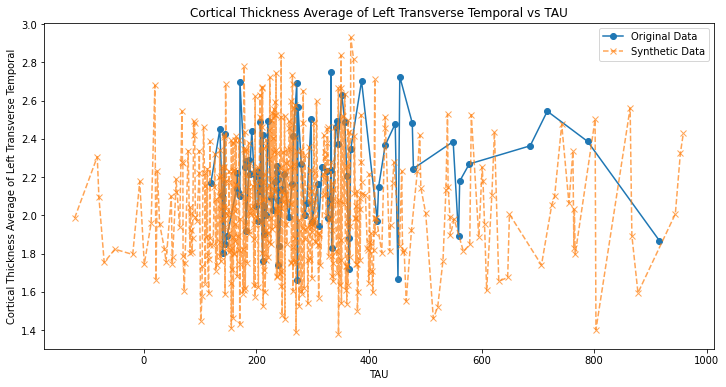

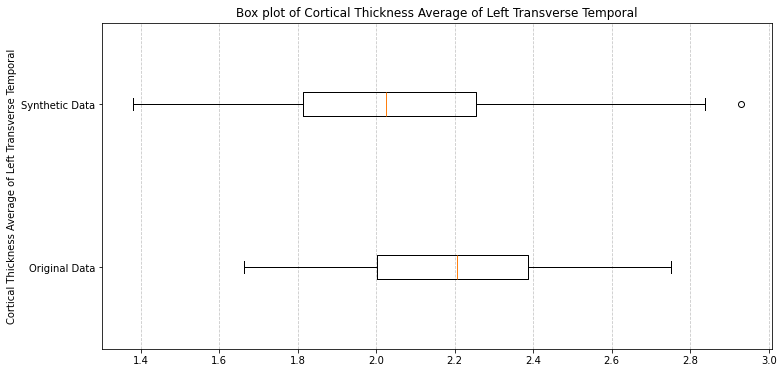

------------------------------------


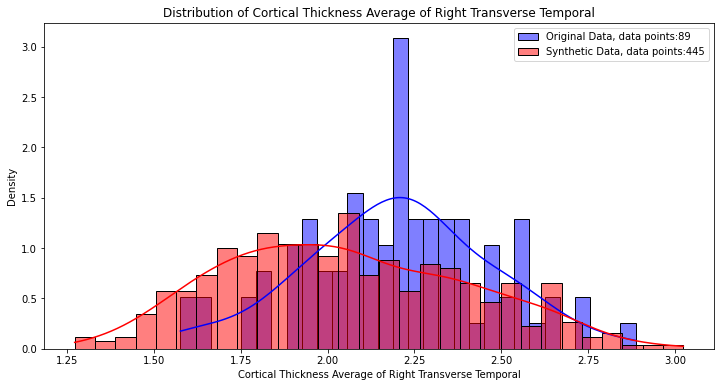

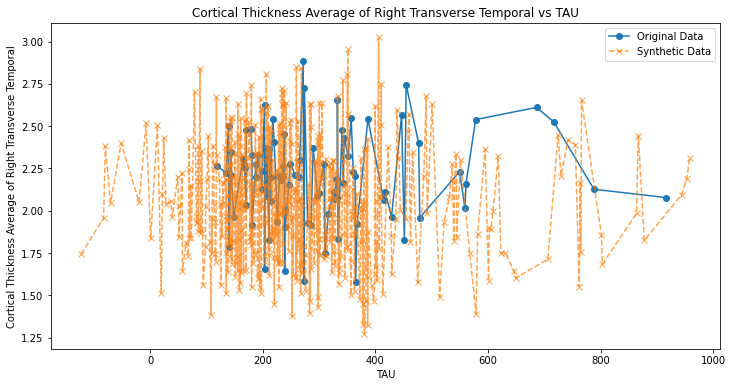

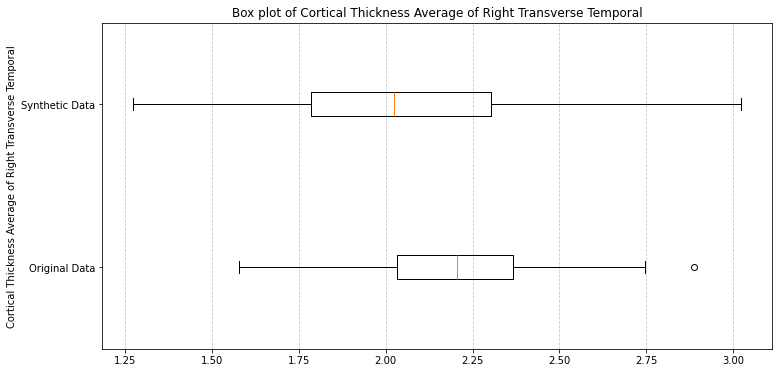

------------------------------------


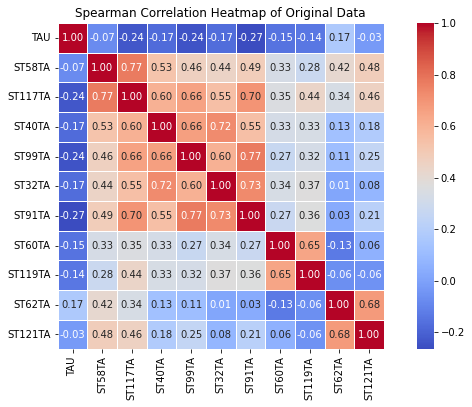

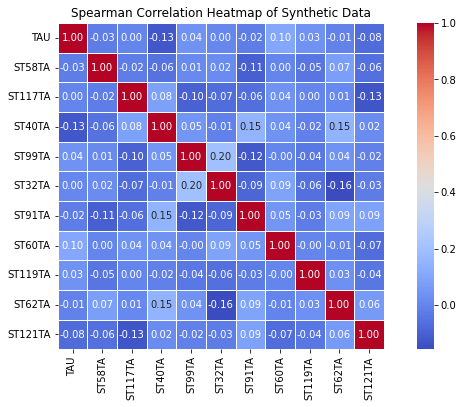

Mean absolute difference (MAD) of the correlation matrices: 0.3214835211593549
JS Divergence: 0.1640902912162002
Summary stats 0.0414812723388184
------------------------------------------------------------------------------------------------------------
Dependent variable: PTAU
Training with best parameters: {'batch_size': 32, 'discriminator_dim': (512, 256), 'discriminator_lr': 0.0023172345860010737, 'discriminator_steps': 5, 'embedding_dim': 256, 'epochs': 2000, 'generator_dim': (512, 256), 'generator_lr': 1.052405523708223e-05, 'pac': 4}


Gen. (-0.07) | Discrim. (-0.74): 100%|██████████| 2000/2000 [02:56<00:00, 11.31it/s]


Original data shape: (89, 11)
Synthetic data shape: (445, 11)


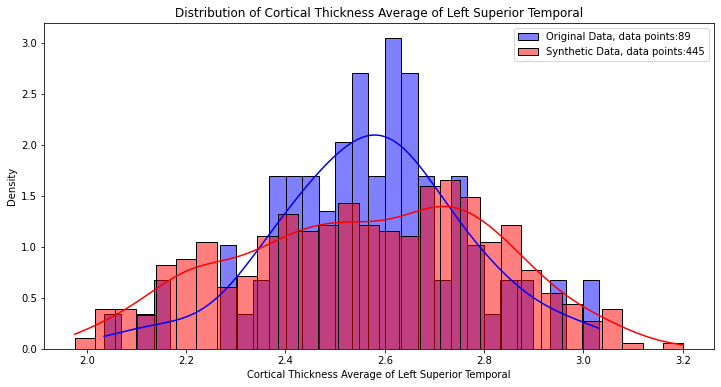

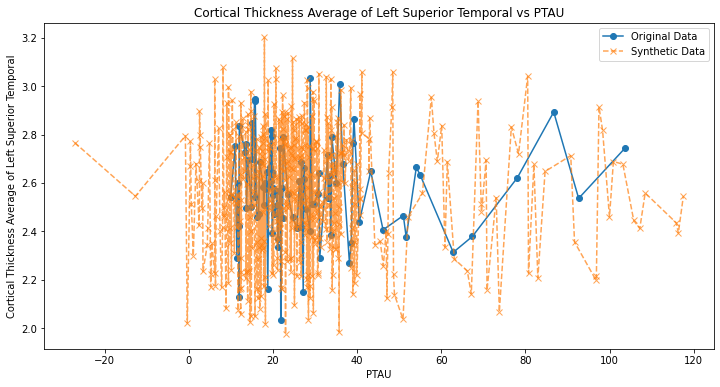

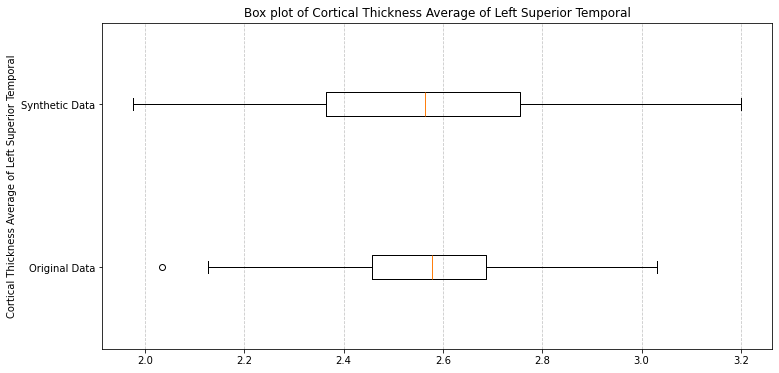

------------------------------------


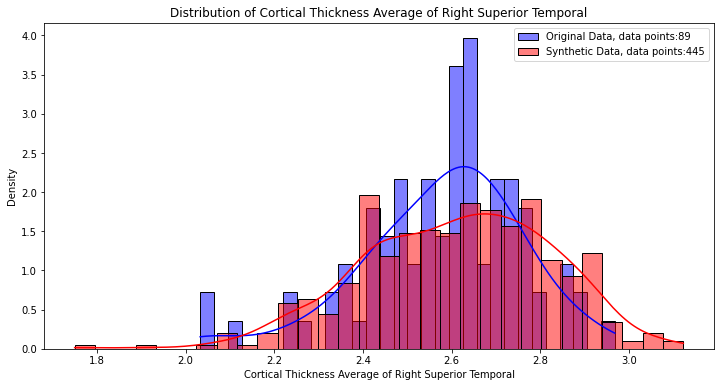

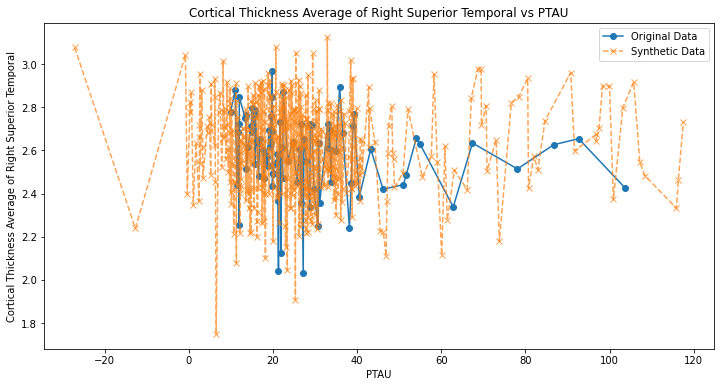

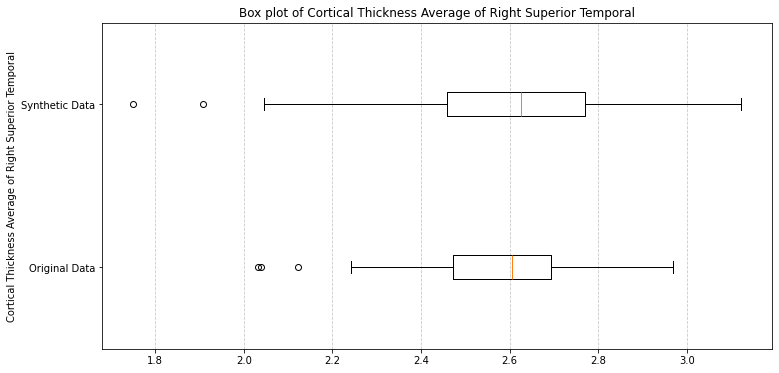

------------------------------------


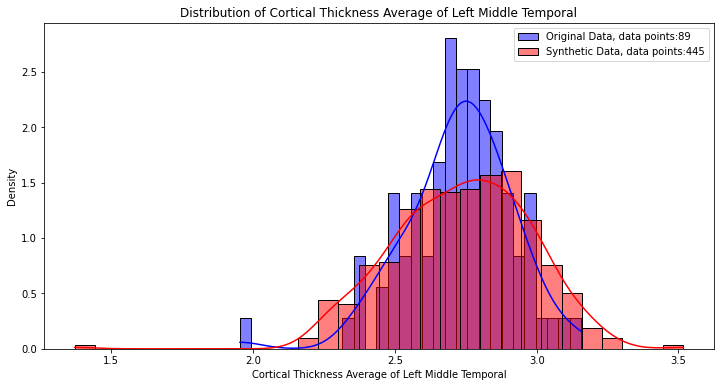

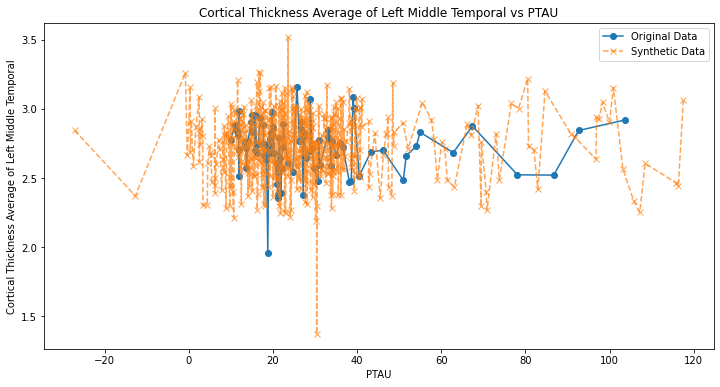

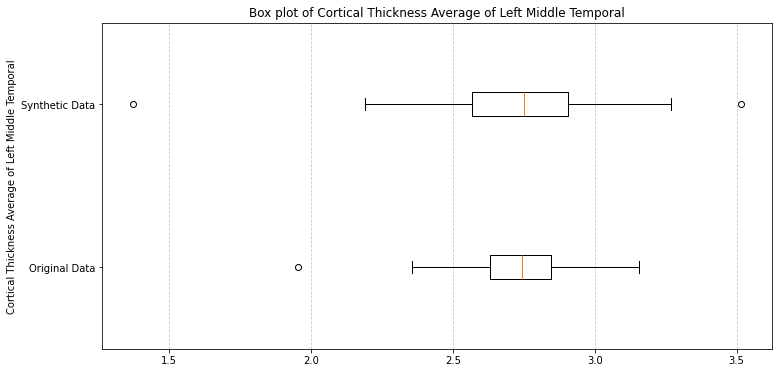

------------------------------------


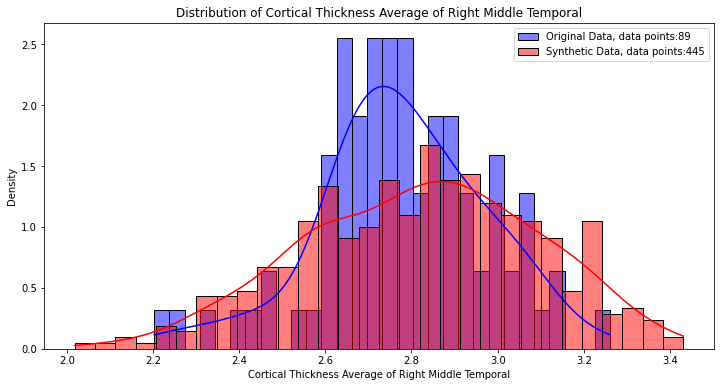

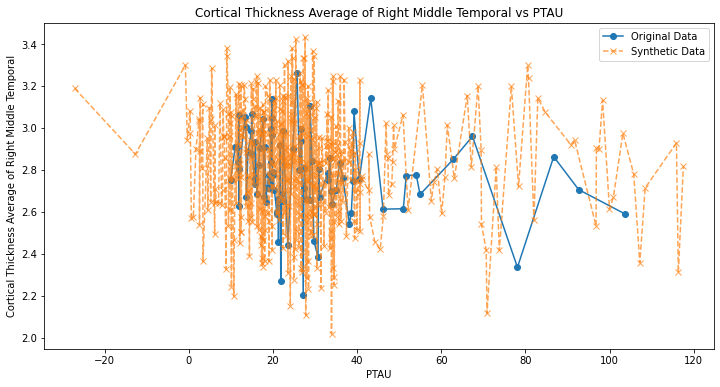

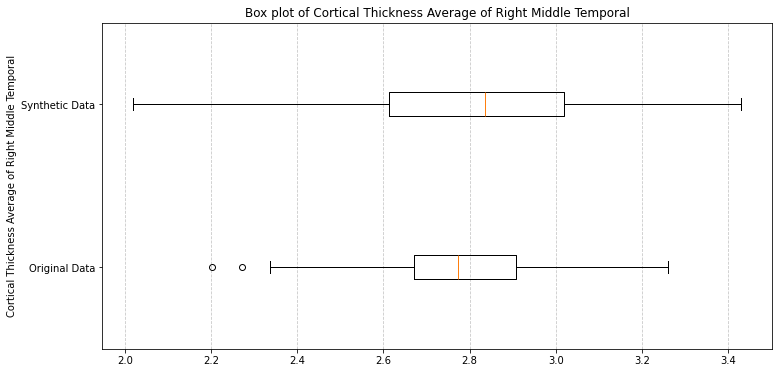

------------------------------------


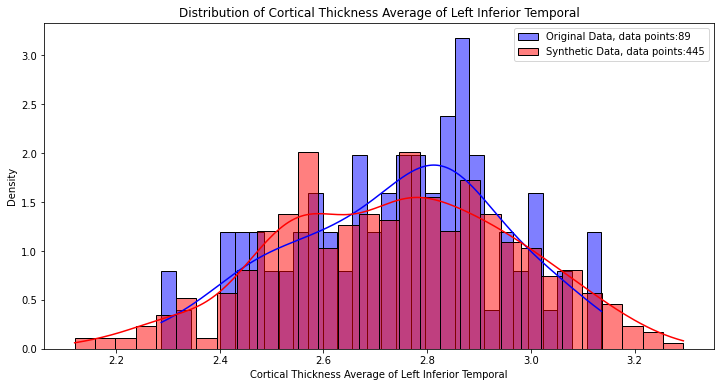

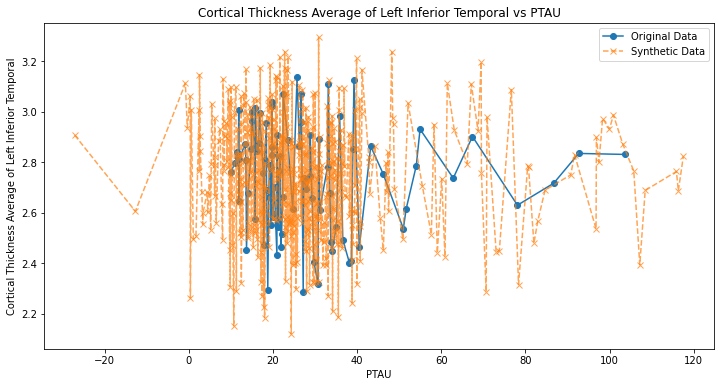

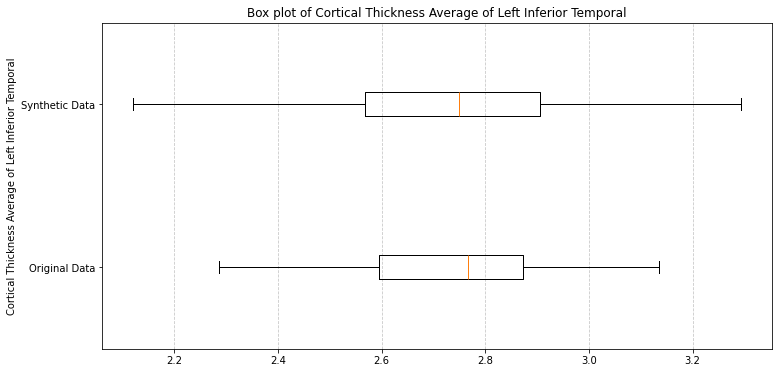

------------------------------------


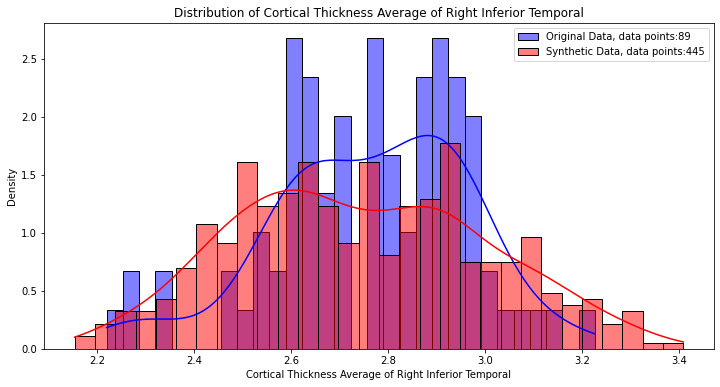

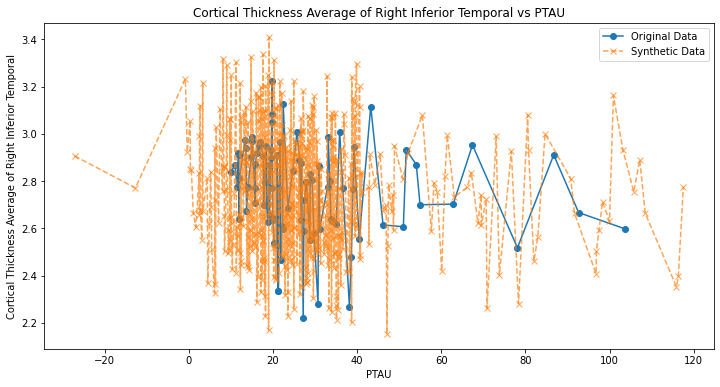

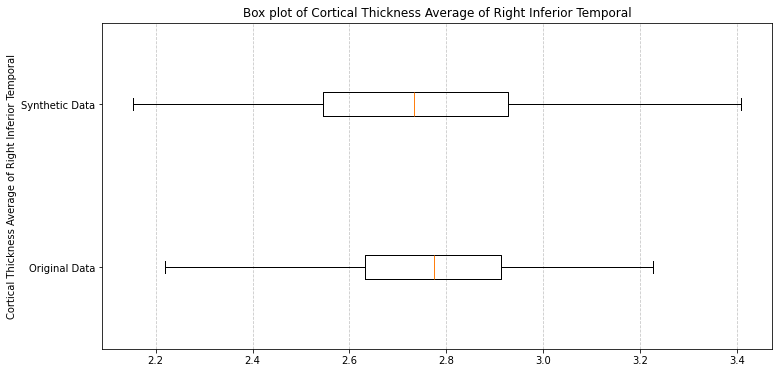

------------------------------------


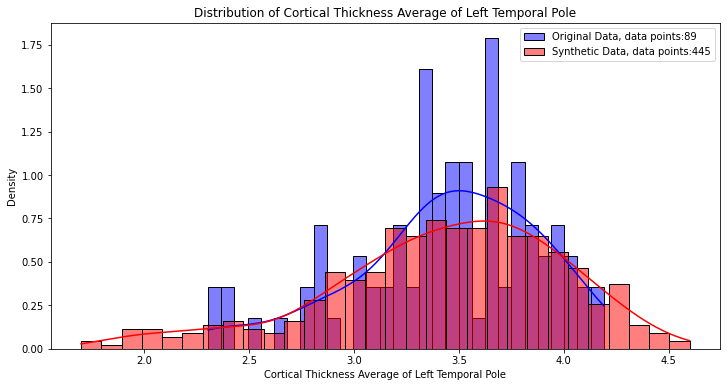

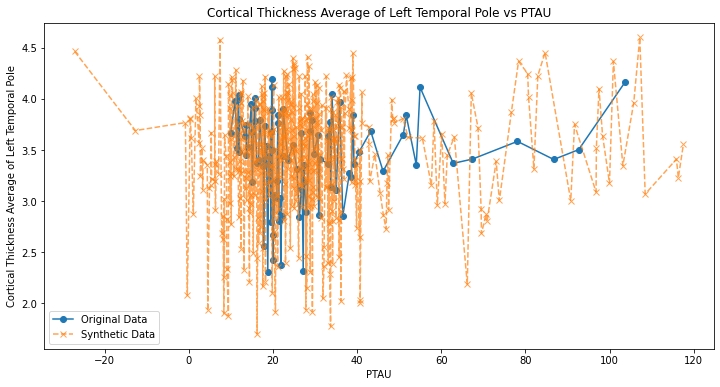

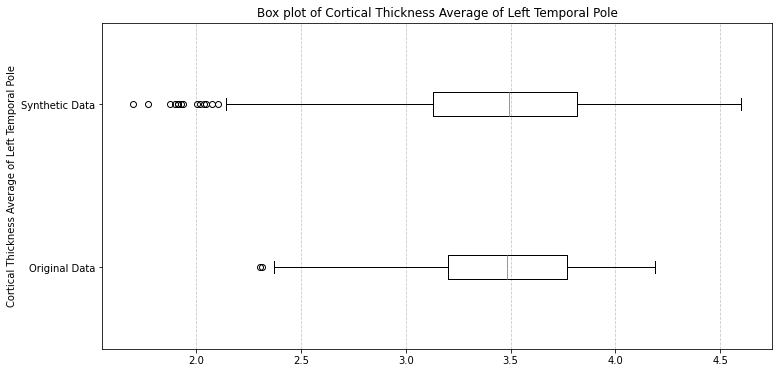

------------------------------------


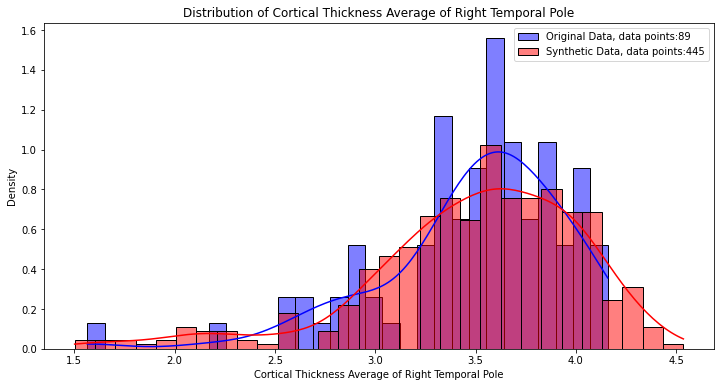

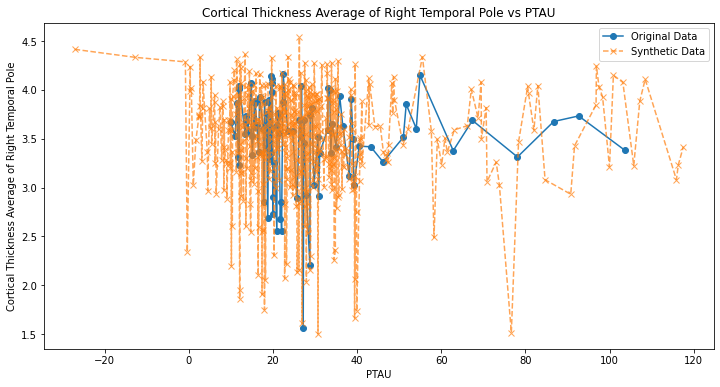

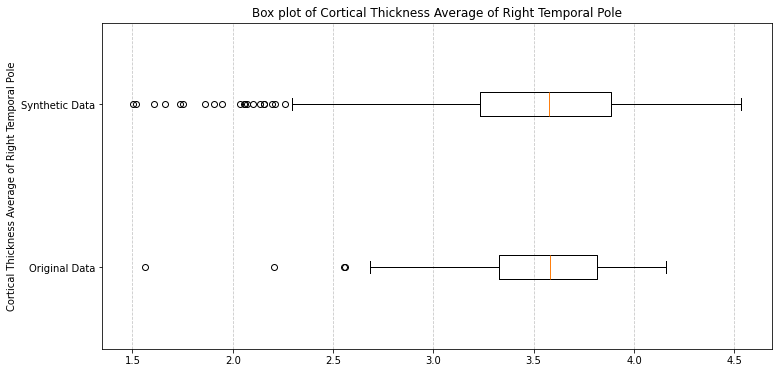

------------------------------------


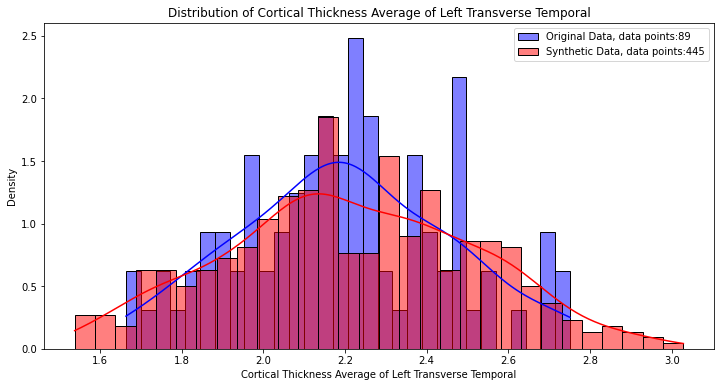

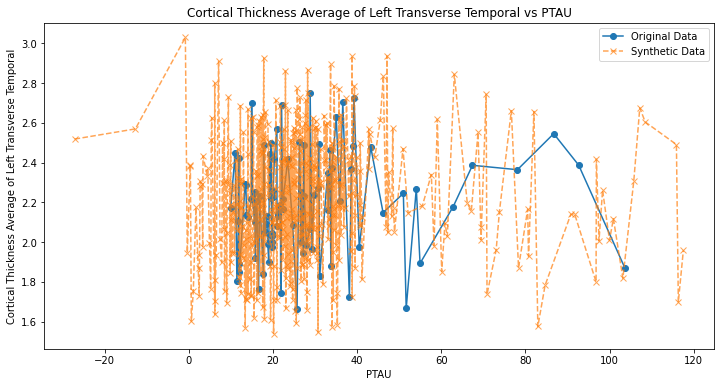

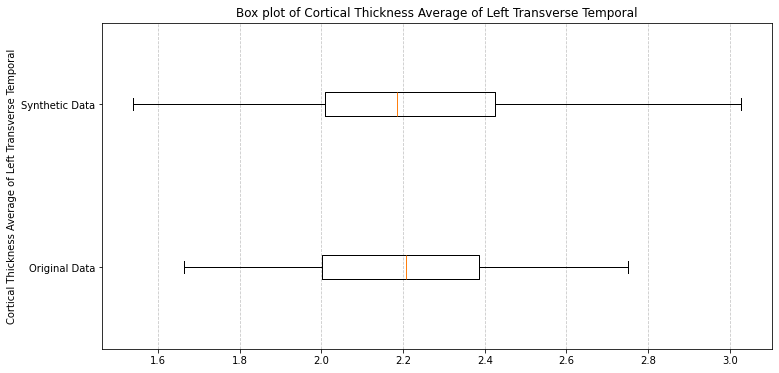

------------------------------------


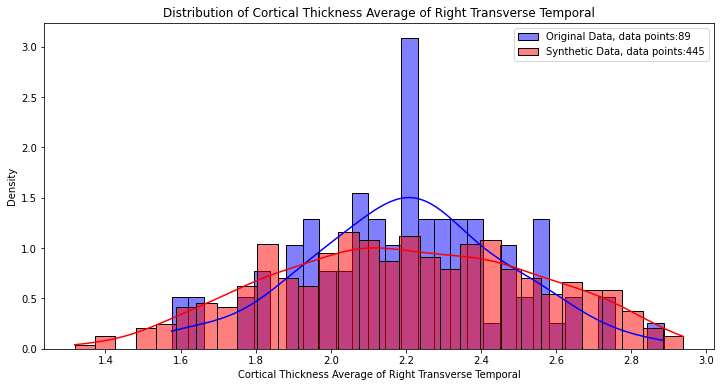

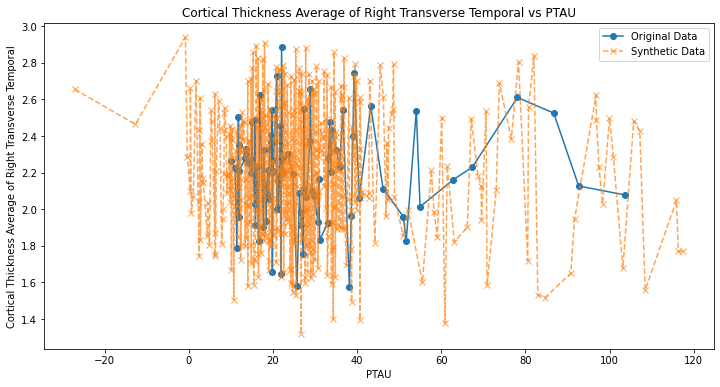

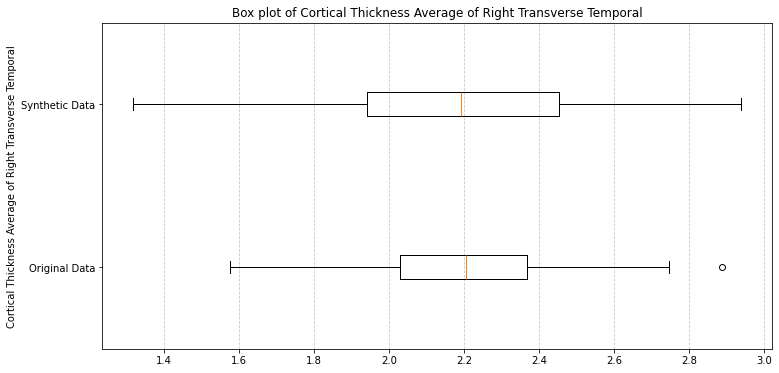

------------------------------------


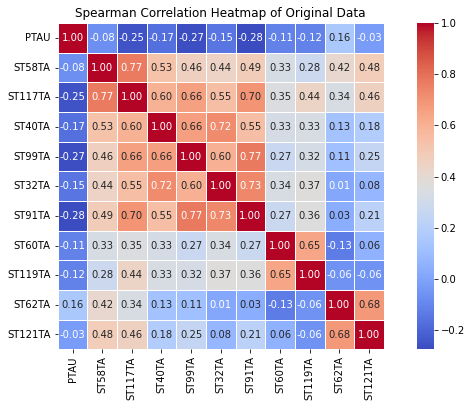

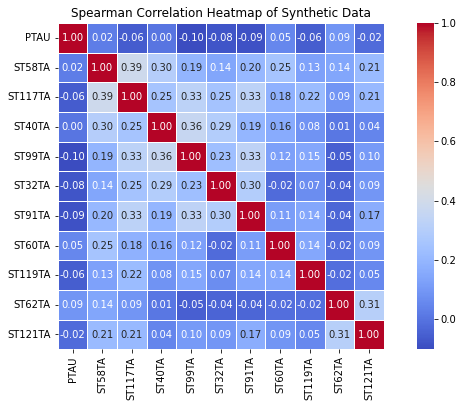

Mean absolute difference (MAD) of the correlation matrices: 0.19391241702857245
JS Divergence: 0.12240398293004312
Summary stats 0.023716109246417916
------------------------------------------------------------------------------------------------------------
Dependent variable: PLASMAPTAU181
Training with best parameters: {'batch_size': 32, 'discriminator_dim': (512, 256), 'discriminator_lr': 0.0008120216324754421, 'discriminator_steps': 1, 'embedding_dim': 64, 'epochs': 1000, 'generator_dim': (256, 256, 256), 'generator_lr': 3.0773919082539734e-05, 'pac': 4}


Gen. (-1.61) | Discrim. (-0.02): 100%|██████████| 1000/1000 [11:02<00:00,  1.51it/s]


Original data shape: (733, 11)
Synthetic data shape: (3665, 11)


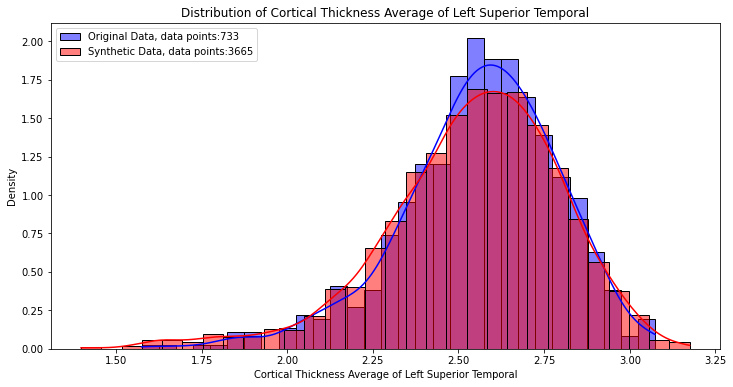

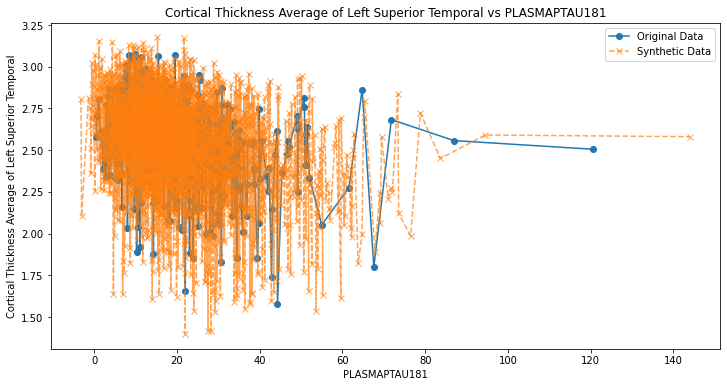

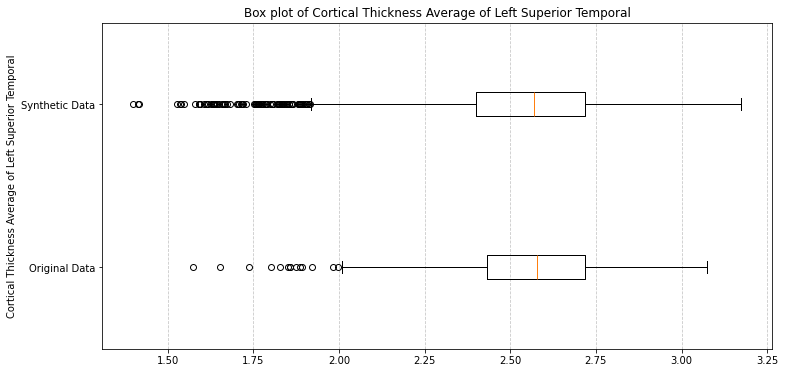

------------------------------------


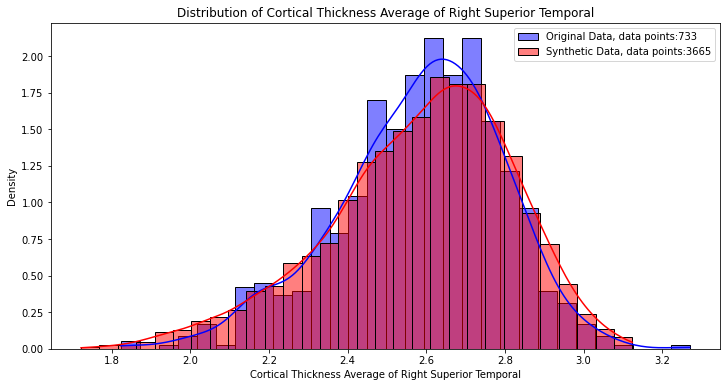

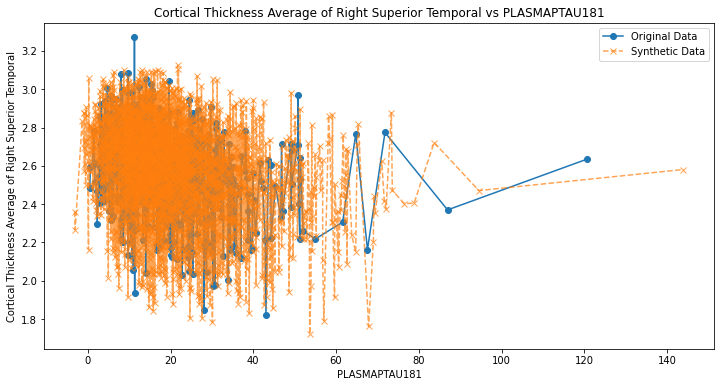

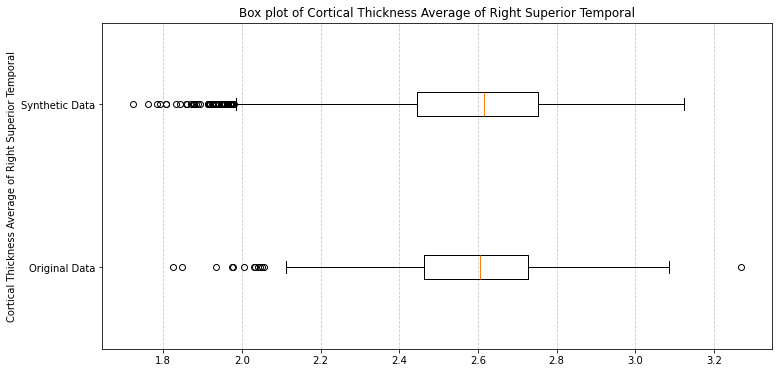

------------------------------------


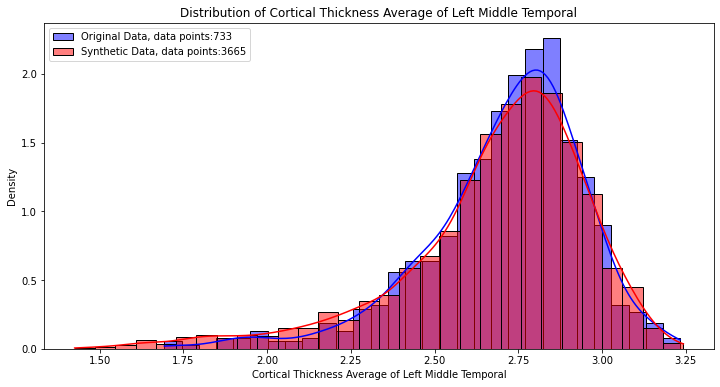

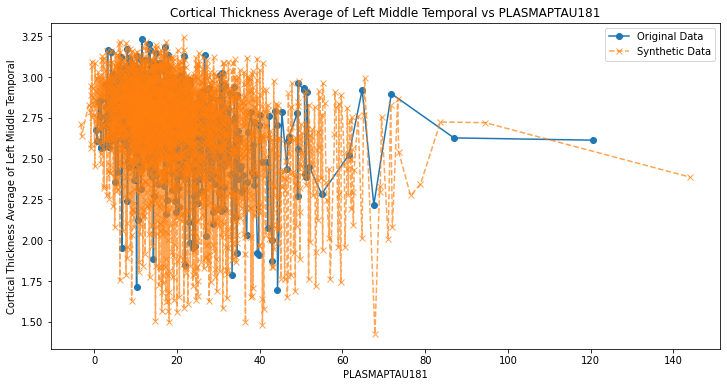

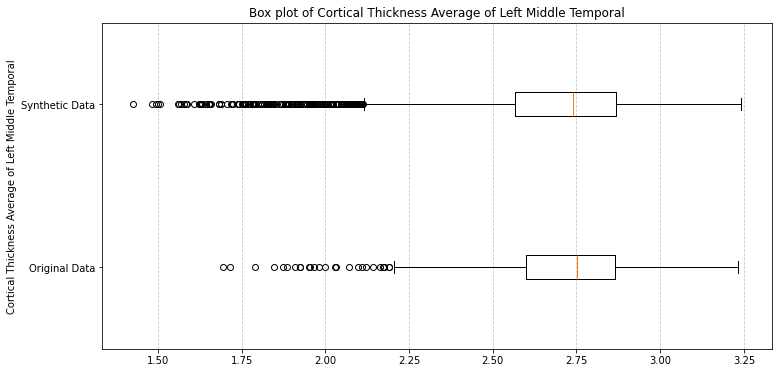

------------------------------------


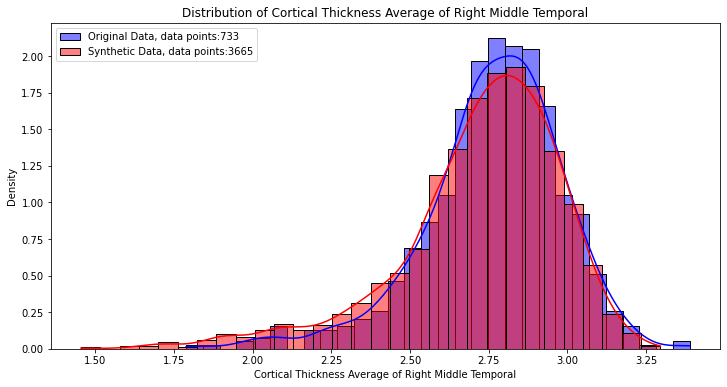

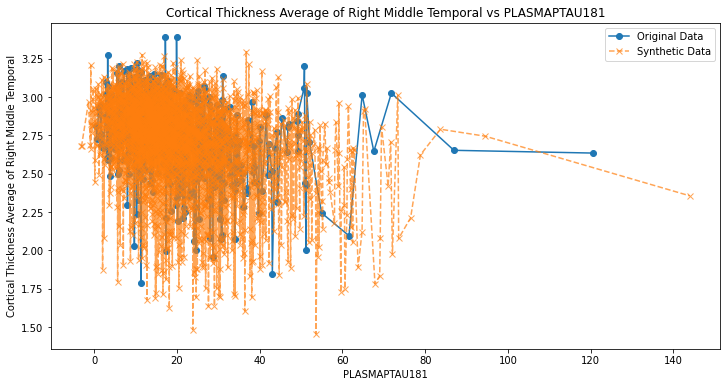

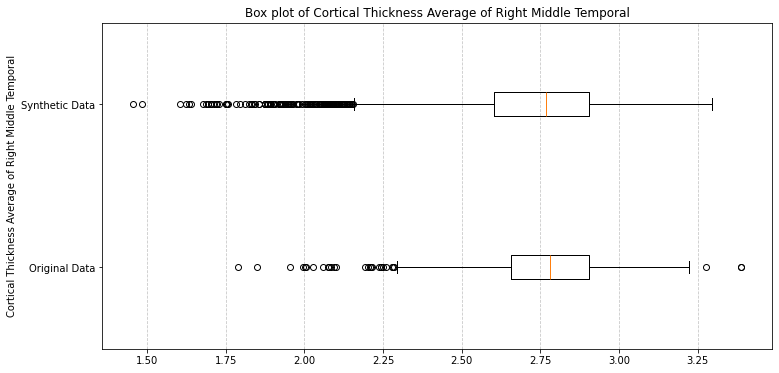

------------------------------------


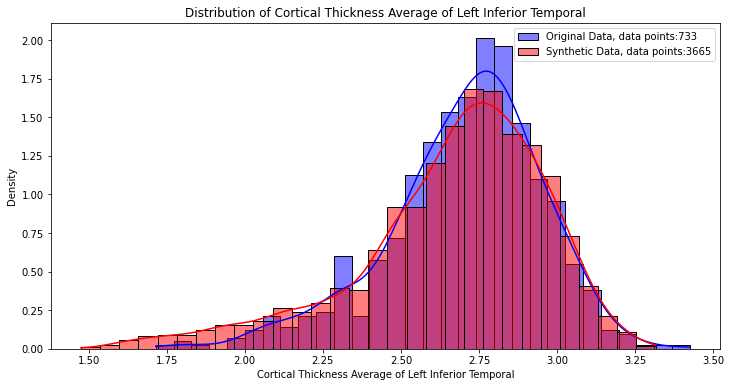

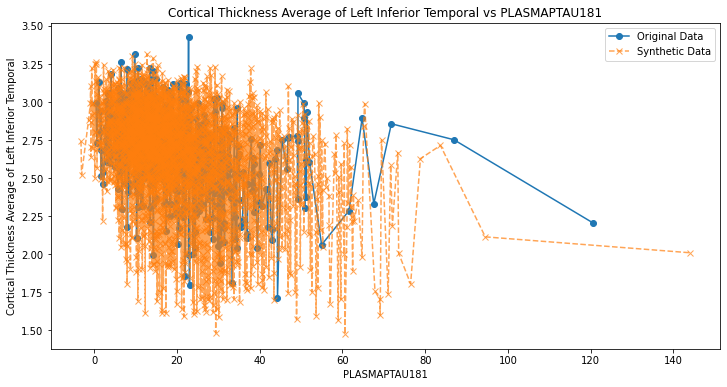

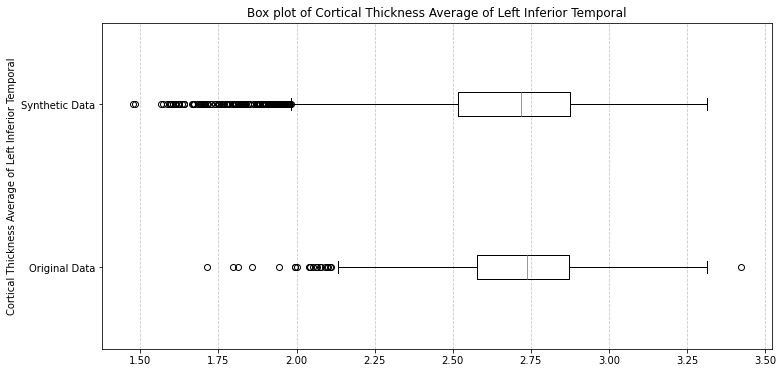

------------------------------------


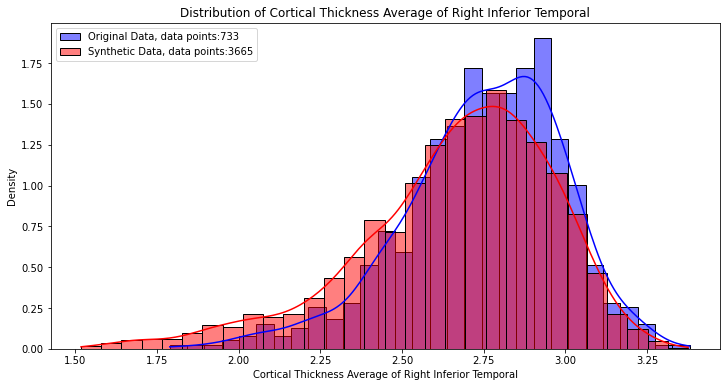

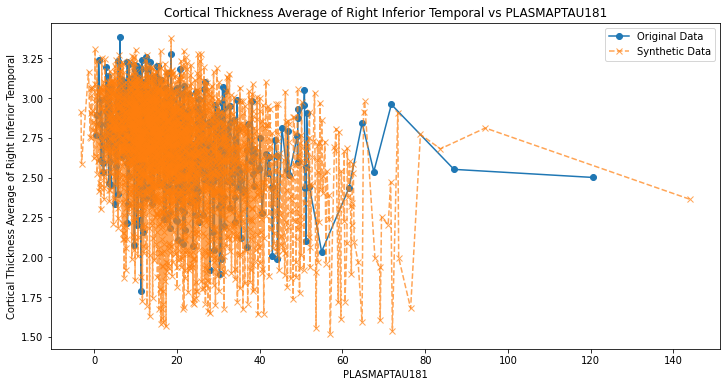

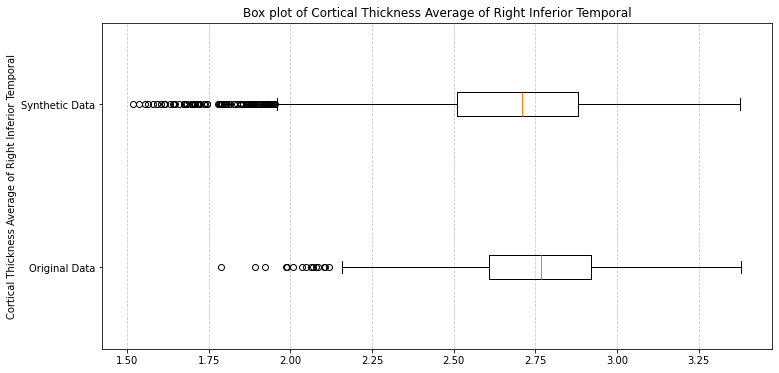

------------------------------------


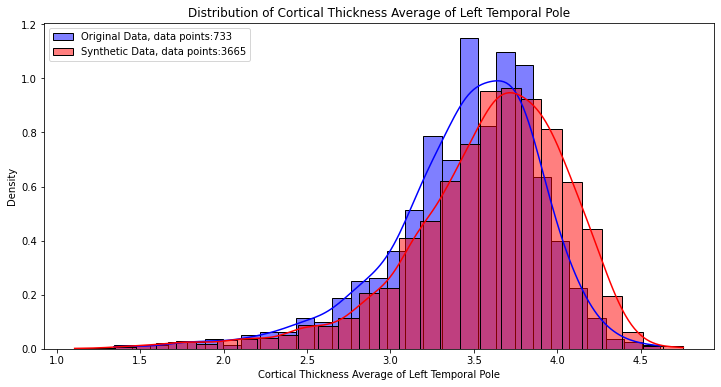

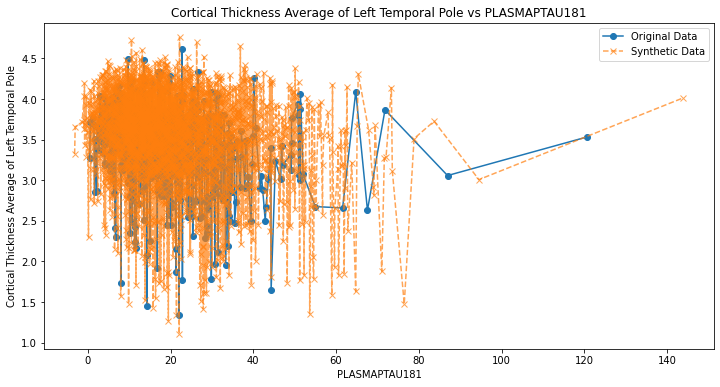

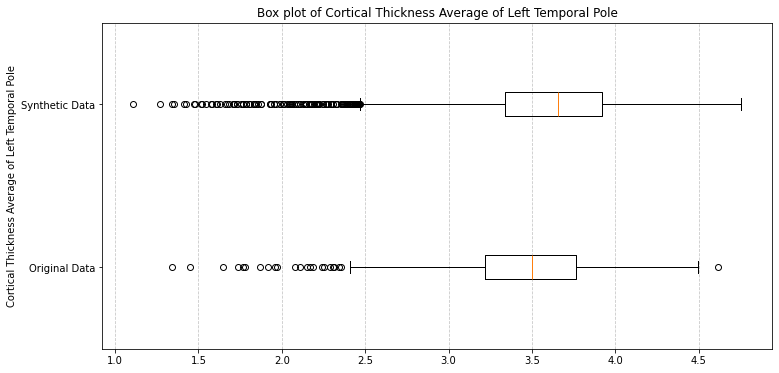

------------------------------------


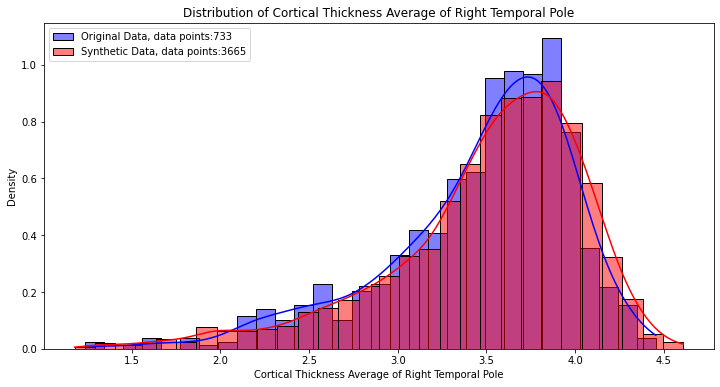

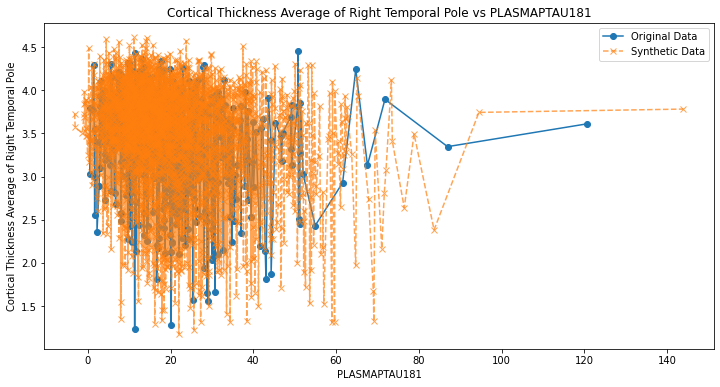

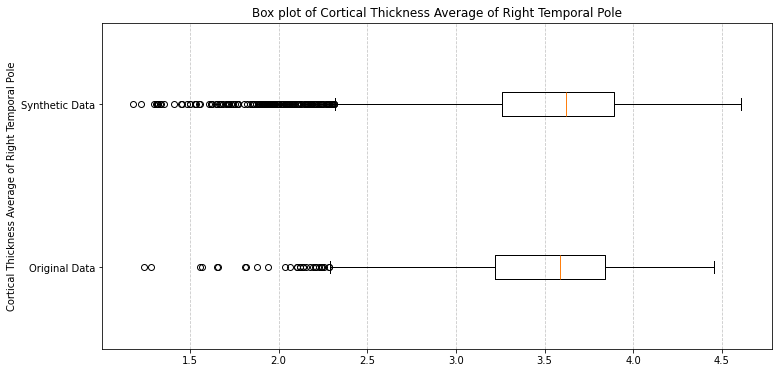

------------------------------------


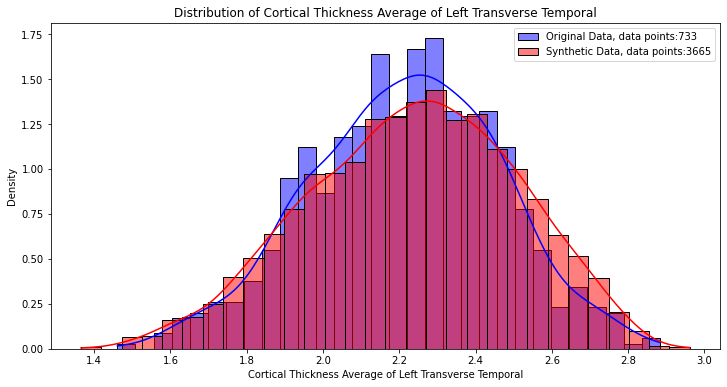

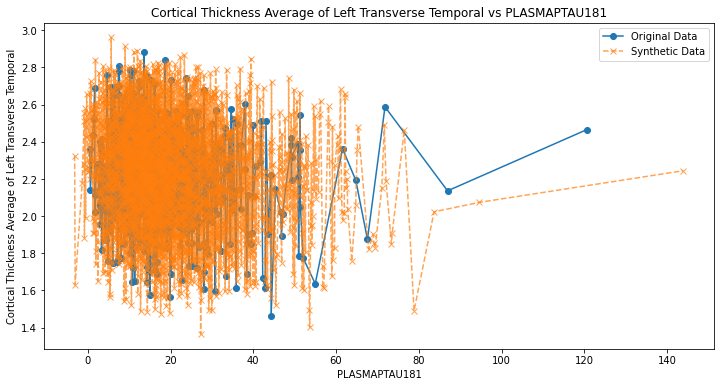

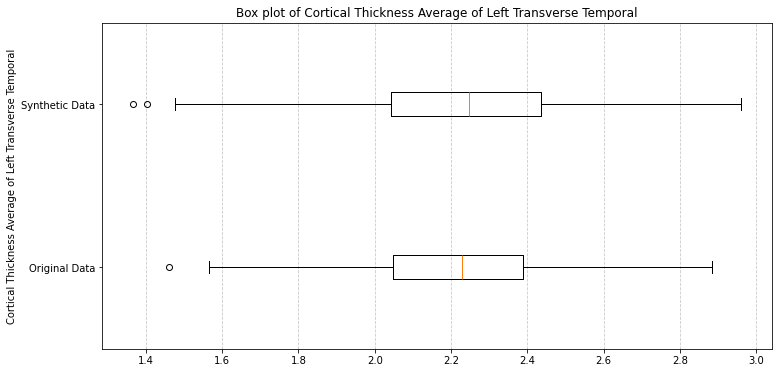

------------------------------------


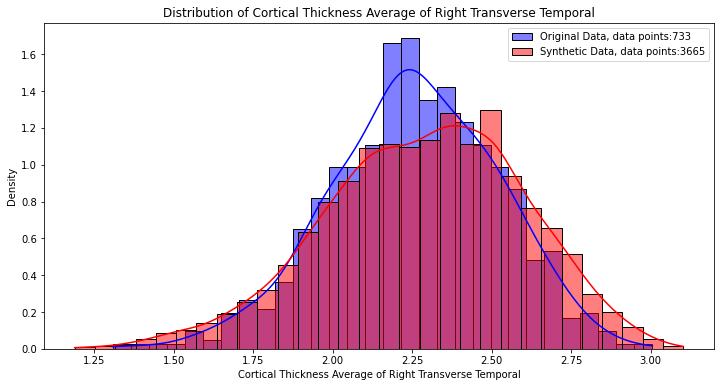

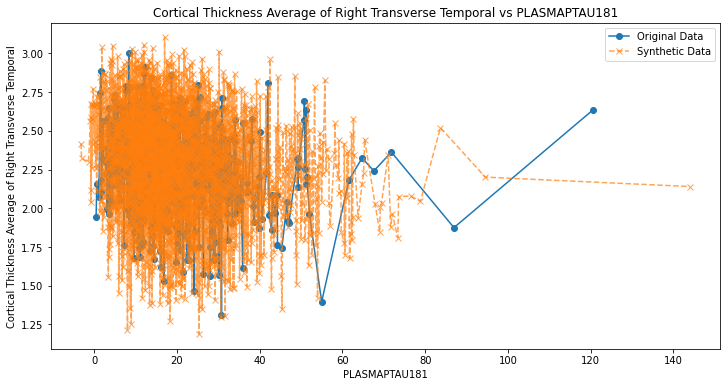

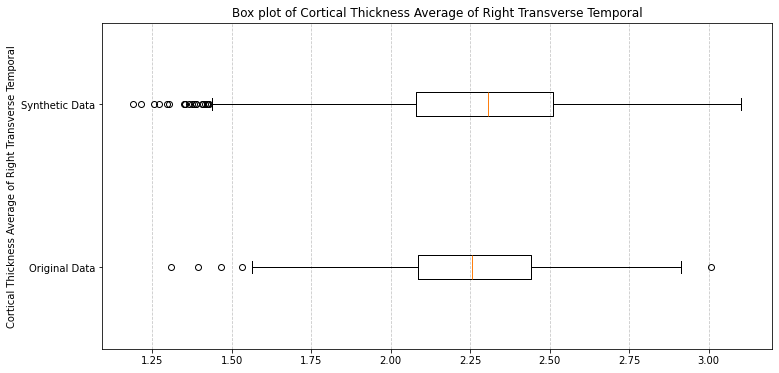

------------------------------------


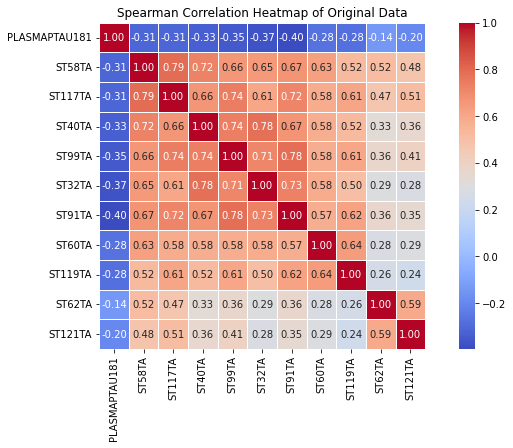

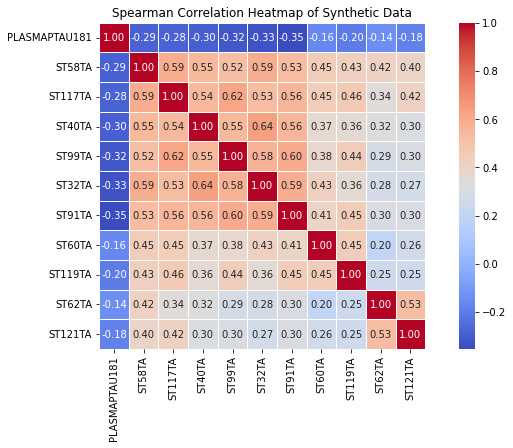

Mean absolute difference (MAD) of the correlation matrices: 0.09238135910460657
JS Divergence: 0.07673005037599301
Summary stats 0.021584563376684726
------------------------------------------------------------------------------------------------------------


In [ ]:
# CTGAN
# Using the best parameters to generate synthetic data from the original dataset

for dependent_variable in dependent_variables:
    print(f"Dependent variable: {dependent_variable}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_variable)

    scalar = RobustScaler()
    scaled_data = scalar.fit_transform(filtered_df)
    scaled_df = pd.DataFrame(scaled_data, columns=filtered_df.columns)

    noise_factor = 0.005
    scaled_df += np.random.normal(0, noise_factor, scaled_df.shape)

    hyper_params = best_params[dependent_variable]
    print(f"Training with best parameters: {hyper_params}")

    ctgan = CTGAN(
        epochs=int(hyper_params["epochs"]),
        verbose=True,
        batch_size=int(hyper_params["batch_size"]),
        generator_dim=tuple(map(int, hyper_params["generator_dim"])),
        discriminator_dim=tuple(map(int, hyper_params["discriminator_dim"])),
        generator_lr=hyper_params["generator_lr"],
        discriminator_lr=hyper_params["discriminator_lr"],
        embedding_dim=int(hyper_params["embedding_dim"]),
        pac=int(hyper_params["pac"]),
    )


    ctgan.fit(scaled_df)

    n_samples = 5 * len(filtered_df)
    generated_synthetic_data = ctgan.sample(n_samples)

    synthetic_data_dict["ctgan"][dependent_variable] = pd.DataFrame(
        scalar.inverse_transform(generated_synthetic_data),
        columns=scaled_df.columns
    )
    synthetic_data = synthetic_data_dict["ctgan"][dependent_variable]

    print(f"Original data shape: {filtered_df.shape}")
    print(f"Synthetic data shape: {synthetic_data.shape}")

    synthetic_data = synthetic_data.sort_values(by=dependent_variable)
    filtered_df = filtered_df.sort_values(by=dependent_variable)

    for col in target_names:
        plot_histogram(filtered_df, synthetic_data, dependent_variable, col)

        plot_scatter(filtered_df, synthetic_data, dependent_variable, col)

        plot_boxplot(filtered_df, synthetic_data, dependent_variable, col)

        print("------------------------------------")

    plot_correlation_heatmap(filtered_df, synthetic_data, dependent_variable)
    model_metrics["ctgan"][dependent_variable] = evaluate_model(filtered_df, synthetic_data)

    synthetic_data_dict["ctgan"][dependent_variable] = synthetic_data
    original_data_dict[dependent_variable] = filtered_df

    print(f"------------------------------------------------------------------------------------------------------------")

In [82]:
import csv

def save_hyperparameters_as_csv(best_params, dependent_variables, model_name):
    """
    Save the hyperparameters for each dependent variable as a CSV file.

    Parameters:
        best_params (dict): A dictionary containing the best hyperparameters for each dependent variable.
        dependent_variables (list): A list of dependent variables.
        model_name (str): The name of the model used to generate the hyperparameters.
    """

    # Collect all unique hyperparameters
    all_hyperparams = set()
    all_hyperparams.update(best_params[dependent_variables[0]].keys())
    all_hyperparams = list(all_hyperparams)

    # Create the CSV file
    with open(f"./hyperparameters/{model_name}/{model_name}_hyperparams.csv", mode='w', newline='') as file:
        writer = csv.writer(file)

        # Write header row (Hyperparameter names + dependent variables)
        writer.writerow(["Hyperparameter"] + dependent_variables)

        # Write hyperparameter values for each dependent variable in a column format
        for hyperparam in all_hyperparams:
            row = [hyperparam]  # Start row with hyperparameter name
            for dependent_variable in dependent_variables:
                value = best_params[dependent_variable].get(hyperparam, "N/A")  # Handle missing values

                # Convert tuples to readable format
                if isinstance(value, tuple):
                    value = "-".join(map(str, value))

                # Escape underscores for LaTeX
                hyperparam_safe = hyperparam.replace("_", r"\_")
                row[0] = hyperparam_safe  # Ensure the hyperparameter name is escaped
                row.append(value)

            writer.writerow(row)  # Write full row

    print(f"CSV file './hyperparameters/{model_name}/{model_name}_hyperparams.csv' generated successfully.")

def save_metrics_as_csv(model_metrics, dependent_variables, model_name):
    """
    Save the evaluation metrics for each dependent variable as a CSV file.

    Parameters:
        model_metrics (dict): A dictionary containing the evaluation metrics for each dependent variable.
        dependent_variables (list): A list of dependent variables.
        model_name (str): The name of the model used to generate the metrics.
    """

    # Collect all unique metrics
    all_metrics = set()
    all_metrics.update(model_metrics[dependent_variables[0]].keys())
    all_metrics = list(all_metrics)

    # Create the CSV file
    with open(f"./metrics/{model_name}/{model_name}_metrics.csv", mode='w', newline='') as file:
        writer = csv.writer(file)

        # Write header row (Metric names + dependent variables)
        writer.writerow(["Metric"] + dependent_variables)

        # Write metric values for each dependent variable in a column format
        for metric in all_metrics:
            row = [metric]  # Start row with metric name
            for dependent_variable in dependent_variables:
                value = model_metrics[dependent_variable].get(metric, "N/A")  # Handle missing values

                # Convert tuples to readable format
                if isinstance(value, tuple):
                    value = "-".join(map(str, value))

                # Escape underscores for LaTeX
                metric_safe = metric.replace("_", r"\_")
                row[0] = metric_safe  # Ensure the metric name is escaped
                row.append(value)

            writer.writerow(row)  # Write full row

    print(f"CSV file './metrics/{model_name}/{model_name}_metrics.csv' generated successfully.")

In [84]:
save_hyperparameters_as_csv(best_params, dependent_variables, "ctgan")
save_metrics_as_csv(model_metrics["ctgan"], dependent_variables, "ctgan")

CSV file './hyperparameters/ctgan/ctgan_hyperparams.csv' generated successfully.
CSV file './metrics/ctgan/ctgan_metrics.csv' generated successfully.


In [81]:
model_metrics["ctgan"]

{'ABETA42': {'correlation_diff': 0.12182763528657421,
  'jensen_shannon_divergence': 0.12098391535581139,
  'summary_stats': 0.028308602081651014},
 'APVOLUME': {'correlation_diff': 0.21661869782252555,
  'jensen_shannon_divergence': 0.1362423802762616,
  'summary_stats': 0.025960810699972803},
 'TAU': {'correlation_diff': 0.3214835211593549,
  'jensen_shannon_divergence': 0.1640902912162002,
  'summary_stats': 0.0414812723388184},
 'PTAU': {'correlation_diff': 0.19391241702857245,
  'jensen_shannon_divergence': 0.12240398293004312,
  'summary_stats': 0.023716109246417916},
 'PLASMAPTAU181': {'correlation_diff': 0.09238135910460657,
  'jensen_shannon_divergence': 0.07673005037599301,
  'summary_stats': 0.021584563376684726}}

In [ ]:
# VAE implementation Second

# import torch
import torch.nn as nn
import torch.optim as optim
# from torch.utils.data import DataLoader, TensorDataset

class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim=5):
        super().__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU()
        )

        # Latent space mu and sigma
        self.fc_mu = nn.Linear(32, latent_dim)
        self.fc_var = nn.Linear(32, latent_dim)

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 32),
            nn.ReLU(),
            nn.Linear(32, 64),
            nn.ReLU(),
            nn.Linear(64, input_dim)
        )

    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_var(h)

    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, log_var = self.encode(x)
        z = self.reparameterize(mu, log_var)
        return self.decode(z), mu, log_var

def vae_loss_function(recon_x, x, mu, log_var):
    # Reconstruction loss
    reconstruction_loss = nn.MSELoss(reduction='sum')(recon_x, x)

    # KL Divergence loss
    kl_loss = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

    return reconstruction_loss + kl_loss

In [ ]:
# VAE implementation Second
from sklearn.preprocessing import StandardScaler, RobustScaler

for dependent_var in dependent_variables:
    print(f"Dependent variable: {dependent_var}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_var)


    # Extract the independent variable (X) and target variable (y) values
    X = filtered_df[dependent_var].values
    y = filtered_df[target_names].values

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
    print(f"Using X_train: {X_train.shape} and y_train: {y_train.shape} to generate synthetic data")
    print(f"X_test: {X_test.shape} y_test: {y_test.shape} to be left for testing")

    data = pd.DataFrame({
        dependent_var: X_train
    })
    df = pd.DataFrame({
        dependent_var: X_train
    })
    test_data = pd.DataFrame({
        dependent_var: X_test
    })
    for i in range(y.shape[1]):
        data[target_names[i]] = y_train[:, i]
        df[target_names[i]] = y_train[:, i]
        test_data[target_names[i]] = y_test[:, i]


    # scalar = StandardScaler()
    scalar = RobustScaler()
    data = scalar.fit_transform(data)
    noise = 0.01
    data += np.random.normal(0, noise, data.shape)

    data_tensor = torch.tensor(data, dtype=torch.float32)

    batch_size = 8
    model = VAE(input_dim=data.shape[1], latent_dim=5)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    num_epochs = 500
    n_samples = 5 * len(data)
    # n_samples = 10000

    model.train()
    for epoch in range(num_epochs):
        epoch_loss = 0
        # Mini-batch training
        for i in range(0, len(data_tensor), batch_size):
            batch = data_tensor[i:i + batch_size]

            optimizer.zero_grad()
            reconstructed, mu, log_var = model(batch)
            loss = vae_loss_function(reconstructed, batch, mu, log_var)

            epoch_loss += loss.item()

            loss.backward()
            optimizer.step()
        print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss:.2f}")

    model.eval()
    with torch.no_grad():
        z = torch.randn(n_samples, model.fc_mu.out_features)
        generated_synthetic_data = model.decode(z).numpy()

    synthetic_data = pd.DataFrame(
        scalar.inverse_transform(generated_synthetic_data),
        columns=filtered_df.columns
    )
    # synthetic_data = df

    print(f"Synthetic data shape: {synthetic_data.shape}")
    print(f"Training X range: {X.min()} : {X.max()}")
    print(f"Synthetic X range: {synthetic_data[dependent_var].min()} : {synthetic_data[dependent_var].max()}")
    print(f"Original y range: {y.min()} : {y.max()}")
    print(f"Synthetic y range: {synthetic_data[target_names].min()} : {synthetic_data[target_names].max()}")

    synthetic_data = synthetic_data.sort_values(by=dependent_var)
    df = df.sort_values(by=dependent_var)

    for col in target_names:
        plt.figure(figsize=(12, 6))
        sns.histplot(df[col], kde=True, color='blue', label=f"Original Training Data, data points:{len(df)}", bins=30, stat="density")
        sns.histplot(synthetic_data[col], kde=True, color='red', label=f"Synthetic Data, data points:{synthetic_data.shape[0]}", bins=30, stat="density")
        plt.title(f"Distribution of {names[col]} with {dependent_var}")
        plt.xlabel(names[col])
        plt.ylabel("Density")
        plt.legend()
        plt.show()

        plt.figure(figsize=(12, 6))
        plt.plot(df[dependent_var], df[col], label="Original Training Data", linestyle='-', marker='o')
        plt.plot(synthetic_data[dependent_var], synthetic_data[col], label="Synthetic Data", linestyle='--', marker='x', alpha=0.7)
        # plt.scatter(outlier[dependent_var], outlier[col], color='red', label="Outlier Data", marker='x')
        plt.legend()
        plt.xlabel(dependent_var)
        plt.ylabel(names[col])
        plt.show()
        print("------------------------------------")

    plt.figure(figsize=(12, 6))
    original_training_data_correlation_matrix = df.corr(method="spearman")
    sns.heatmap(original_training_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
    plt.title('Spearman Correlation Heatmap of Original Training Data')
    plt.show()

    plt.figure(figsize=(12, 6))
    synthetic_data_correlation_matrix = synthetic_data.corr(method="spearman")
    sns.heatmap(synthetic_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
    plt.title('Spearman Correlation Heatmap of Synthetic Data')
    plt.show()

    pd.set_option('display.max_rows', None)

    print(f"Statisrucal description of Original data ")
    print(df.describe())

    print(f"Statisrucal description of Synthetic data ")
    print(synthetic_data.describe())

    synthetic_data_dict["vae"][dependent_var] = synthetic_data
    test_data_dict["vae"][dependent_var] = test_data
    print(f"------------------------------------------------------------------------------------------------------------")

In [ ]:
# GPR implementation

from sklearn.model_selection import train_test_split
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.gaussian_process.kernels import WhiteKernel, ExpSineSquared
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import IsolationForest

for dependent_var in dependent_variables:
    print(f"Dependent variable: {dependent_var}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_var)


    # Extract the independent variable (X) and target variable (y) values
    X = filtered_df[dependent_var].values
    y = filtered_df[target_names].values

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
    print(f"Using X_train: {X_train.shape} and y_train: {y_train.shape} to generate synthetic data")
    print(f"X_test: {X_test.shape} y_test: {y_test.shape} to be left for testing")

    original_X_train = pd.DataFrame({
        # f"{dependent_var}_original": X_train,
        dependent_var: X_train,
    })

    scalar = StandardScaler()
    # scalar = MinMaxScaler()
    X_train = scalar.fit_transform(X_train.reshape(-1, 1))
    X_test = scalar.transform(X_test.reshape(-1, 1))

    # original_X_train[f"{dependent_var}_scaled"]= X_train.flatten()

    X_train = X_train.reshape(-1, 1)

    param_grid = {
        'kernel': [
            C(1.0, (1e-3, 1e3)) * (RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e5)) + ExpSineSquared(length_scale=1.0, periodicity=1.0, length_scale_bounds=(1e-2, 1e5), periodicity_bounds=(1e-2, 1e3))) +
            WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1)),
            C(1.0, (1e-4, 1e3)) * RBF(1.0, (1e-4, 1e12)) + WhiteKernel(noise_level=1e-5, noise_level_bounds=(1e-10, 1e1)),
            C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e5)) + WhiteKernel()
        ],
        'alpha': [1e-10, 1e-5, 1e-3, 0.0],  # Noise level for GPR
        'n_restarts_optimizer': [5, 10, 20],  # Optimizer restarts
        'random_state': [0]  # Random seed
    }

    gpr = GaussianProcessRegressor()

    grid_search = GridSearchCV(
    estimator=gpr,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # Metric to minimize
    cv=3,  # Cross-validation folds
    verbose=2,
    n_jobs=-1  # Parallel processing
)
    grid_search.fit(X_train, y_train)

    # Best hyperparameters
    print("Best Parameters:", grid_search.best_params_)
    print("Best Score:", grid_search.best_score_)

    best_model = grid_search.best_estimator_

    # Generate new feature points in the range of X_train
    n_samples = 5*len(original_X_train)
    X_synthetic = np.linspace(X.min(), X.max(), n_samples).reshape(-1, 1)
    X_synthetic = scalar.transform(X_synthetic)

    # Predict synthetic data using the trained Gaussian Process Regressor model
    y_pred, y_std = best_model.predict(X_synthetic, return_std=True)

    # Add some noise to simulate more realistic data/ introduce uncertainty/variability
    # noise = np.random.normal(0, y_std[:, None], y_pred.shape)
    # y_synthetic = y_pred + noise
    y_synthetic = y_pred

    # noise_dict[dependent_var] = noise

    X_synthetic_original = scalar.inverse_transform(X_synthetic)

    # print(f"Generated synthetic data for {dependent_var}")
    print(f"X_synthetic: {X_synthetic.shape}, y_synthetic: {y_synthetic.shape}")
    print(f"Training X range: {X.min()} : {X.max()}")
    print(f"Synthetic X range: {X_synthetic_original.min()} : {X_synthetic_original.max()}, shape: {X_synthetic_original.shape}")
    print(f"Synthetic X range scaled: {X_synthetic.min()} : {X_synthetic.max()}")
    print(f"Original y range: {y.min()} : {y.max()}")
    print(f"Synthetic y range: {y_synthetic.min()} : {y_synthetic.max()}")

    synthetic_data = pd.DataFrame({
        # f"{dependent_var}_synthetic_scaled": X_synthetic.flatten(),
        # f"{dependent_var}_synthetic_original": X_synthetic_original.flatten(),
        dependent_var: X_synthetic_original.flatten(),
    })

    test_data = pd.DataFrame({
        f"{dependent_var}_test": X_test.flatten(),
        f"{dependent_var}_test_original": scalar.inverse_transform(X_test).flatten(),
    })

    original_X_train = original_X_train.sort_values(by=dependent_var)

    for i in range(y_synthetic.shape[1]):
        synthetic_data[target_names[i]] = y_synthetic[:, i]
        test_data[target_names[i]] = y_test[:, i]
        original_X_train[target_names[i]] = y_train[:, i]

    for col in target_names:
        plt.figure(figsize=(12, 6))
        sns.histplot(original_X_train[col], kde=True, color='blue', label=f"Original Training Data, data points:{len(original_X_train)}", bins=30)
        sns.histplot(synthetic_data[col], kde=True, color='red', label=f"Synthetic Data, data points:{n_samples}", bins=30)
        plt.title(f"Distribution of {names[col]} with {dependent_var}")
        plt.xlabel(names[col])
        plt.ylabel("Density")
        plt.legend()
        plt.show()

        plt.figure(figsize=(12, 6))
        plt.plot(original_X_train[dependent_var], original_X_train[col], label="Original Training Data", linestyle='-', marker='o')
        plt.plot(synthetic_data[dependent_var], synthetic_data[col], label="Synthetic Data", linestyle='--', marker='x', alpha=0.7)
        # plt.scatter(outlier[dependent_var], outlier[col], color='red', label="Outlier Data", marker='x')
        plt.legend()
        plt.xlabel(dependent_var)
        plt.ylabel(names[col])
        plt.show()
        print("------------------------------------")

    plt.figure(figsize=(12, 6))
    original_training_data_correlation_matrix = original_X_train.corr(method="spearman")
    sns.heatmap(original_training_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
    plt.title('Spearman Correlation Heatmap of Original Training Data')
    plt.show()

    plt.figure(figsize=(12, 6))
    synthetic_data_correlation_matrix = synthetic_data.corr(method="spearman")
    sns.heatmap(synthetic_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
    plt.title('Spearman Correlation Heatmap of Synthetic Data')
    plt.show()

    # synthetic_data.to_csv(f"../synthetic_data/synthetic_data_{dependent_var}.csv", index=False)
    # test_data.to_csv(f"../test_data/test_data_{dependent_var}.csv", index=False)
    # original_X_train.to_csv(f"../test_data/original_X_train_{dependent_var}.csv", index=False)

    print()

In [ ]:
# %pip install catboost xgboost

In [ ]:
print(f"{synthetic_data_dict['ctgan']['TAU'].shape}")
print(f"{test_data_dict['ctgan']['TAU'].shape}")
print(f"{synthetic_data_dict['vae']['TAU'].shape}")
print(f"{test_data_dict['vae']['TAU'].shape}")


In [ ]:
len(synthetic_data_dict)

In [ ]:
# Using all synthetic data to train the models and testing with the original that was not used generating synthetic data

from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

models = {
    "Random Forest": RandomForestRegressor(n_estimators=100),
    "XGBoost": XGBRegressor(objective='reg:squarederror'),
    "Linear Regression": LinearRegression(),
    # "CatBoost": CatBoostRegressor(verbose=0)
}

synthetic_data_models = ["ctgan", "vae"]
for synthetic_data_model in synthetic_data_models:
    print(f"Synthetic Data Model: {synthetic_data_model}")
    print()
    for name, model in models.items():
        print(f"Model: {name}")

        for dependent_variable in dependent_variables:
            X_train = synthetic_data_dict[synthetic_data_model][dependent_variable][dependent_variable].values.reshape(-1, 1)
            y_train = synthetic_data_dict[synthetic_data_model][dependent_variable][target_names].values
            X_test = test_data_dict[synthetic_data_model][dependent_variable][dependent_variable].values.reshape(-1, 1)
            y_test = test_data_dict[synthetic_data_model][dependent_variable][target_names].values

            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            mse = mean_squared_error(y_test, y_pred)
            r2_from_sklearn = r2_score(y_test, y_pred)
            r2_from_model = model.score(X_test, y_test)
            print(f"Results for: {dependent_variable}")
            print(f"Mean Squared Error: {mse:.4f}, R2 Score from sklearn: {r2_from_sklearn:.4f}, R2 Score from model: {r2_from_model:.4f}")
        print()
    print("------------------------------------------------------------------------------------------------------------")

In [ ]:
synthetic_data_dict["ctgan"]["ABETA42"][target_names].values.shape

In [ ]:
# Using the synthetic data for training and testing

from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

models = {
    "Random Forest": RandomForestRegressor(n_estimators=100),
    "XGBoost": XGBRegressor(objective='reg:squarederror'),
    "Linear Regression": LinearRegression(),
    # "CatBoost": CatBoostRegressor(verbose=0)
}

synthetic_data_models = ["ctgan", "vae"]
for synthetic_data_model in synthetic_data_models:
    print(f"Synthetic Data Model: {synthetic_data_model}")
    print()
    for name, model in models.items():
        print(f"Model: {name}")

        for dependent_variable in dependent_variables:
            X = synthetic_data_dict[synthetic_data_model][dependent_variable][dependent_variable].values.reshape(-1, 1)
            y = synthetic_data_dict[synthetic_data_model][dependent_variable][target_names].values
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            mse = mean_squared_error(y_test, y_pred)
            r2_from_sklearn = r2_score(y_test, y_pred)
            r2_from_model = model.score(X_test, y_test)
            print(f"Results for: {dependent_variable}")
            print(f"Mean Squared Error: {mse:.4f}, R2 Score from sklearn: {r2_from_sklearn:.4f}, R2 Score from model: {r2_from_model:.4f}")
        print()
    print("------------------------------------------------------------------------------------------------------------")

In [ ]:
# Using the synthetic data for training and testing with the original data

from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

models = {
    "Random Forest": RandomForestRegressor(n_estimators=100),
    "XGBoost": XGBRegressor(objective='reg:squarederror'),
    "Linear Regression": LinearRegression(),
    # "CatBoost": CatBoostRegressor(verbose=0)
}

# synthetic_data_models = ["ctgan", "vae"]
synthetic_data_models = ["ctgan"]
for synthetic_data_model in synthetic_data_models:
    print(f"Synthetic Data Model: {synthetic_data_model}")
    print()
    for name, model in models.items():
        print(f"Model: {name}")

        for dependent_variable in dependent_variables:
            # X = synthetic_data_dict[synthetic_data_model][dependent_variable][dependent_variable].values.reshape(-1, 1)
            # y = synthetic_data_dict[synthetic_data_model][dependent_variable][target_names].values
            # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.0, random_state=42)
            X_train = synthetic_data_dict[synthetic_data_model][dependent_variable][dependent_variable].values.reshape(-1, 1)
            y_train = synthetic_data_dict[synthetic_data_model][dependent_variable][target_names].values
            X_test = original_data_dict[dependent_variable][dependent_variable].values.reshape(-1, 1)
            y_test = original_data_dict[dependent_variable][target_names].values


            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            mse = mean_squared_error(y_test, y_pred)
            r2_from_sklearn = r2_score(y_test, y_pred)
            r2_from_model = model.score(X_test, y_test)
            print(f"Results for: {dependent_variable}")
            print(f"Mean Squared Error: {mse:.4f}, R2 Score from sklearn: {r2_from_sklearn:.4f}, R2 Score from model: {r2_from_model:.4f}")
        print()
    print("------------------------------------------------------------------------------------------------------------")